Loading Librarires 

In [1]:
import os
import numpy as np
import cv2
import librosa
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, roc_auc_score, auc
from imblearn.over_sampling import SMOTE
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, label_binarize
from collections import Counter
import matplotlib.pyplot as plt
import seaborn as sns
import random
import warnings

warnings.filterwarnings("ignore")  # Suppress warnings globally

Data Paths

In [3]:
# Paths to the face and voice datasets
FACE_DATA_DIR = r"c:\Users\aishu\OneDrive - University of South Florida\Documents\Trustworthy\face"
VOICE_DATA_DIR = r"c:\Users\aishu\OneDrive - University of South Florida\Documents\Trustworthy\Audio"

Confusion Matrix 

Plots the confusion matrix for visual evaluation of model predictions.
Parameters:
- cm: Confusion matrix
- classes: Class labels

In [4]:
# Helper Functions
def plot_confusion_matrix(cm, classes):
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title("Confusion Matrix")
    plt.show()

Multiclass ROC-AUC curve

Plots the ROC curve for multiclass classification.
Parameters:
- classifier: Trained classifier
- X_test: Test features
- y_test: True labels
- classes: Class labels

In [5]:
def plot_multiclass_roc_curve(classifier, X_test, y_test, classes):
    y_test_binarized = label_binarize(y_test, classes=classes)
    y_score = classifier.predict_proba(X_test)
 
    fpr, tpr, roc_auc = {}, {}, {}
    for i, class_label in enumerate(classes):
        fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
 
    plt.figure()
    for i, class_label in enumerate(classes):
        plt.plot(fpr[i], tpr[i], label=f"Class {class_label} (AUC = {roc_auc[i]:.2f})")
    plt.plot([0, 1], [0, 1], "k--", label="Random Guess")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC Curve for Multiclass Classification")
    plt.legend(loc="lower right")
    plt.show()
 
    macro_auc = roc_auc_score(y_test_binarized, y_score, average="macro")
    print(f"Macro-average ROC AUC: {macro_auc:.2f}")

EER and d-prime 

calculate_eer

Calculates the Equal Error Rate (EER) from FPR and TPR values.
Parameters:
- fpr: False Positive Rates
- tpr: True Positive Rates
- thresholds: Threshold values
Returns:
- eer: Equal Error Rate
- eer_threshold: Threshold corresponding to EER

calculate_d_prime

Calculates the D-prime value to measure separation between genuine and impostor distributions.
Parameters:
- genuine_scores: Scores for genuine samples
- impostor_scores: Scores for impostor samples
Returns:
- d_prime: D-prime value

plot_score_distribution

Plots the score distribution for genuine and impostor samples.
Parameters:
- genuine_scores: Scores for genuine samples
- impostor_scores: Scores for impostor samples

In [6]:
def calculate_eer(fpr, tpr, thresholds):
    fnr = 1 - tpr
    eer_threshold = thresholds[np.nanargmin(np.abs(fpr - fnr))]
    eer = fpr[np.nanargmin(np.abs(fpr - fnr))]
    return eer, eer_threshold
 
def calculate_d_prime(genuine_scores, impostor_scores):
    mean_genuine = np.mean(genuine_scores)
    mean_impostor = np.mean(impostor_scores)
    std_genuine = np.std(genuine_scores)
    std_impostor = np.std(impostor_scores)
    d_prime = (mean_genuine - mean_impostor) / np.sqrt(0.5 * (std_genuine**2 + std_impostor**2))
    return d_prime
 
def plot_score_distribution(genuine_scores, impostor_scores):
    plt.figure(figsize=(10, 6))
    sns.histplot(genuine_scores, color='green', label='Genuine', kde=True, stat='density')
    sns.histplot(impostor_scores, color='red', label='Impostor', kde=True, stat='density')
    plt.xlabel("Score")
    plt.ylabel("Density")
    plt.title("Score Distribution")
    plt.legend()
    plt.show()

Data Augumentation

Feature Extraction Functions:

The extract_edge_features function processes an image to detect edges using the Canny edge detection method. This is useful for capturing structural details of the image, which can serve as robust features for image classification or recognition tasks.
The extract_spectral_contrast function extracts audio features related to the contrast between spectral peaks and valleys, helping analyze and classify audio signals.

Image Augmentation:

The augment_image function applies a series of transformations to an image, including rotation, flipping, and brightness adjustments. These augmentations introduce variability to the dataset, making the model more robust to different orientations and lighting conditions.

Face Data Augmentation Pipeline:

The augment_face_data function creates a more diverse training dataset by augmenting each input face image multiple times. It combines the augmented image data with edge features to create enriched feature vectors. This approach improves the quality and quantity of the dataset, helping to prevent overfitting in machine learning models.

In [7]:
def extract_edge_features(image):
    image_8bit = (image * 255).astype(np.uint8)
    edges = cv2.Canny(image_8bit, threshold1=100, threshold2=200)
    return edges.flatten()
 
def extract_spectral_contrast(signal, sr):
    return librosa.feature.spectral_contrast(y=signal, sr=sr).flatten()
 
def augment_image(image):
    rows, cols = image.shape
    angle = random.uniform(-15, 15)
    M = cv2.getRotationMatrix2D((cols / 2, rows / 2), angle, 1)
    rotated = cv2.warpAffine(image, M, (cols, rows))
    flip = random.choice([-1, 0, 1])  # Horizontal, vertical, or both
    flipped = cv2.flip(rotated, flip)
    brightness = random.uniform(0.8, 1.2)
    adjusted = np.clip(flipped * brightness, 0, 1)
    return adjusted
 
def augment_face_data(X_faces, y_faces):
    augmented_faces, augmented_labels = [], []
    for image, label in zip(X_faces, y_faces):
        image = image.reshape(128, 128)
        edge_features = extract_edge_features(image)
        for _ in range(3):
            augmented_faces.append(np.hstack((augment_image(image).flatten(), edge_features)))
            augmented_labels.append(label)
    return np.array(augmented_faces), np.array(augmented_labels)

Loading the Data

create_face_labels:

Extracts and processes face images from the dataset.
Returns:
- Processed face images and their corresponding labels

process_voice:

Extracts and processes voice features from the dataset.
Returns:
- Processed voice features and their corresponding labels

In [8]:
def create_face_labels(directory):
    images, labels = [], []
    for label in os.listdir(directory):
        label_path = os.path.join(directory, label)
        if os.path.isdir(label_path):
            for file in os.listdir(label_path):
                if file.lower().endswith(('.jpg', '.jpeg', '.png')):
                    img = cv2.imread(os.path.join(label_path, file), cv2.IMREAD_GRAYSCALE)
                    if img is not None:
                        img_resized = cv2.resize(img, (128, 128)) / 255.0
                        images.append(img_resized.flatten())
                        labels.append(label)
    print(f"Loaded {len(images)} face images with {len(set(labels))} unique labels.")
    return np.array(images), np.array(labels)
 
def process_voice(directory):
    voice_features, voice_labels = [], []
    max_length = 300
    for label in os.listdir(directory):
        label_path = os.path.join(directory, label)
        if os.path.isdir(label_path):
            for file in os.listdir(label_path):
                if file.lower().endswith('.wav'):
                    path = os.path.join(label_path, file)
                    try:
                        signal, sr = librosa.load(path, sr=16000)
                        mfcc = librosa.feature.mfcc(y=signal, sr=sr, n_mfcc=13).flatten()
                        spectral_contrast = extract_spectral_contrast(signal, sr)
                        combined_features = np.hstack((mfcc, spectral_contrast))
                        if len(combined_features) < max_length:
                            combined_features = np.pad(combined_features, (0, max_length - len(combined_features)), mode="constant")
                        elif len(combined_features) > max_length:
                            combined_features = combined_features[:max_length]
                        voice_features.append(combined_features)
                        voice_labels.append(label)
                    except Exception as e:
                        print(f"Error processing file {path}: {e}")
    print(f"Voice features extracted: {len(voice_features)}")
    return np.array(voice_features), np.array(voice_labels)

Aligning Face data and Voice data 

In [9]:
def align_face_voice_data(X_faces, y_faces, X_voices, y_voices):
    common_labels = set(y_faces) & set(y_voices)
    print(f"Common users: {len(common_labels)}")
   
    X_faces_aligned, y_faces_aligned = [], []
    X_voices_aligned, y_voices_aligned = [], []
   
    for label in common_labels:
        face_indices = [i for i, y in enumerate(y_faces) if y == label]
        voice_indices = [i for i, y in enumerate(y_voices) if y == label]
        min_samples = min(len(face_indices), len(voice_indices))
        X_faces_aligned.extend(X_faces[face_indices[:min_samples]])
        y_faces_aligned.extend([label] * min_samples)
        X_voices_aligned.extend(X_voices[voice_indices[:min_samples]])
        y_voices_aligned.extend([label] * min_samples)
   
    print(f"Aligned Face Data Shape: {np.array(X_faces_aligned).shape}")
    print(f"Aligned Voice Data Shape: {np.array(X_voices_aligned).shape}")
    return (
        np.array(X_faces_aligned),
        np.array(y_faces_aligned),
        np.array(X_voices_aligned),
        np.array(y_voices_aligned),
    )



Visulaize the Results

In [10]:
def visualize_results(fold_metrics, classifier_name):
    """Visualize fold metrics for a given classifier."""
    metrics = ['accuracy', 'macro_roc_auc', 'average_eer', 'd_prime']
    titles = ['Accuracy', 'Macro-average ROC AUC', 'Average EER', 'D-prime']
    y_labels = ['Accuracy', 'ROC AUC', 'EER', 'D-prime']
    
    for metric, title, y_label in zip(metrics, titles, y_labels):
        plt.figure(figsize=(8, 6))
        plt.plot(fold_metrics[metric], marker='o', linestyle='-', label=f'{metric} per fold')
        plt.axhline(y=np.mean(fold_metrics[metric]), color='r', linestyle='--', label=f'Mean {title}')
        plt.title(f'{title} across Folds for {classifier_name}')
        plt.xlabel('Fold')
        plt.ylabel(y_label)
        plt.legend()
        plt.grid(True)
        plt.show()


The function compare_and_visualize provides an effective mechanism to compare and visualize performance metrics across different systems (Face-Only, Voice-Only, and Multimodal). It facilitates both numerical and visual analysis, which is essential for performance evaluation in machine learning projects.

In [11]:
def compare_and_visualize_results(unimodal_metrics, multimodal_metrics, metric_names):
    """Compare and visualize unimodal vs. multimodal metrics."""
    comparison_df = pd.DataFrame({
        "Metric": metric_names,
        "Face-Only": unimodal_metrics["Face"],
        "Voice-Only": unimodal_metrics["Voice"],
        "Multimodal": multimodal_metrics
    })
    
    # Print comparison table
    print("\nPerformance Comparison (Unimodal vs. Multimodal):")
    print(comparison_df.to_string(index=False))

    # Bar plot for visualization
    comparison_df.plot(
        x="Metric",
        kind="bar",
        figsize=(12, 6),
        title="Performance Comparison (Unimodal vs. Multimodal)"
    )
    plt.ylabel("Score")
    plt.xticks(rotation=0)
    plt.legend(title="System")
    plt.grid(axis="y", linestyle="--", alpha=0.7)
    plt.show()

Training the model

In [12]:
from sklearn.model_selection import StratifiedKFold

def train_and_evaluate_with_cv(X_combined, y_combined, n_splits=5):
    # Ensure balanced classes using SMOTE
    class_counts = Counter(y_combined)
    min_samples = min(class_counts.values())
    smote_neighbors = min(5, min_samples - 1) if min_samples > 1 else 1
    smote = SMOTE(random_state=42, k_neighbors=smote_neighbors)
    try:
        X_balanced, y_balanced = smote.fit_resample(X_combined, y_combined)
    except ValueError as e:
        print(f"Error during SMOTE resampling: {e}")
        return

    # Initialize Stratified K-Fold
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

    # Initialize classifiers
    classifiers = {
        "Random Forest": RandomForestClassifier(n_estimators=200, random_state=42),
        "SVM": SVC(kernel='linear', probability=True, random_state=42),
        "kNN": KNeighborsClassifier(n_neighbors=5),
    }
    overall_metrics = {}
    for name, clf in classifiers.items():
        print(f"\nEvaluating {name} with {n_splits}-fold cross-validation...")
        fold_metrics = {"accuracy": [], "macro_roc_auc": [], "average_eer": [], "d_prime": []}

        for train_idx, test_idx in skf.split(X_balanced, y_balanced):
            X_train, X_test = X_balanced[train_idx], X_balanced[test_idx]
            y_train, y_test = y_balanced[train_idx], y_balanced[test_idx]

            # Feature scaling
            scaler = StandardScaler()
            X_train = scaler.fit_transform(X_train)
            X_test = scaler.transform(X_test)

            # Train the model
            clf.fit(X_train, y_train)
            y_pred = clf.predict(X_test)

            # Classification report
            print(f"\nClassification Report for Fold:")
            print(classification_report(y_test, y_pred))

            # Confusion matrix visualization
            cm = confusion_matrix(y_test, y_pred)
            plot_confusion_matrix(cm, classes=np.unique(y_faces_aligned))

            # Multiclass ROC Curve
            if hasattr(clf, "predict_proba"):
                y_score = clf.predict_proba(X_test)
                plot_multiclass_roc_curve(clf, X_test, y_test, classes=np.unique(y_faces_aligned))

                # Compute ROC and EER
                y_test_binarized = label_binarize(y_test, classes=np.unique(y_combined))
                n_classes = y_test_binarized.shape[1]
                fpr, tpr, thresholds = {}, {}, {}
                eer_values = []
                genuine_scores, impostor_scores = [], []

                for i in range(n_classes):
                    fpr[i], tpr[i], thresholds[i] = roc_curve(y_test_binarized[:, i], y_score[:, i])
                    eer, eer_threshold = calculate_eer(fpr[i], tpr[i], thresholds[i])
                    eer_values.append(eer)

                    genuine_scores.extend(y_score[y_test_binarized[:, i] == 1, i])
                    impostor_scores.extend(y_score[y_test_binarized[:, i] == 0, i])


                
                # Step 12: Score distribution visualization
                plot_score_distribution(genuine_scores, impostor_scores)

                avg_eer = np.mean(eer_values)
                macro_roc_auc = roc_auc_score(y_test_binarized, y_score, average="macro")
                d_prime_value = calculate_d_prime(np.array(genuine_scores), np.array(impostor_scores))

                fold_metrics["accuracy"].append(np.mean(y_test == y_pred))
                fold_metrics["macro_roc_auc"].append(macro_roc_auc)
                fold_metrics["average_eer"].append(avg_eer)
                fold_metrics["d_prime"].append(d_prime_value)

        #Report fold averages
        print(f"\n{name} Cross-Validation Results:")
        print(f"Mean Accuracy: {np.mean(fold_metrics['accuracy']):.4f}")
        print(f"Mean Macro ROC AUC: {np.mean(fold_metrics['macro_roc_auc']):.4f}")
        print(f"Mean Average EER: {np.mean(fold_metrics['average_eer']):.4f}")
        print(f"Mean D-prime: {np.mean(fold_metrics['d_prime']):.4f}")
        overall_metrics = {key: np.mean(value) for key, value in fold_metrics.items()}
        #visualize results for the classifier
        visualize_results(fold_metrics, name)
        
    return overall_metrics

Main Execution

In [13]:
# Main Execution
X_faces, y_faces = create_face_labels(FACE_DATA_DIR)
X_faces_aug, y_faces_aug = augment_face_data(X_faces, y_faces)
X_voices, y_voices = process_voice(VOICE_DATA_DIR)
X_faces_aligned, y_faces_aligned, X_voices_aligned, y_voices_aligned = align_face_voice_data(
    X_faces_aug, y_faces_aug, X_voices, y_voices
)
X_combined = np.hstack((X_faces_aligned, X_voices_aligned))


Loaded 427 face images with 30 unique labels.
Voice features extracted: 30000
Common users: 30
Aligned Face Data Shape: (1281, 32768)
Aligned Voice Data Shape: (1281, 300)


Evaluating Only Face System


Evaluating Face-Only System...

Evaluating Random Forest with 5-fold cross-validation...

Classification Report for Fold:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        18
           1       1.00      1.00      1.00        18
          10       1.00      1.00      1.00        18
          11       1.00      1.00      1.00        17
          12       1.00      1.00      1.00        18
          13       1.00      1.00      1.00        17
          14       0.94      0.94      0.94        17
          15       1.00      1.00      1.00        17
          16       1.00      1.00      1.00        18
          17       1.00      0.94      0.97        17
          18       1.00      1.00      1.00        17
          19       1.00      1.00      1.00        17
           2       1.00      1.00      1.00        17
          20       1.00      1.00      1.00        18
          21       1.00      1.00      1.00        18
          22

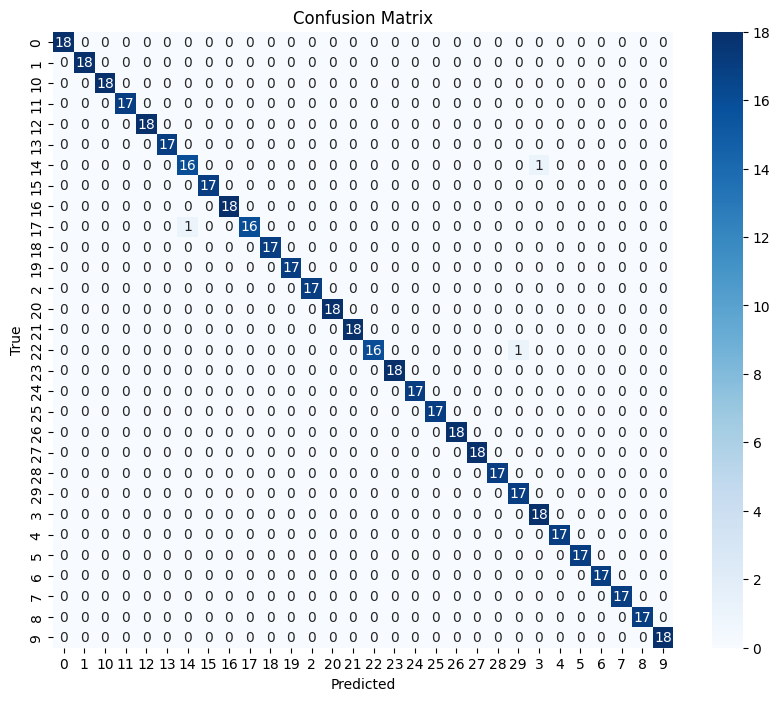

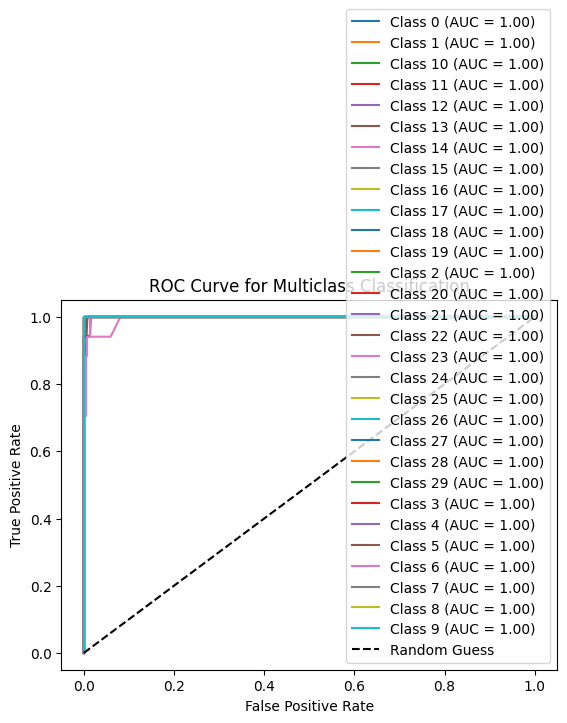

Macro-average ROC AUC: 1.00


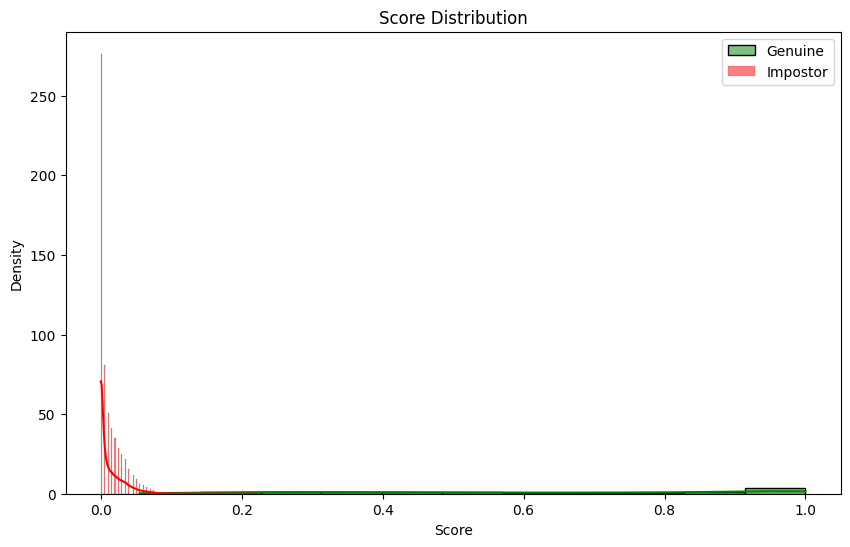


Classification Report for Fold:
              precision    recall  f1-score   support

           0       0.94      1.00      0.97        17
           1       1.00      1.00      1.00        17
          10       1.00      1.00      1.00        18
          11       1.00      1.00      1.00        17
          12       1.00      1.00      1.00        17
          13       1.00      1.00      1.00        17
          14       1.00      1.00      1.00        17
          15       1.00      1.00      1.00        18
          16       1.00      1.00      1.00        18
          17       1.00      1.00      1.00        17
          18       1.00      1.00      1.00        17
          19       1.00      1.00      1.00        18
           2       1.00      1.00      1.00        18
          20       1.00      1.00      1.00        17
          21       1.00      1.00      1.00        18
          22       1.00      1.00      1.00        17
          23       1.00      1.00      1.00     

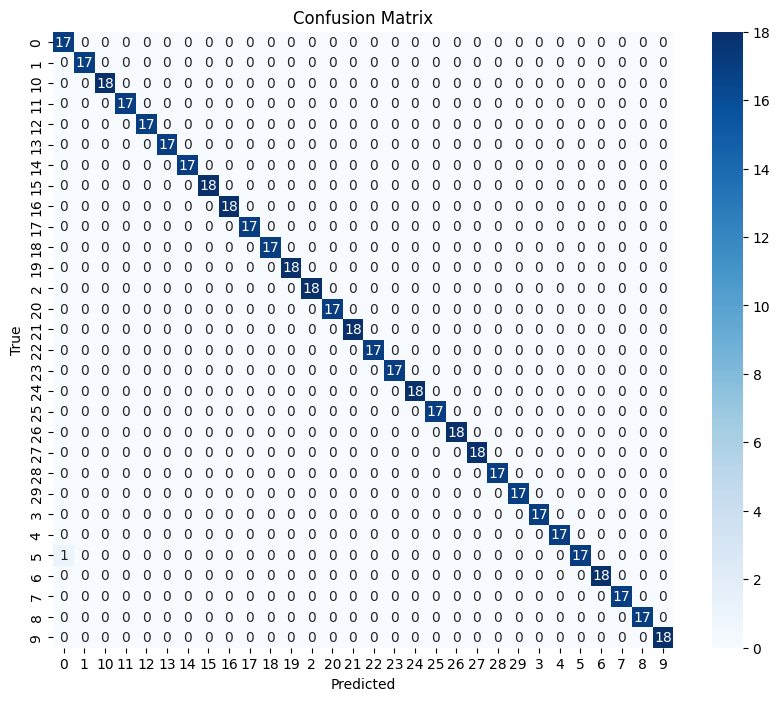

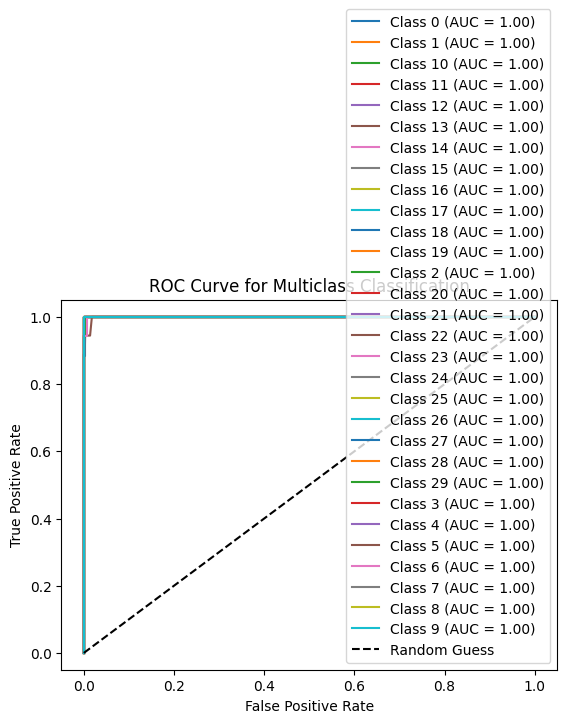

Macro-average ROC AUC: 1.00


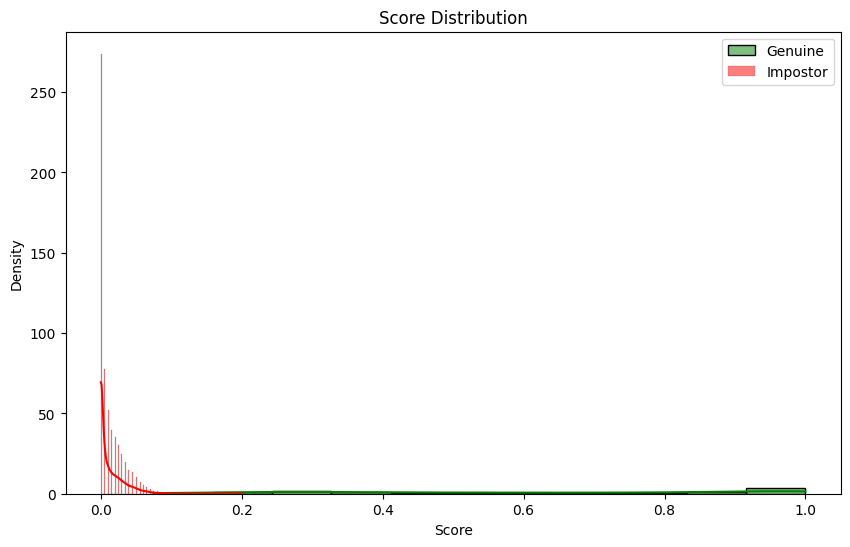


Classification Report for Fold:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        17
           1       1.00      1.00      1.00        17
          10       1.00      1.00      1.00        17
          11       1.00      1.00      1.00        18
          12       1.00      0.88      0.94        17
          13       1.00      1.00      1.00        18
          14       1.00      1.00      1.00        17
          15       1.00      1.00      1.00        18
          16       1.00      1.00      1.00        17
          17       1.00      1.00      1.00        17
          18       1.00      1.00      1.00        18
          19       1.00      1.00      1.00        18
           2       1.00      1.00      1.00        18
          20       1.00      1.00      1.00        17
          21       1.00      0.94      0.97        17
          22       0.95      1.00      0.97        18
          23       1.00      1.00      1.00     

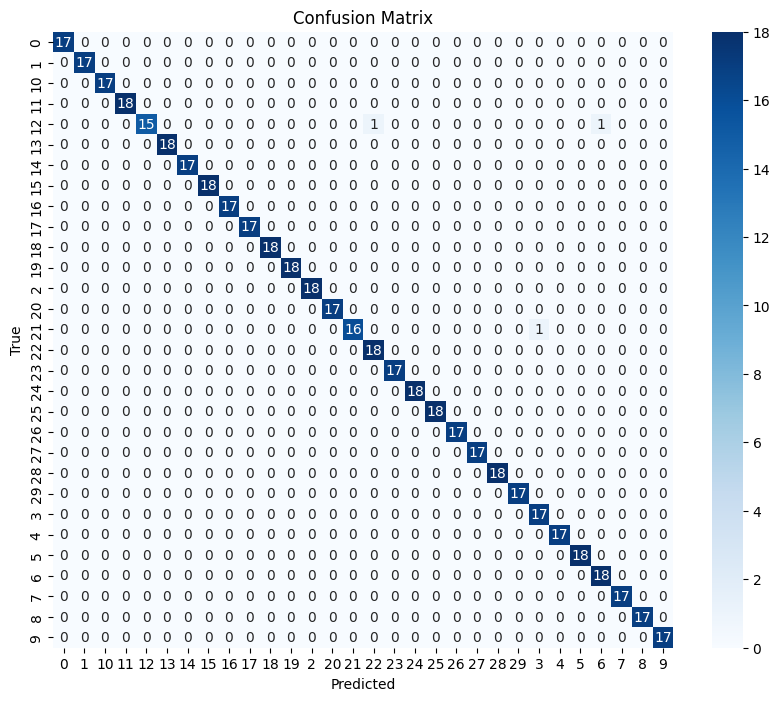

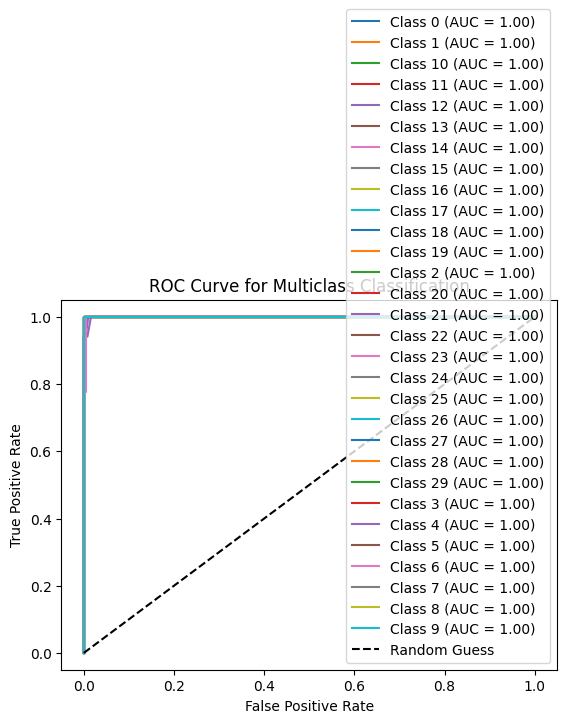

Macro-average ROC AUC: 1.00


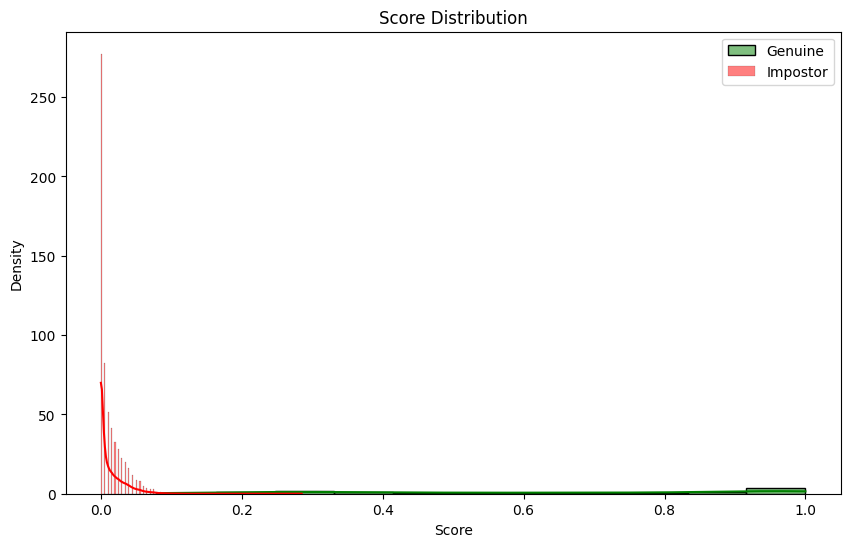


Classification Report for Fold:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        17
           1       1.00      1.00      1.00        17
          10       1.00      1.00      1.00        17
          11       1.00      1.00      1.00        18
          12       1.00      1.00      1.00        17
          13       1.00      0.94      0.97        18
          14       0.89      0.94      0.92        18
          15       0.94      1.00      0.97        17
          16       1.00      1.00      1.00        17
          17       1.00      0.78      0.88        18
          18       1.00      0.83      0.91        18
          19       1.00      1.00      1.00        17
           2       1.00      1.00      1.00        17
          20       0.89      1.00      0.94        17
          21       1.00      1.00      1.00        17
          22       1.00      0.94      0.97        18
          23       1.00      1.00      1.00     

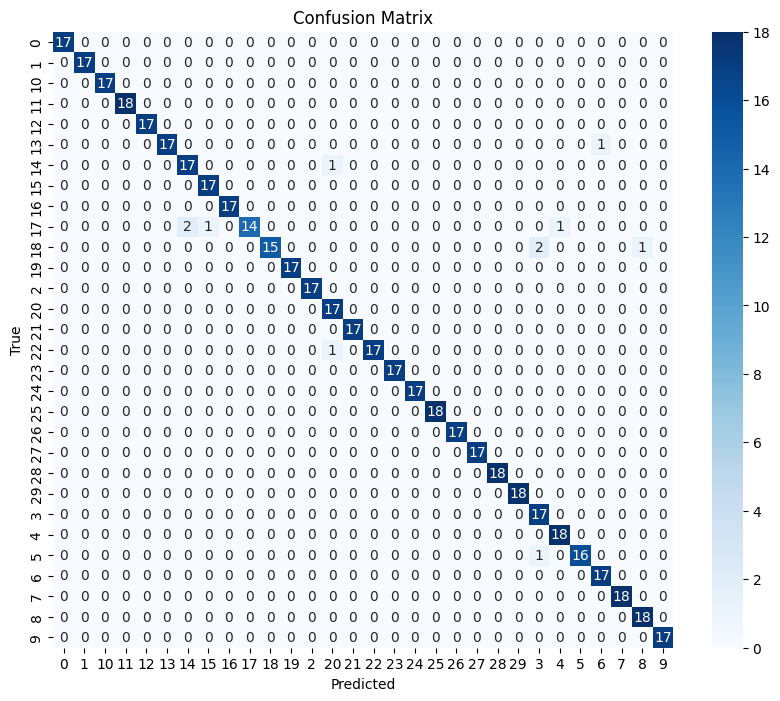

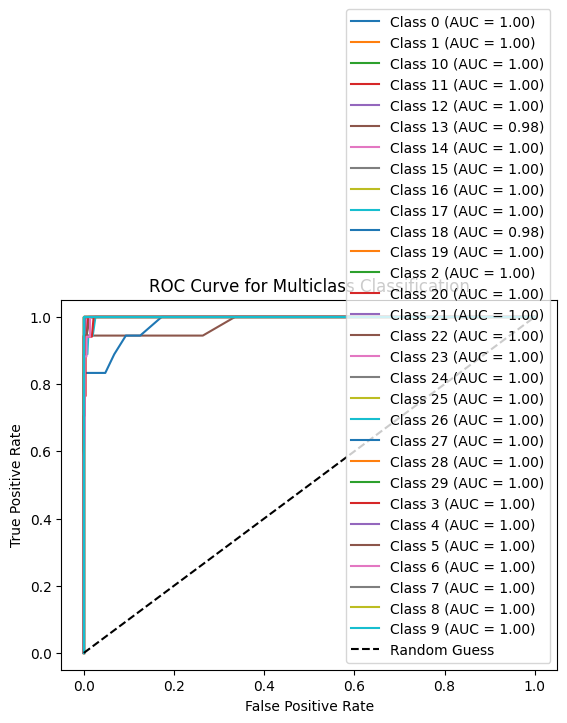

Macro-average ROC AUC: 1.00


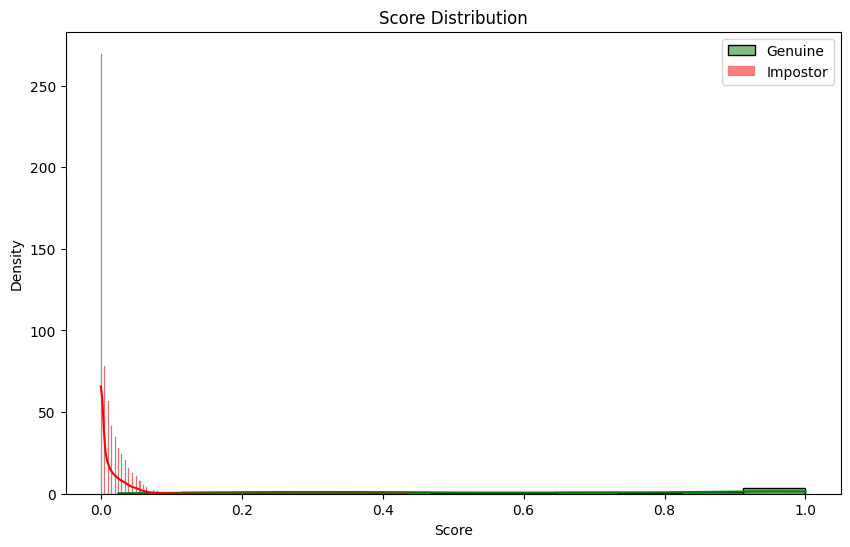


Classification Report for Fold:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        18
           1       1.00      1.00      1.00        18
          10       0.94      1.00      0.97        17
          11       1.00      1.00      1.00        17
          12       1.00      0.94      0.97        18
          13       1.00      1.00      1.00        17
          14       1.00      0.89      0.94        18
          15       1.00      1.00      1.00        17
          16       1.00      1.00      1.00        17
          17       1.00      1.00      1.00        18
          18       0.89      1.00      0.94        17
          19       1.00      1.00      1.00        17
           2       1.00      1.00      1.00        17
          20       1.00      1.00      1.00        18
          21       0.94      0.94      0.94        17
          22       1.00      0.94      0.97        17
          23       1.00      1.00      1.00     

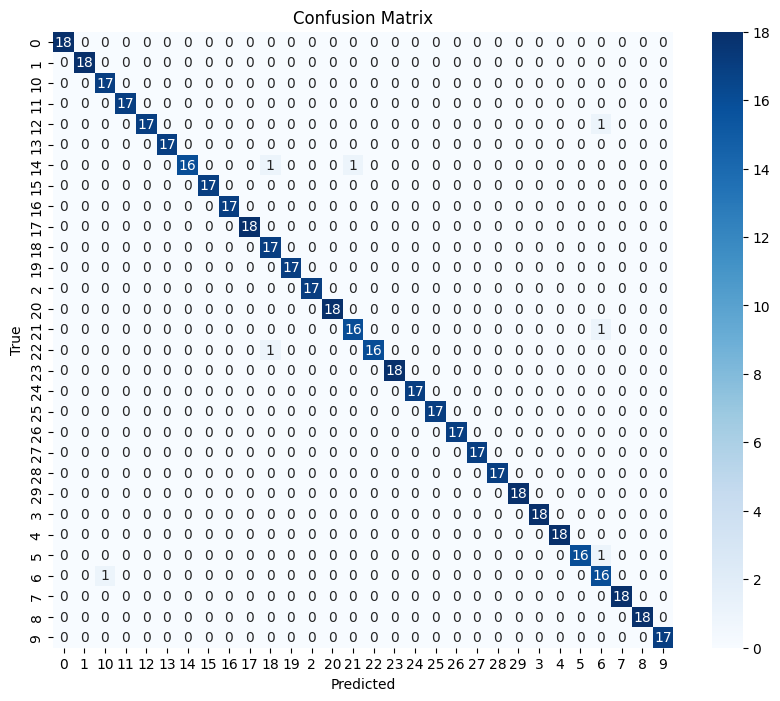

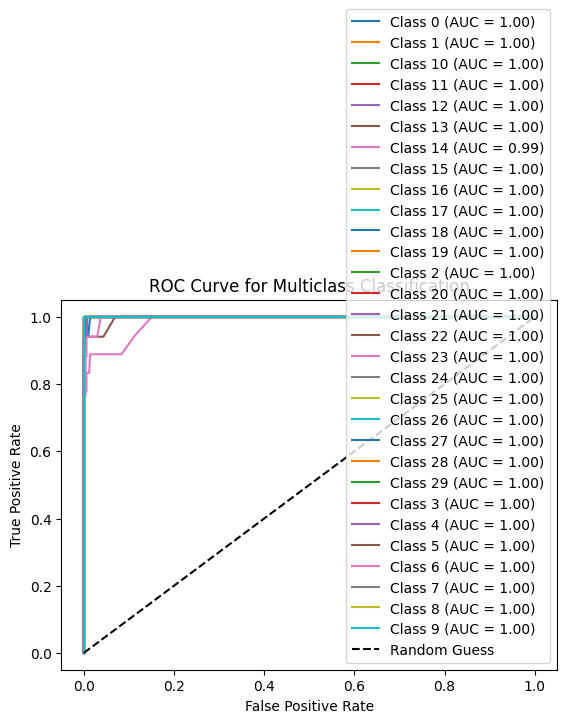

Macro-average ROC AUC: 1.00


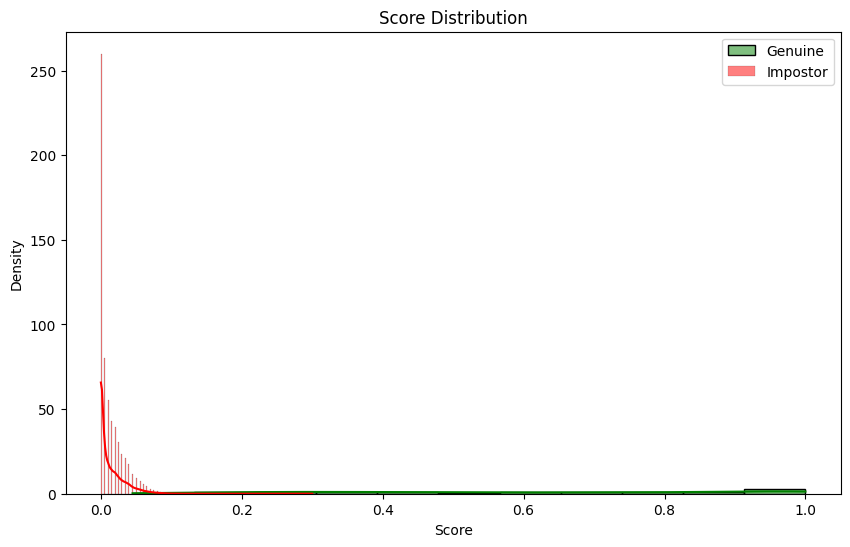


Random Forest Cross-Validation Results:
Mean Accuracy: 0.9904
Mean Macro ROC AUC: 0.9995
Mean Average EER: 0.0040
Mean D-prime: 2.8334


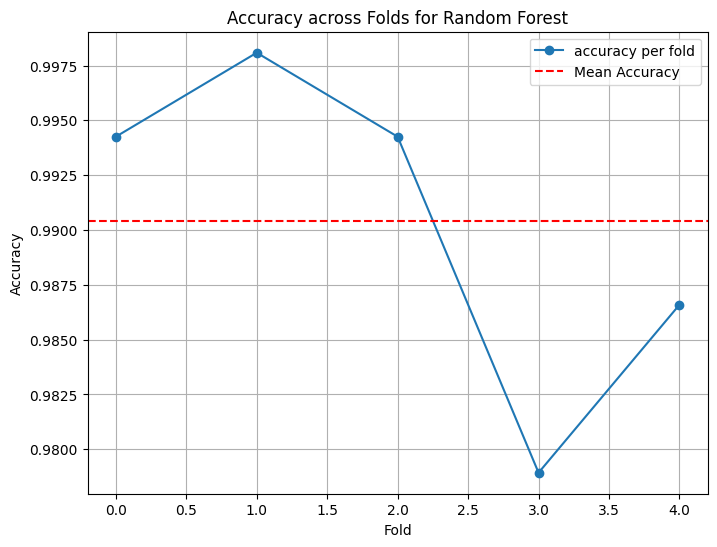

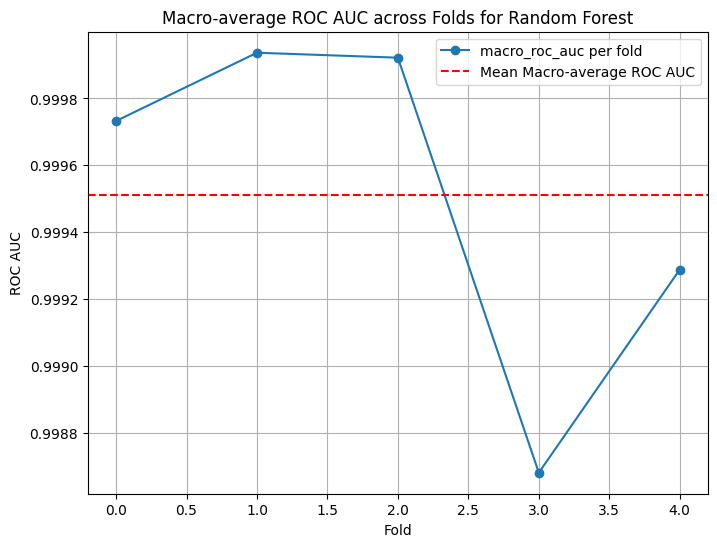

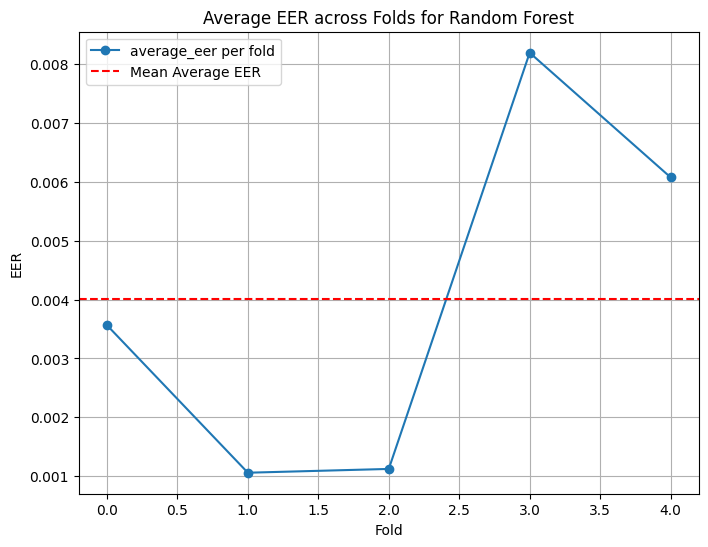

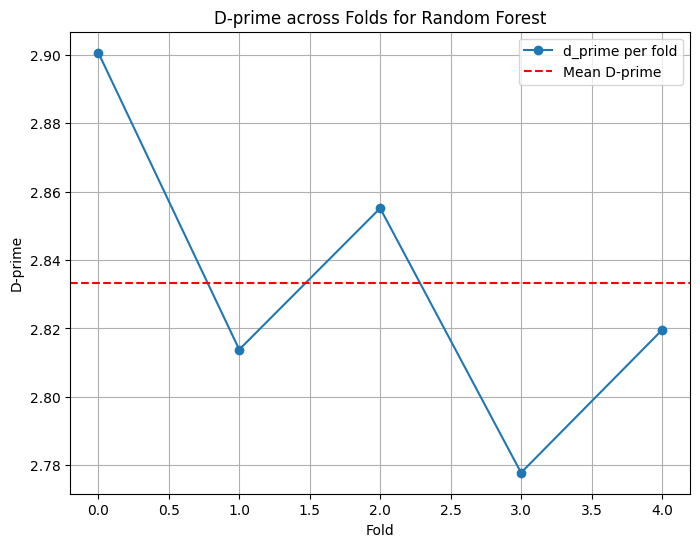


Evaluating SVM with 5-fold cross-validation...

Classification Report for Fold:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        18
           1       1.00      1.00      1.00        18
          10       1.00      1.00      1.00        18
          11       1.00      1.00      1.00        17
          12       1.00      1.00      1.00        18
          13       1.00      1.00      1.00        17
          14       1.00      1.00      1.00        17
          15       1.00      1.00      1.00        17
          16       1.00      1.00      1.00        18
          17       1.00      1.00      1.00        17
          18       1.00      1.00      1.00        17
          19       1.00      1.00      1.00        17
           2       1.00      1.00      1.00        17
          20       1.00      1.00      1.00        18
          21       1.00      1.00      1.00        18
          22       1.00      1.00      1.00        17


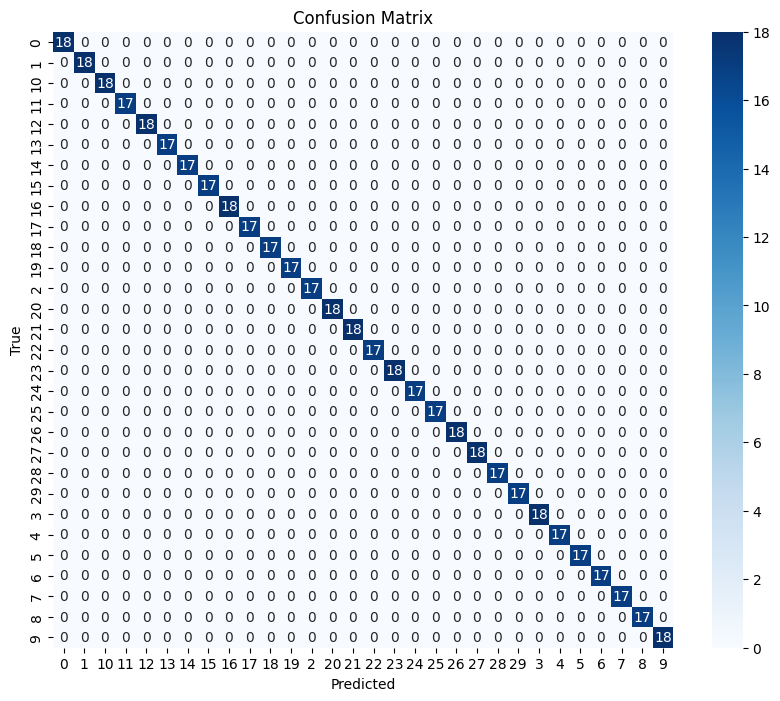

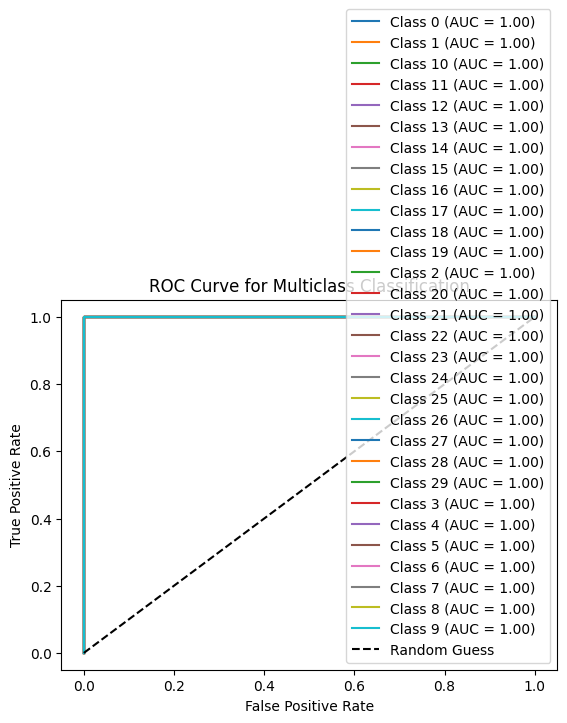

Macro-average ROC AUC: 1.00


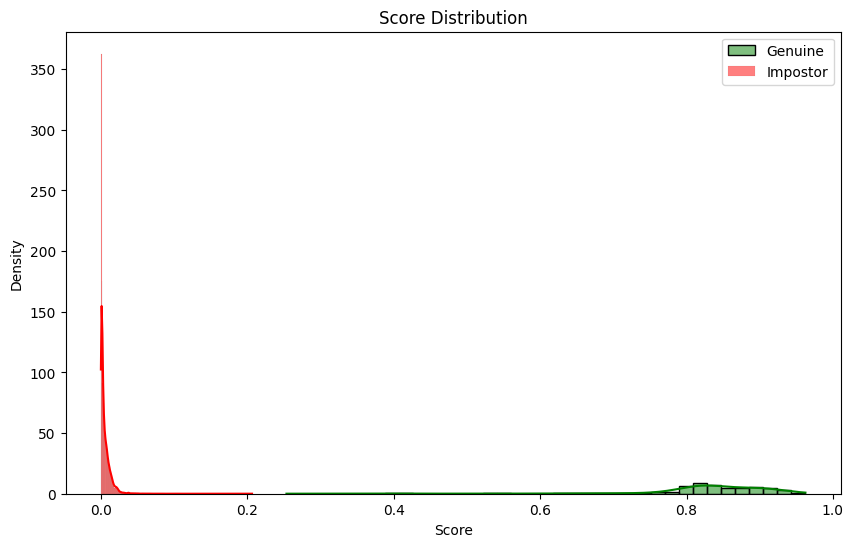

KeyboardInterrupt: 

In [14]:
print("\nEvaluating Face-Only System...")
face_metrics = train_and_evaluate_with_cv(X_faces_aligned, y_faces_aligned, n_splits=5)

Evaluating Only Voice system


Evaluating Voice-Only System...

Evaluating Random Forest with 5-fold cross-validation...

Classification Report for Fold:
              precision    recall  f1-score   support

           0       0.94      0.94      0.94        17
           1       1.00      0.59      0.74        17
          10       1.00      1.00      1.00        17
          11       0.89      1.00      0.94        17
          12       1.00      0.94      0.97        18
          13       0.94      0.94      0.94        18
          14       0.64      0.82      0.72        17
          15       0.94      0.94      0.94        18
          16       1.00      1.00      1.00        18
          17       1.00      0.83      0.91        18
          18       0.94      1.00      0.97        17
          19       0.86      0.71      0.77        17
           2       1.00      1.00      1.00        18
          20       0.94      0.89      0.91        18
          21       0.82      0.82      0.82        17
          2

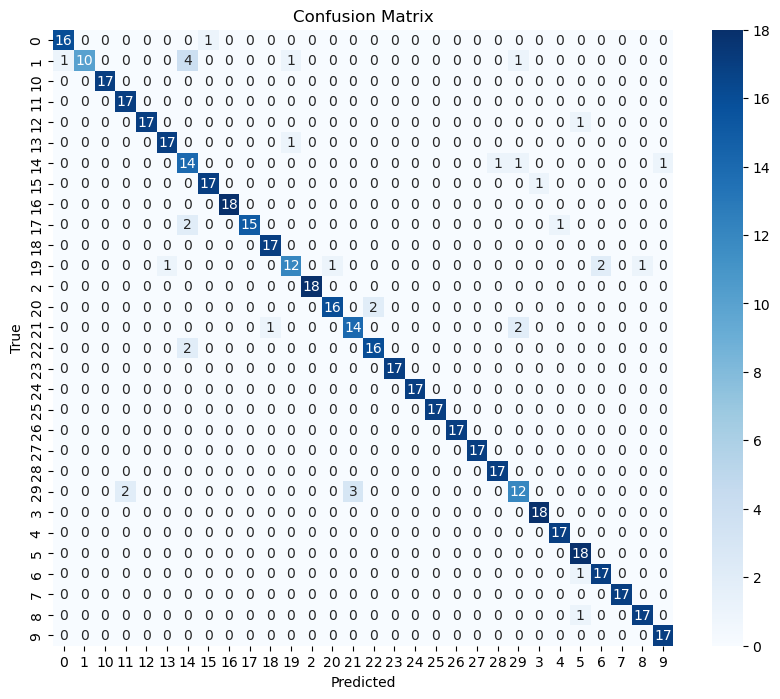

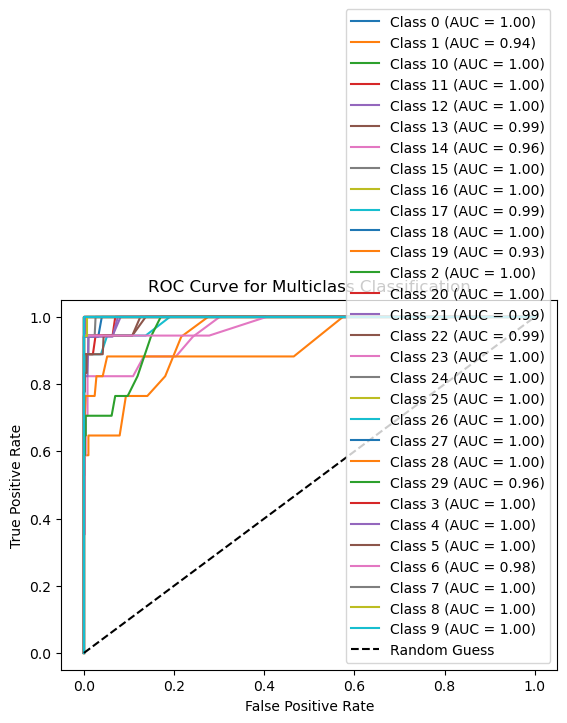

Macro-average ROC AUC: 0.99


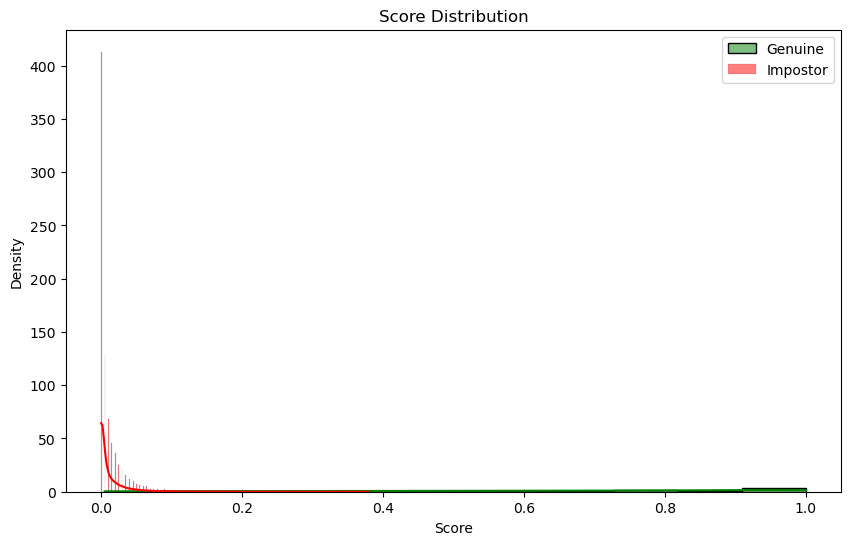


Classification Report for Fold:
              precision    recall  f1-score   support

           0       1.00      0.94      0.97        18
           1       1.00      1.00      1.00        18
          10       1.00      1.00      1.00        17
          11       0.94      1.00      0.97        17
          12       1.00      1.00      1.00        18
          13       0.94      0.94      0.94        18
          14       0.82      0.82      0.82        17
          15       0.88      0.88      0.88        17
          16       0.94      1.00      0.97        17
          17       0.93      0.82      0.88        17
          18       0.94      1.00      0.97        17
          19       0.84      0.94      0.89        17
           2       1.00      1.00      1.00        18
          20       0.90      1.00      0.95        18
          21       0.94      0.88      0.91        17
          22       0.94      0.88      0.91        17
          23       1.00      1.00      1.00     

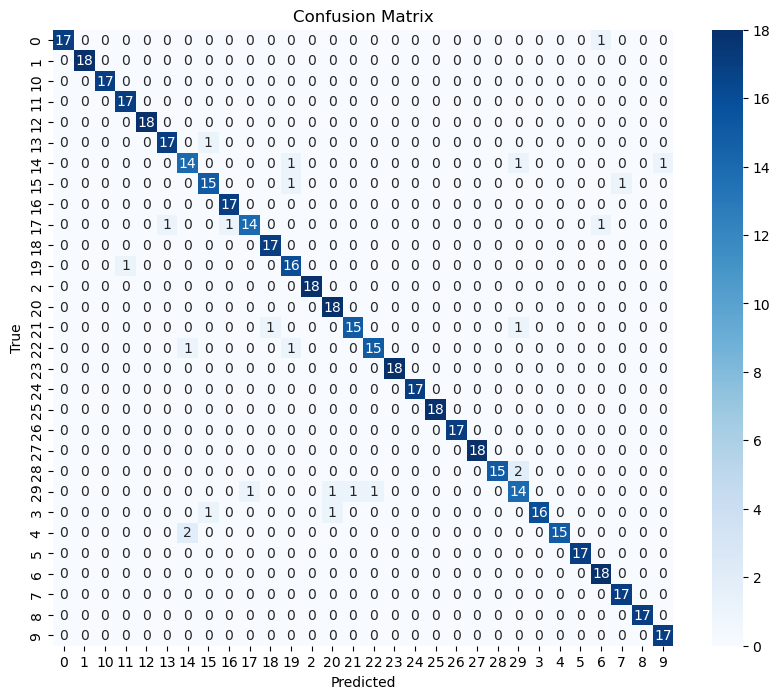

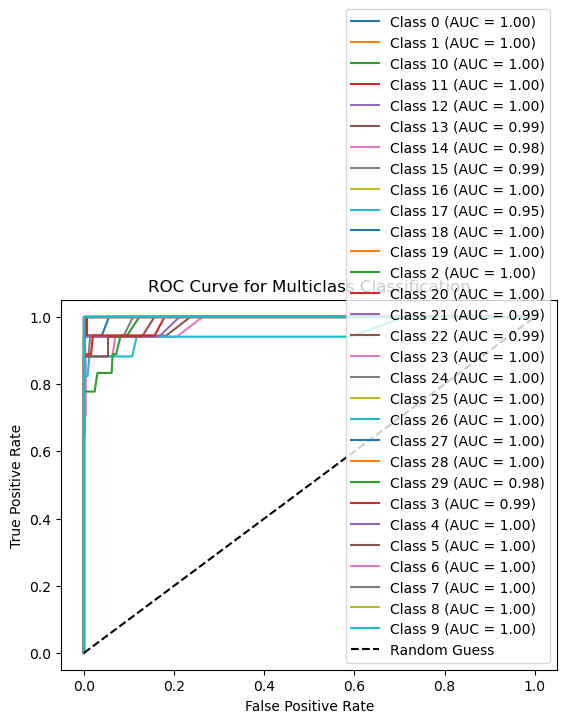

Macro-average ROC AUC: 1.00


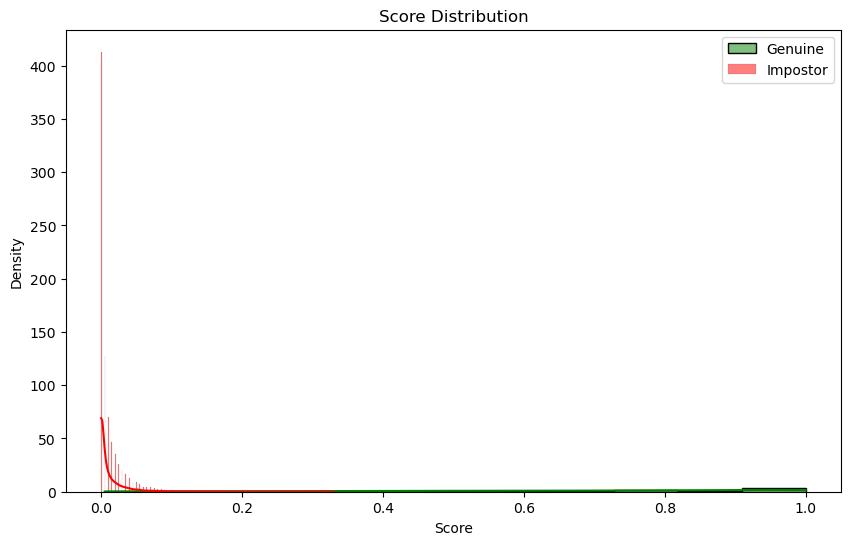


Classification Report for Fold:
              precision    recall  f1-score   support

           0       0.95      1.00      0.97        18
           1       0.88      0.83      0.86        18
          10       0.94      1.00      0.97        17
          11       0.94      1.00      0.97        17
          12       1.00      0.88      0.94        17
          13       0.94      0.94      0.94        17
          14       1.00      0.94      0.97        18
          15       0.94      1.00      0.97        17
          16       1.00      1.00      1.00        17
          17       1.00      0.88      0.94        17
          18       0.76      0.76      0.76        17
          19       0.92      0.67      0.77        18
           2       0.94      1.00      0.97        17
          20       0.94      1.00      0.97        17
          21       0.85      0.65      0.73        17
          22       0.88      0.82      0.85        17
          23       0.82      1.00      0.90     

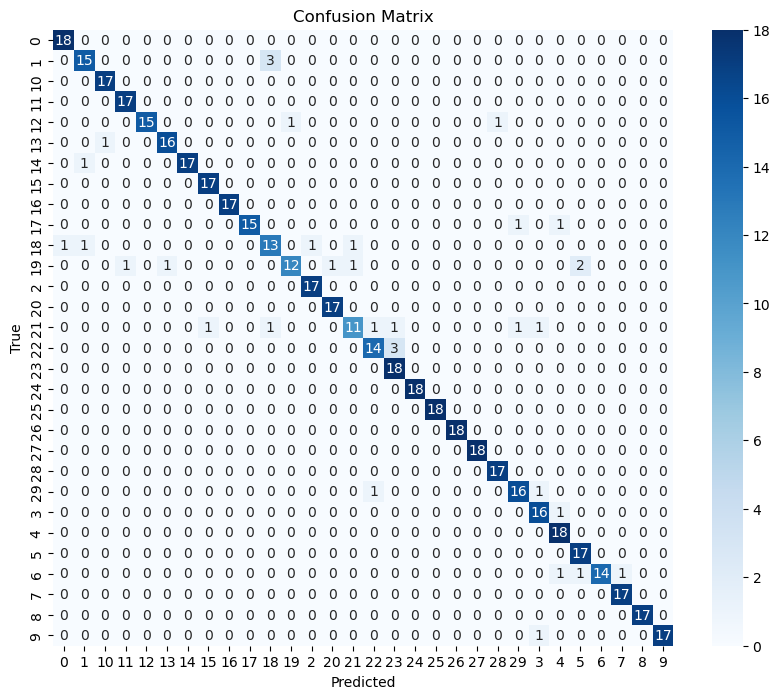

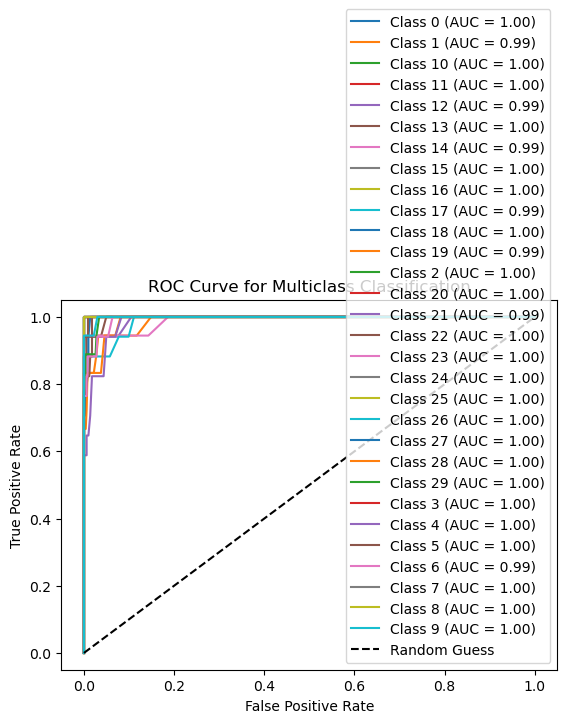

Macro-average ROC AUC: 1.00


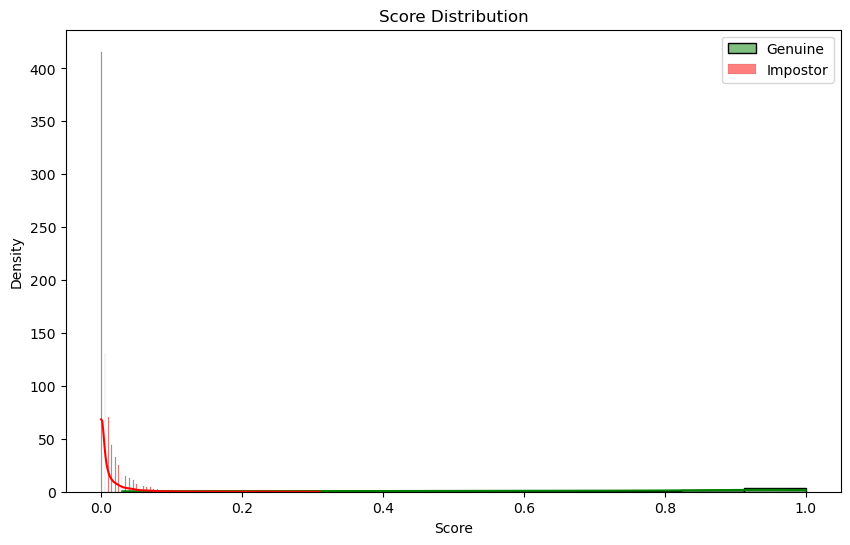


Classification Report for Fold:
              precision    recall  f1-score   support

           0       1.00      0.82      0.90        17
           1       0.89      0.94      0.91        17
          10       1.00      1.00      1.00        18
          11       1.00      1.00      1.00        18
          12       1.00      1.00      1.00        17
          13       1.00      0.88      0.94        17
          14       0.90      1.00      0.95        18
          15       1.00      1.00      1.00        17
          16       1.00      1.00      1.00        17
          17       0.94      0.94      0.94        17
          18       0.90      1.00      0.95        18
          19       1.00      0.72      0.84        18
           2       1.00      1.00      1.00        17
          20       1.00      0.88      0.94        17
          21       0.94      0.94      0.94        18
          22       0.83      0.88      0.86        17
          23       1.00      1.00      1.00     

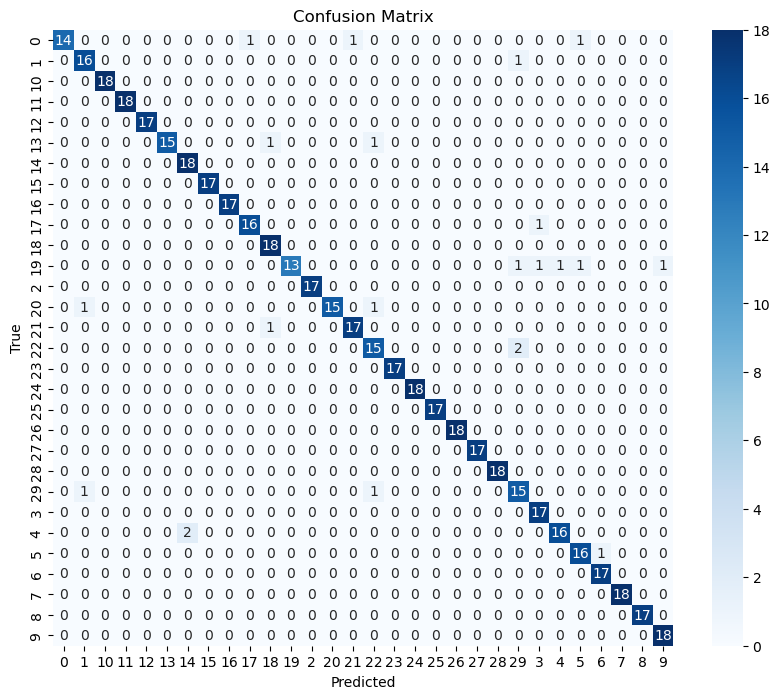

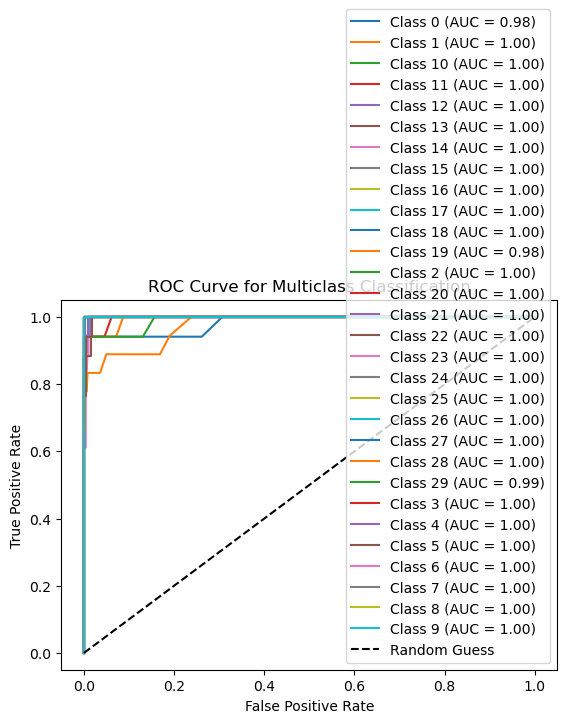

Macro-average ROC AUC: 1.00


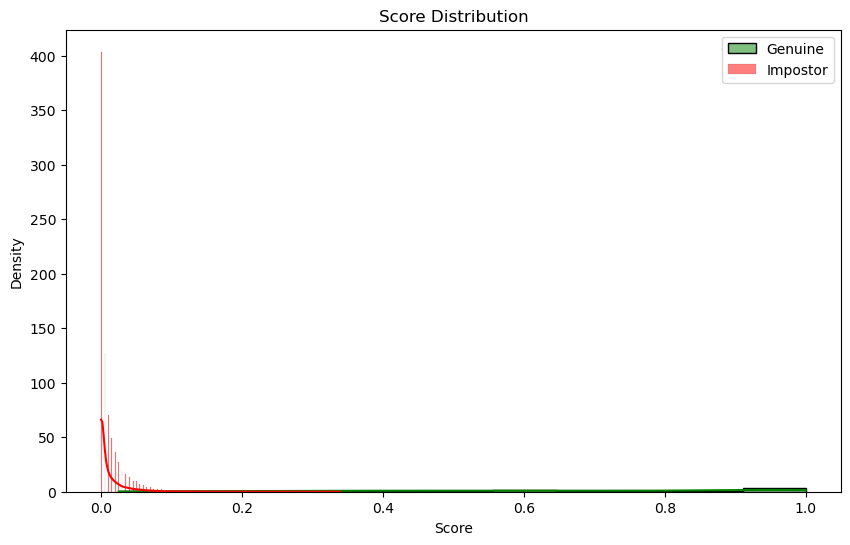


Classification Report for Fold:
              precision    recall  f1-score   support

           0       1.00      0.94      0.97        17
           1       1.00      0.71      0.83        17
          10       1.00      1.00      1.00        18
          11       1.00      1.00      1.00        18
          12       1.00      1.00      1.00        17
          13       1.00      0.88      0.94        17
          14       0.94      0.94      0.94        17
          15       0.94      0.94      0.94        18
          16       1.00      1.00      1.00        18
          17       0.80      0.89      0.84        18
          18       0.89      0.94      0.92        18
          19       0.84      0.94      0.89        17
           2       0.89      1.00      0.94        17
          20       0.93      0.82      0.88        17
          21       1.00      0.83      0.91        18
          22       0.83      0.83      0.83        18
          23       1.00      1.00      1.00     

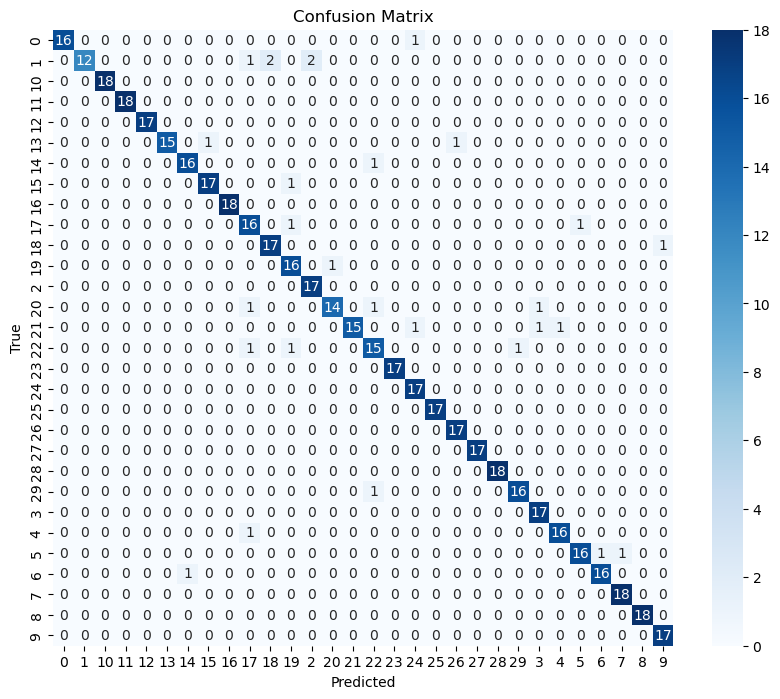

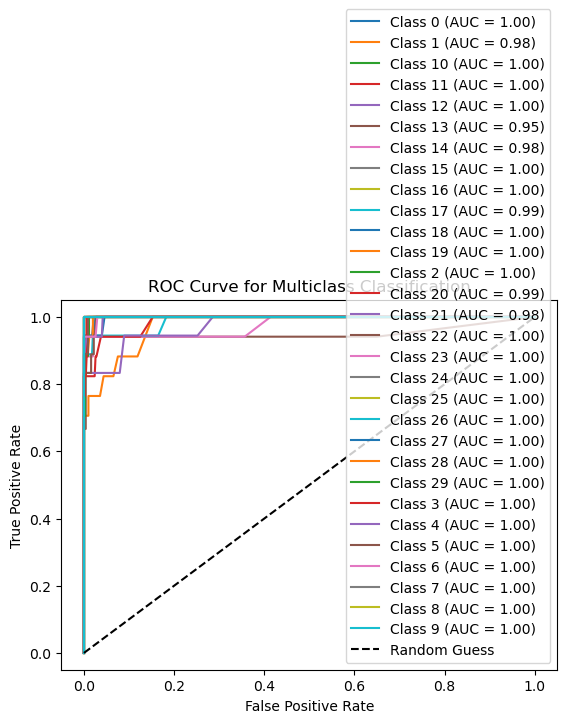

Macro-average ROC AUC: 0.99


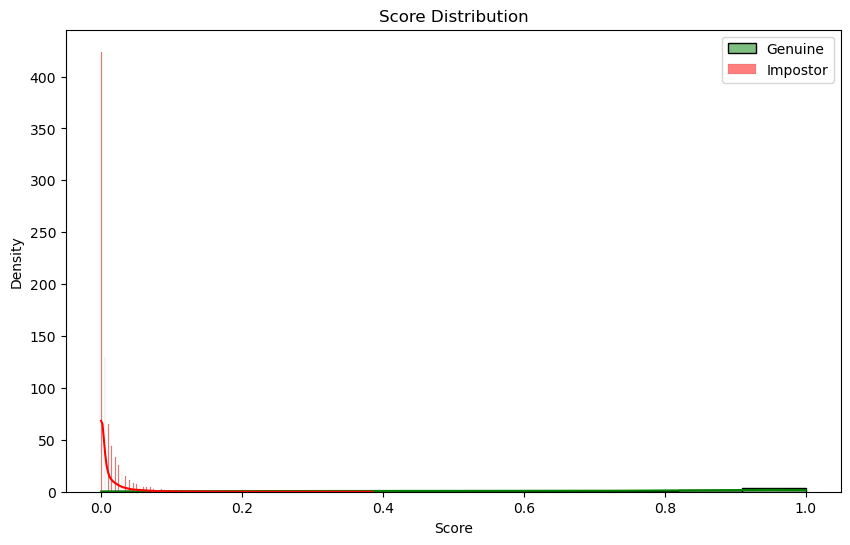


Random Forest Cross-Validation Results:
Mean Accuracy: 0.9441
Mean Macro ROC AUC: 0.9953
Mean Average EER: 0.0221
Mean D-prime: 3.2228


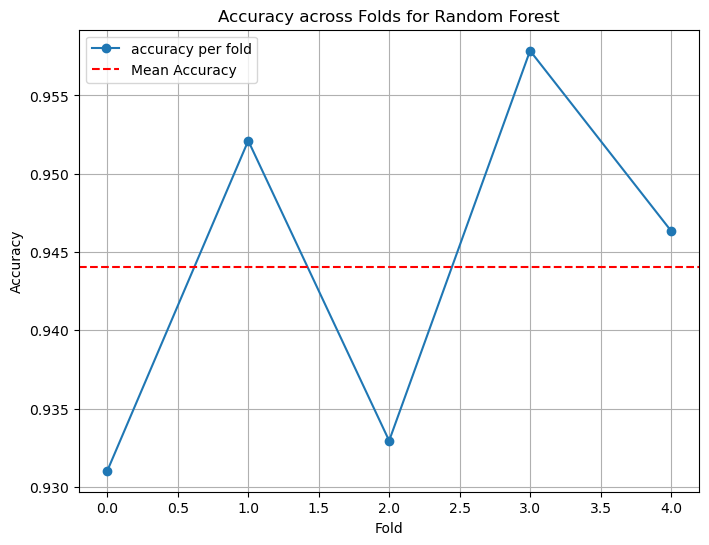

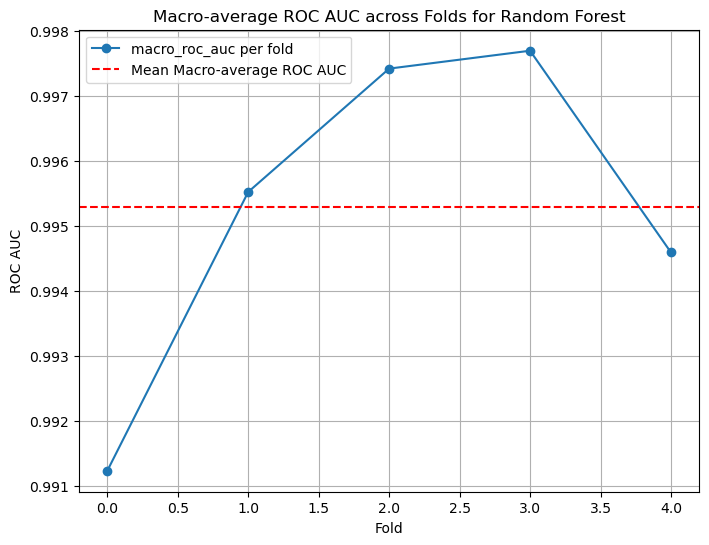

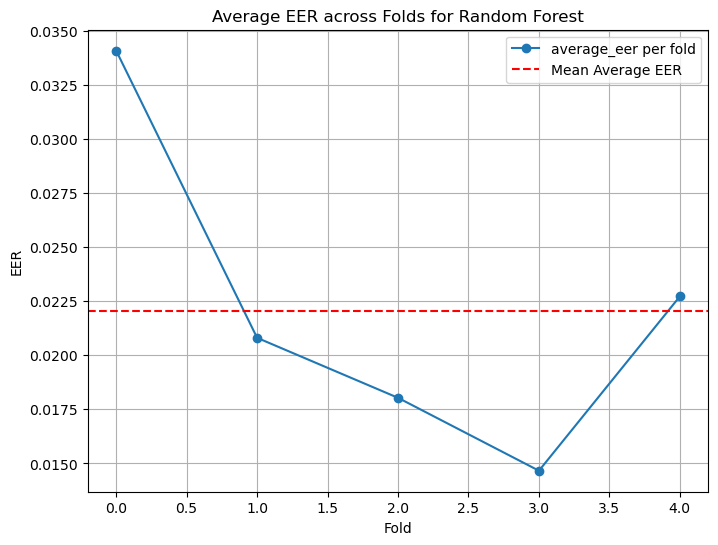

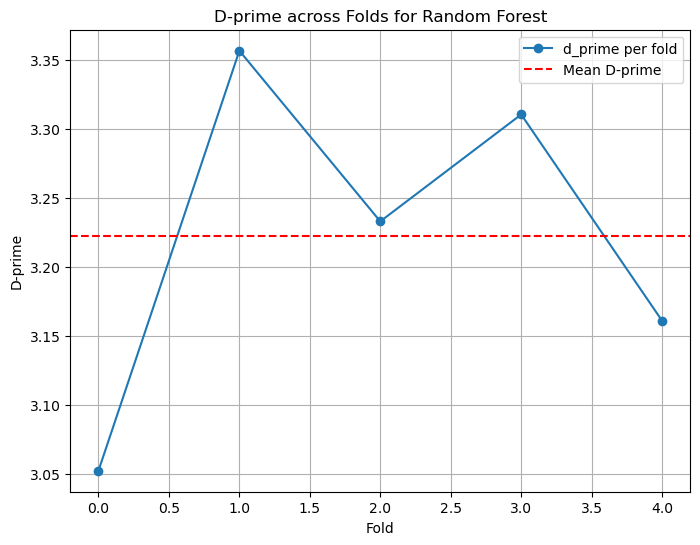


Evaluating SVM with 5-fold cross-validation...

Classification Report for Fold:
              precision    recall  f1-score   support

           0       1.00      0.88      0.94        17
           1       1.00      0.82      0.90        17
          10       1.00      1.00      1.00        17
          11       0.94      1.00      0.97        17
          12       1.00      0.94      0.97        18
          13       1.00      0.94      0.97        18
          14       0.78      0.82      0.80        17
          15       0.95      1.00      0.97        18
          16       1.00      1.00      1.00        18
          17       0.93      0.78      0.85        18
          18       0.94      0.94      0.94        17
          19       0.81      0.76      0.79        17
           2       1.00      1.00      1.00        18
          20       0.88      0.83      0.86        18
          21       0.94      1.00      0.97        17
          22       0.77      0.94      0.85        18


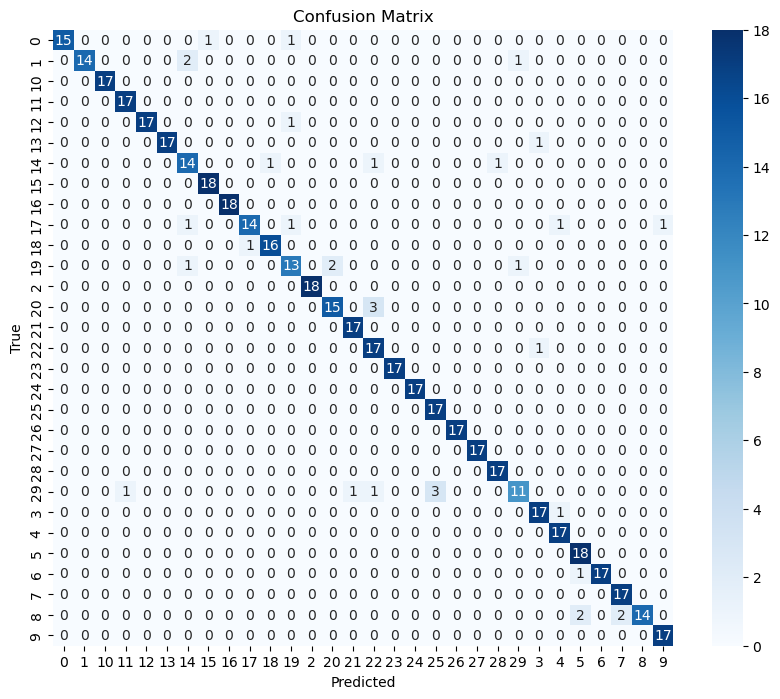

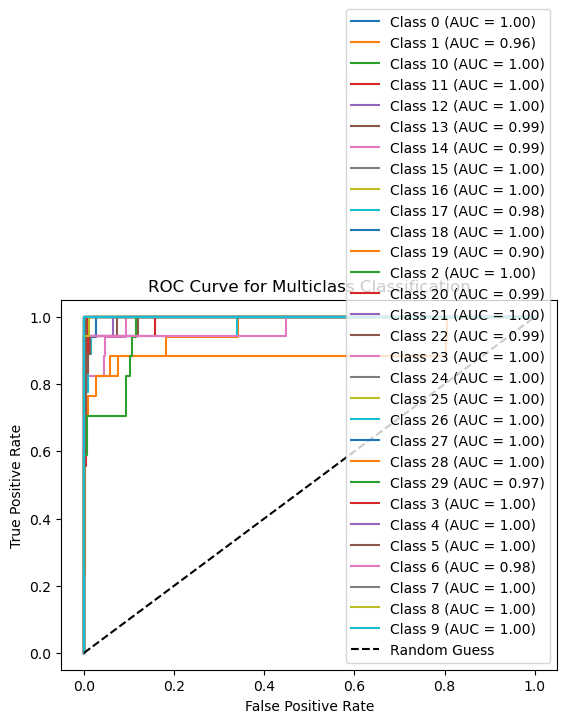

Macro-average ROC AUC: 0.99


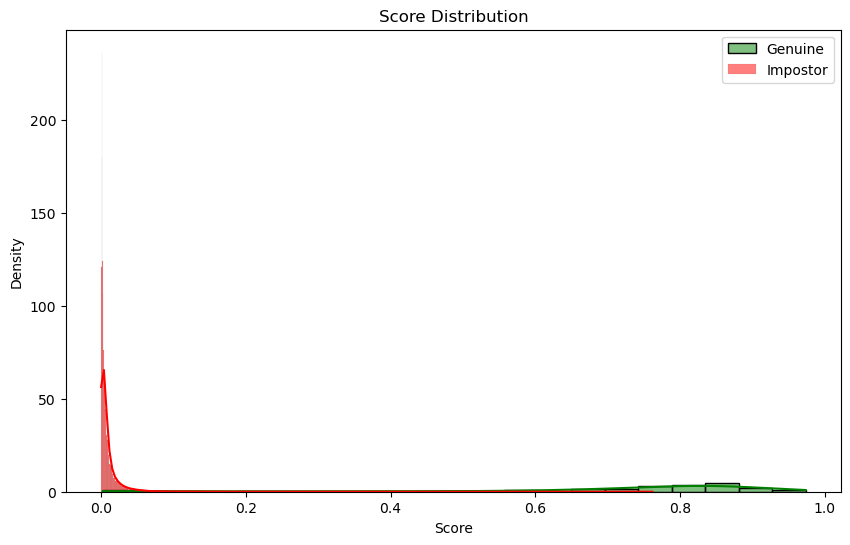


Classification Report for Fold:
              precision    recall  f1-score   support

           0       0.89      0.94      0.92        18
           1       0.95      1.00      0.97        18
          10       1.00      1.00      1.00        17
          11       1.00      1.00      1.00        17
          12       1.00      1.00      1.00        18
          13       0.94      0.94      0.94        18
          14       0.78      0.82      0.80        17
          15       0.94      0.94      0.94        17
          16       1.00      1.00      1.00        17
          17       0.82      0.82      0.82        17
          18       1.00      0.88      0.94        17
          19       1.00      0.76      0.87        17
           2       1.00      1.00      1.00        18
          20       1.00      1.00      1.00        18
          21       0.89      0.94      0.91        17
          22       0.89      0.94      0.91        17
          23       1.00      1.00      1.00     

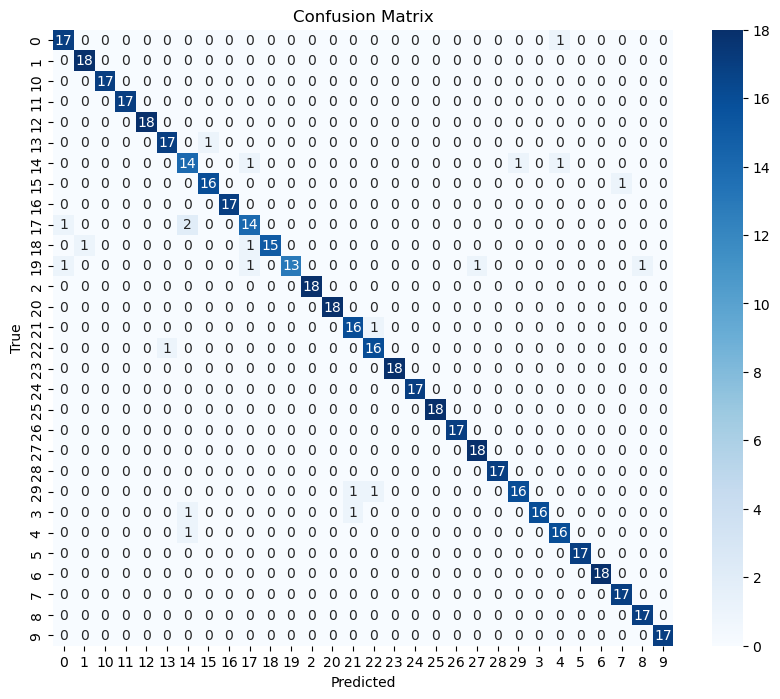

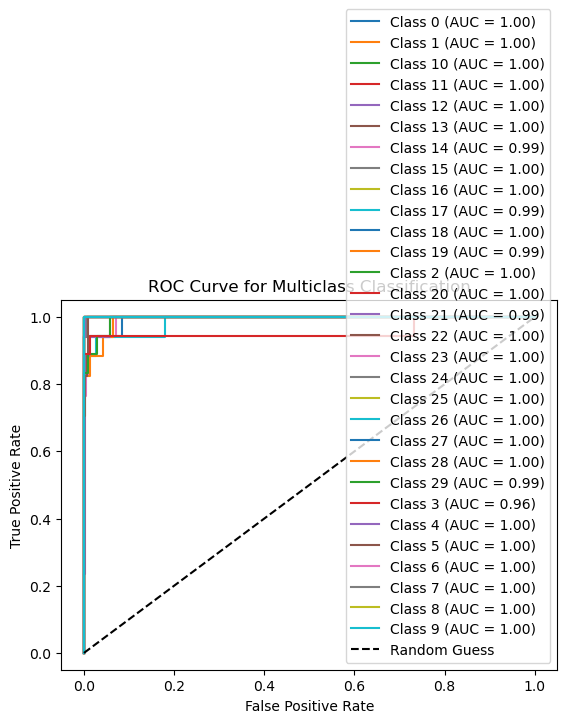

Macro-average ROC AUC: 1.00


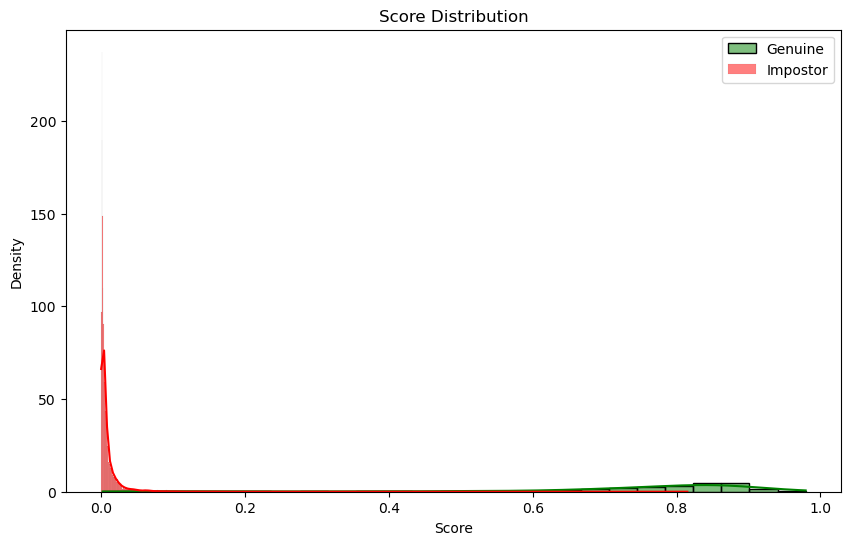


Classification Report for Fold:
              precision    recall  f1-score   support

           0       0.71      0.94      0.81        18
           1       0.84      0.89      0.86        18
          10       0.94      1.00      0.97        17
          11       0.81      1.00      0.89        17
          12       1.00      0.94      0.97        17
          13       1.00      0.94      0.97        17
          14       1.00      0.89      0.94        18
          15       1.00      1.00      1.00        17
          16       1.00      1.00      1.00        17
          17       0.94      0.88      0.91        17
          18       0.93      0.82      0.88        17
          19       0.92      0.61      0.73        18
           2       1.00      1.00      1.00        17
          20       0.89      1.00      0.94        17
          21       0.82      0.82      0.82        17
          22       0.94      0.94      0.94        17
          23       1.00      1.00      1.00     

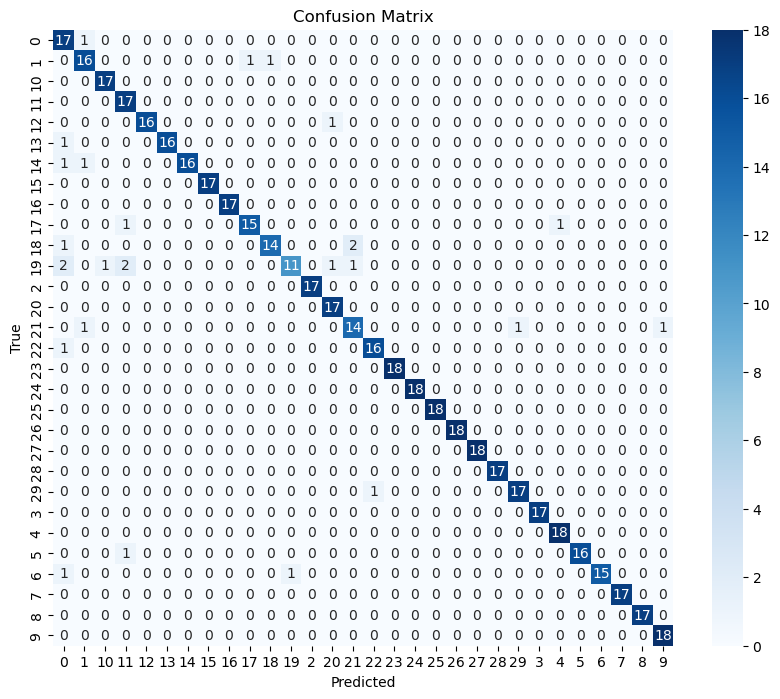

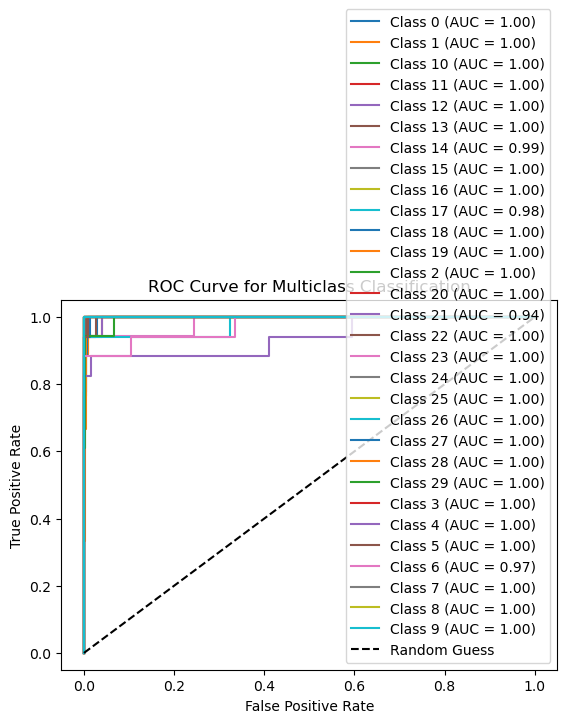

Macro-average ROC AUC: 1.00


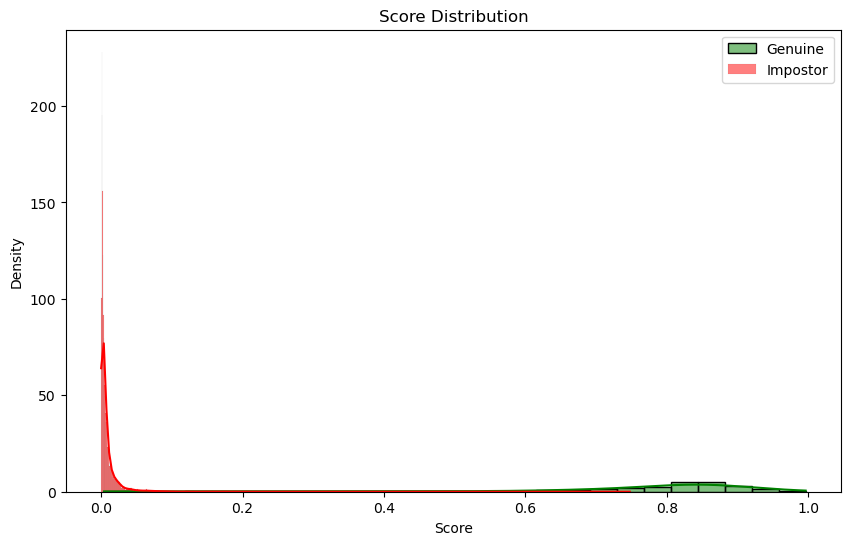


Classification Report for Fold:
              precision    recall  f1-score   support

           0       0.94      0.88      0.91        17
           1       0.94      0.94      0.94        17
          10       1.00      1.00      1.00        18
          11       0.95      1.00      0.97        18
          12       0.94      1.00      0.97        17
          13       0.94      1.00      0.97        17
          14       0.94      0.89      0.91        18
          15       0.94      1.00      0.97        17
          16       1.00      1.00      1.00        17
          17       1.00      1.00      1.00        17
          18       0.95      1.00      0.97        18
          19       0.93      0.72      0.81        18
           2       1.00      1.00      1.00        17
          20       0.94      0.94      0.94        17
          21       1.00      0.94      0.97        18
          22       0.89      0.94      0.91        17
          23       1.00      1.00      1.00     

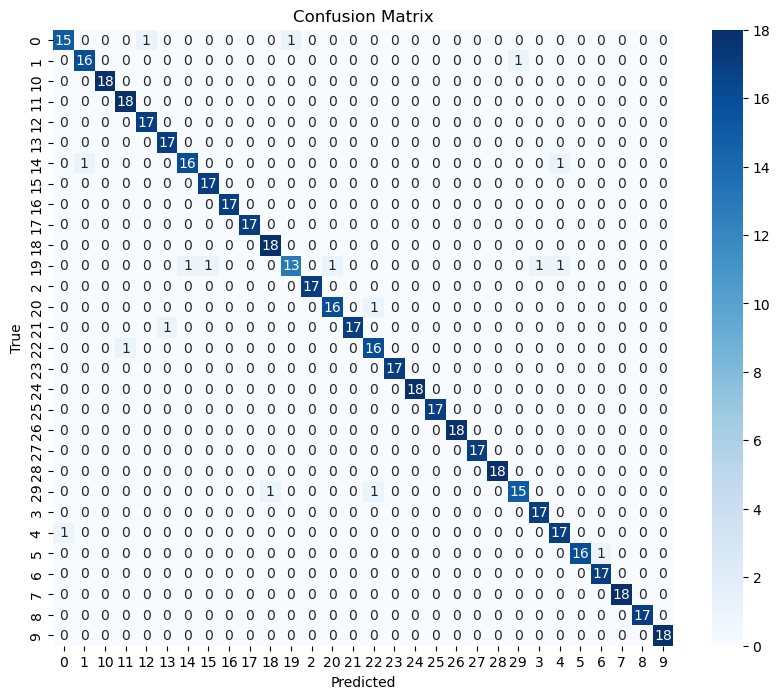

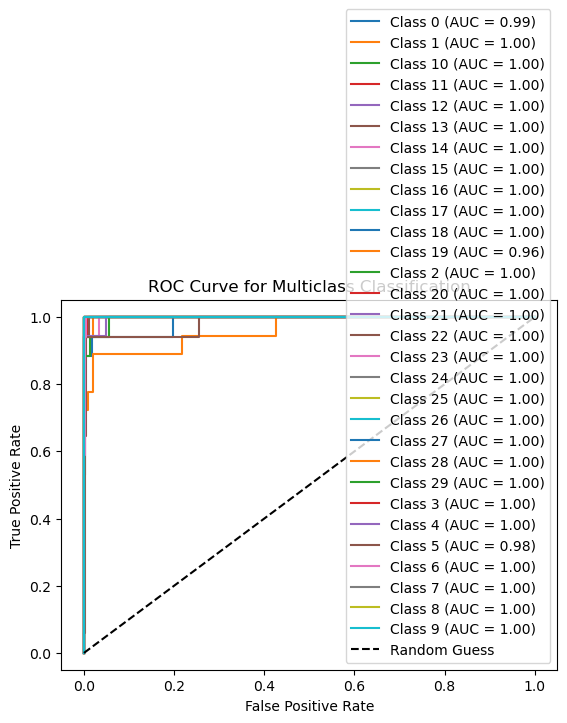

Macro-average ROC AUC: 1.00


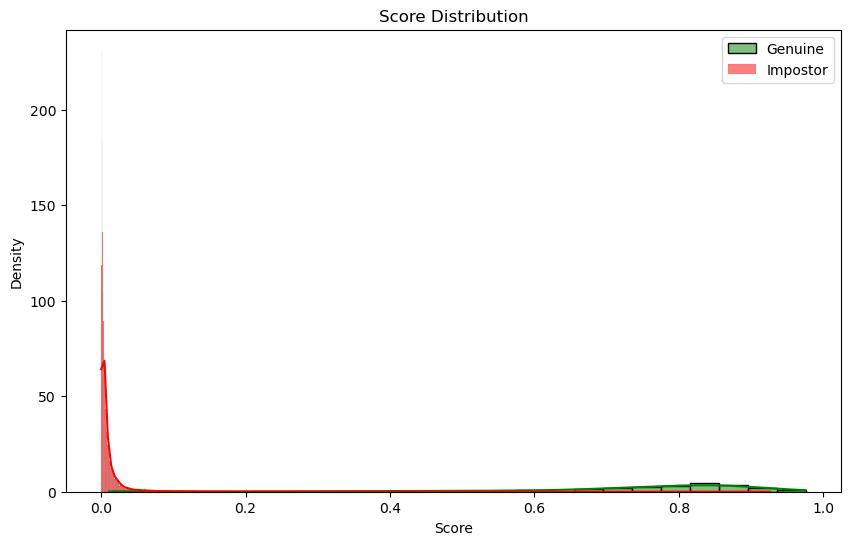


Classification Report for Fold:
              precision    recall  f1-score   support

           0       0.84      0.94      0.89        17
           1       0.86      0.71      0.77        17
          10       0.95      1.00      0.97        18
          11       1.00      1.00      1.00        18
          12       1.00      1.00      1.00        17
          13       0.94      0.88      0.91        17
          14       0.80      0.94      0.86        17
          15       0.95      1.00      0.97        18
          16       1.00      1.00      1.00        18
          17       0.89      0.89      0.89        18
          18       0.94      0.94      0.94        18
          19       0.88      0.88      0.88        17
           2       1.00      1.00      1.00        17
          20       1.00      0.94      0.97        17
          21       0.83      0.83      0.83        18
          22       0.93      0.78      0.85        18
          23       1.00      1.00      1.00     

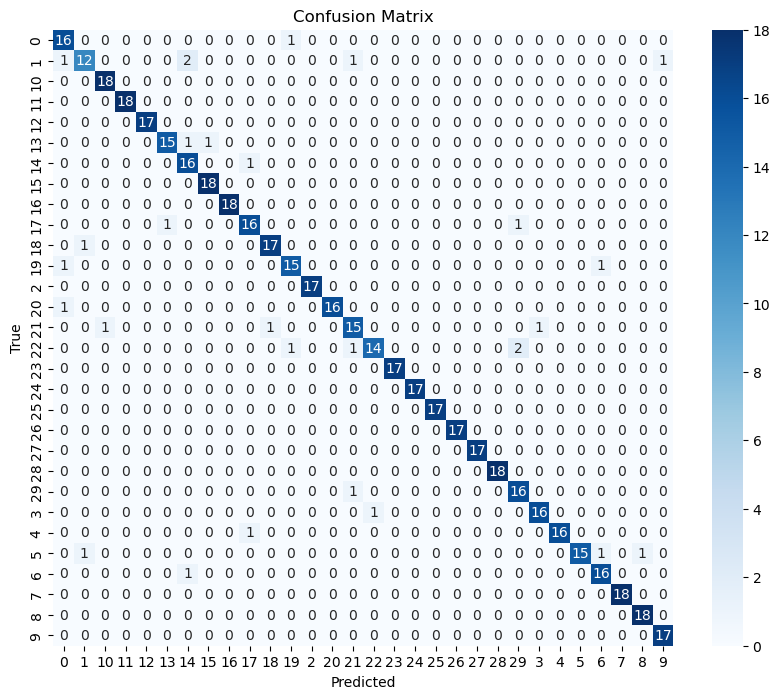

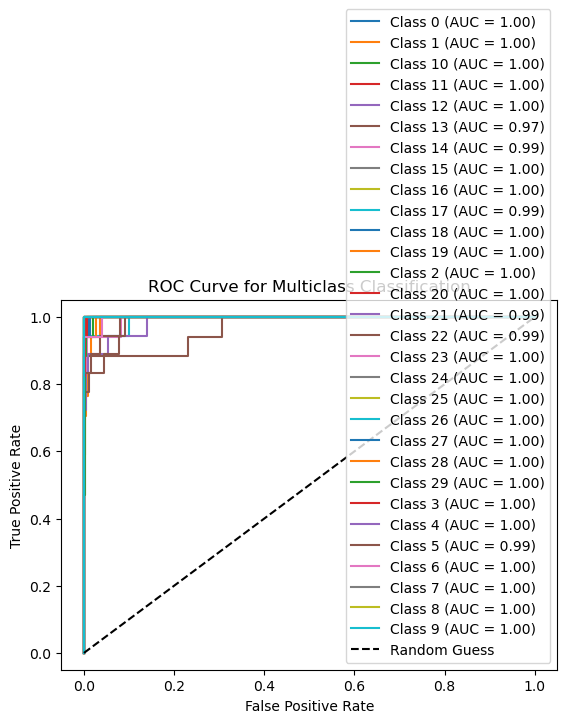

Macro-average ROC AUC: 1.00


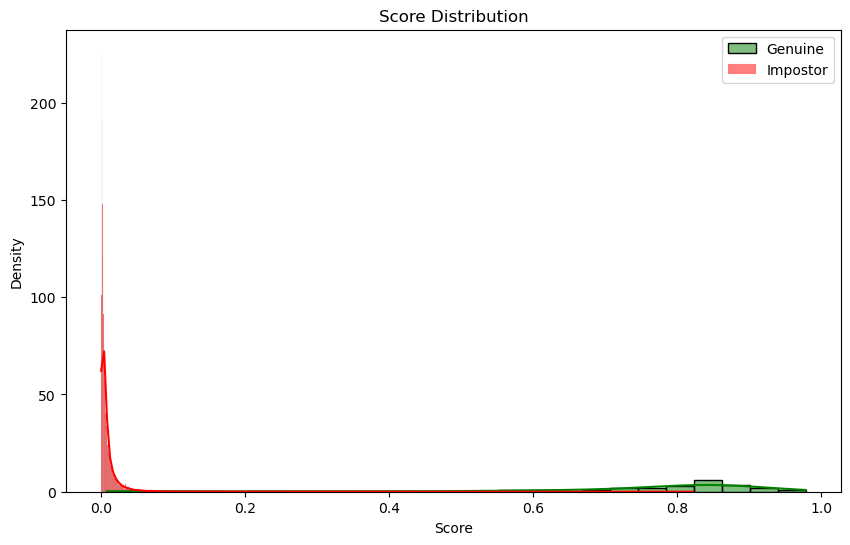


SVM Cross-Validation Results:
Mean Accuracy: 0.9502
Mean Macro ROC AUC: 0.9957
Mean Average EER: 0.0149
Mean D-prime: 4.9348


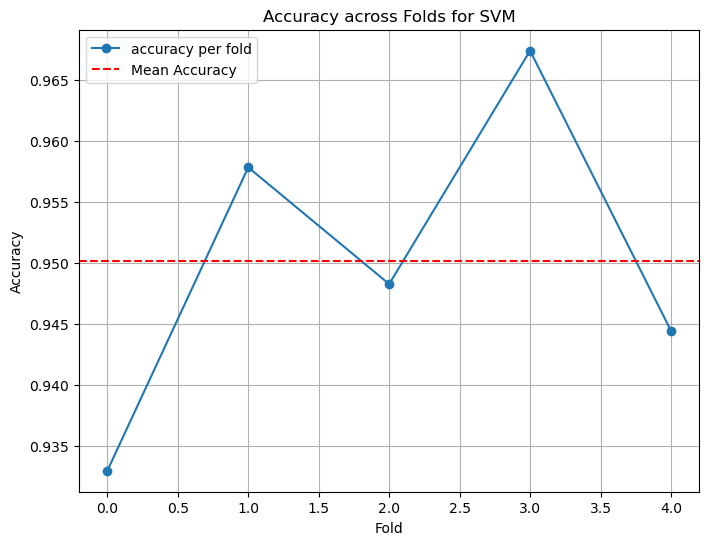

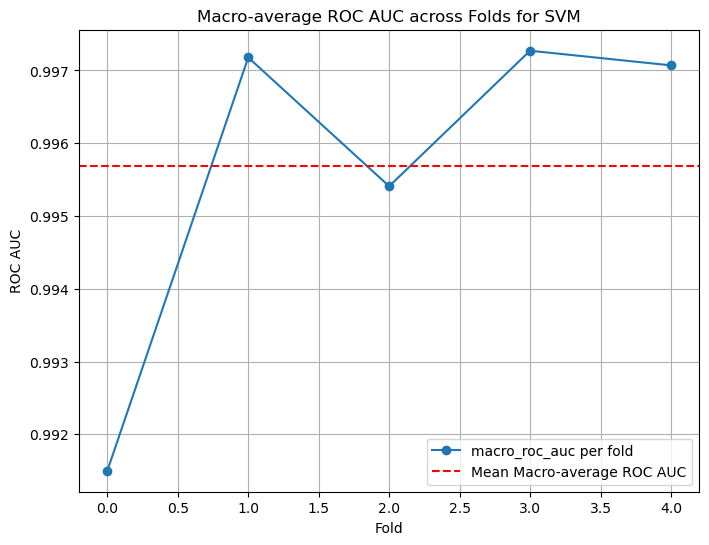

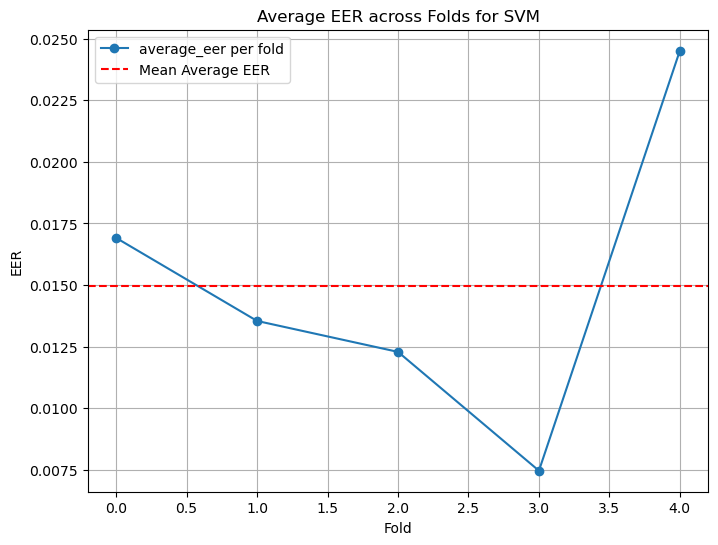

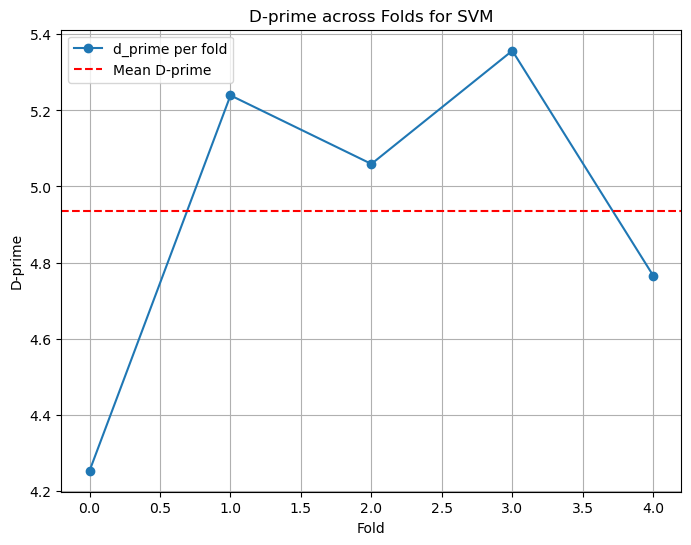


Evaluating kNN with 5-fold cross-validation...

Classification Report for Fold:
              precision    recall  f1-score   support

           0       0.81      0.76      0.79        17
           1       0.77      0.59      0.67        17
          10       1.00      0.94      0.97        17
          11       1.00      1.00      1.00        17
          12       1.00      0.89      0.94        18
          13       0.73      0.89      0.80        18
          14       0.67      0.71      0.69        17
          15       0.89      0.94      0.92        18
          16       0.95      1.00      0.97        18
          17       0.88      0.83      0.86        18
          18       0.94      0.94      0.94        17
          19       1.00      0.76      0.87        17
           2       0.82      1.00      0.90        18
          20       0.83      0.56      0.67        18
          21       0.83      0.88      0.86        17
          22       0.76      0.89      0.82        18


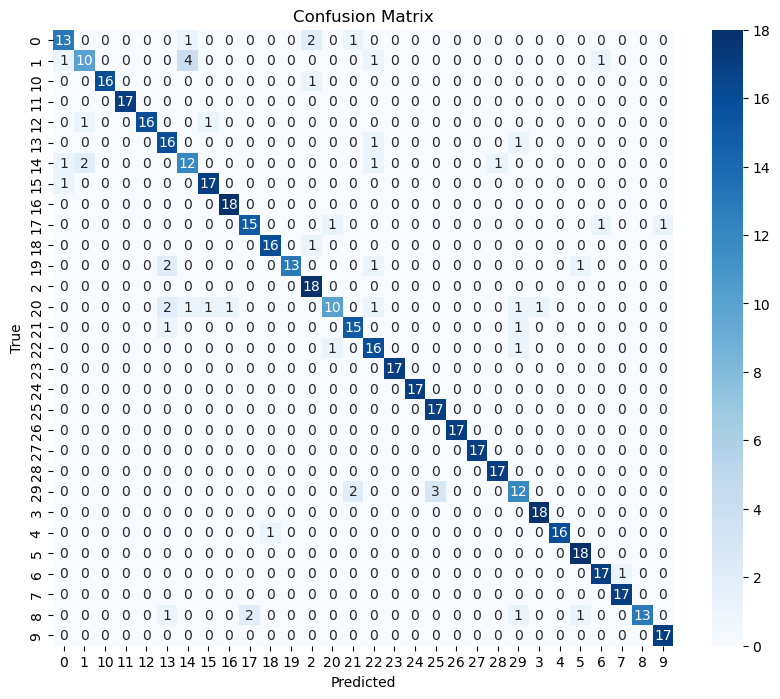

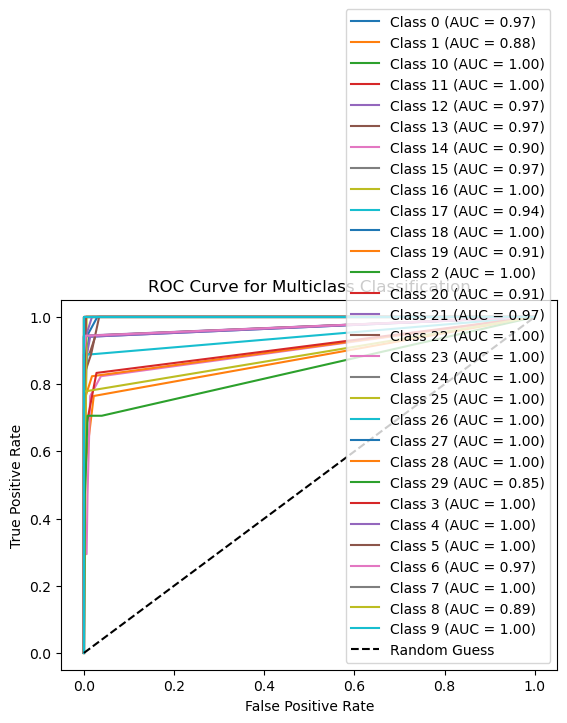

Macro-average ROC AUC: 0.97


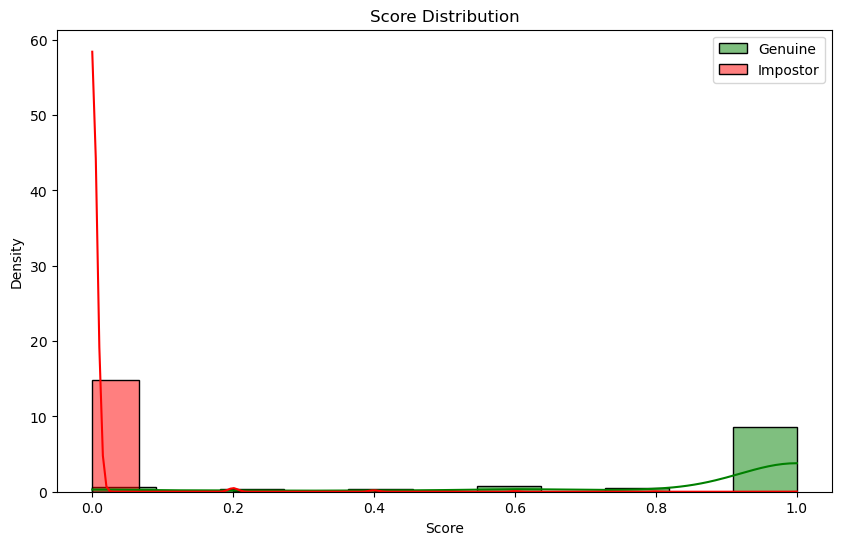


Classification Report for Fold:
              precision    recall  f1-score   support

           0       0.89      0.89      0.89        18
           1       0.77      0.94      0.85        18
          10       0.94      1.00      0.97        17
          11       0.89      1.00      0.94        17
          12       1.00      0.94      0.97        18
          13       0.89      0.94      0.92        18
          14       0.85      0.65      0.73        17
          15       0.83      0.88      0.86        17
          16       0.94      1.00      0.97        17
          17       0.87      0.76      0.81        17
          18       0.80      0.94      0.86        17
          19       0.88      0.88      0.88        17
           2       1.00      1.00      1.00        18
          20       0.79      0.83      0.81        18
          21       0.88      0.88      0.88        17
          22       0.81      0.76      0.79        17
          23       1.00      1.00      1.00     

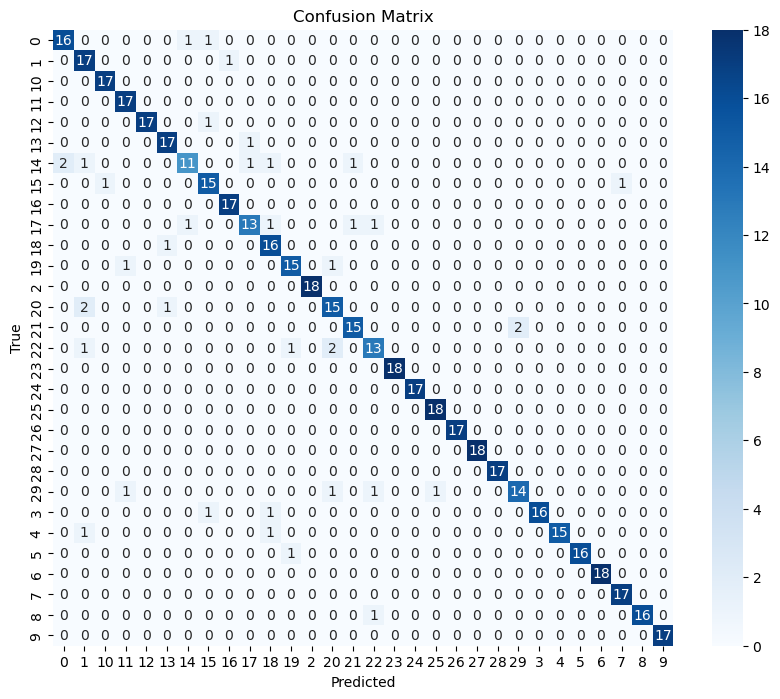

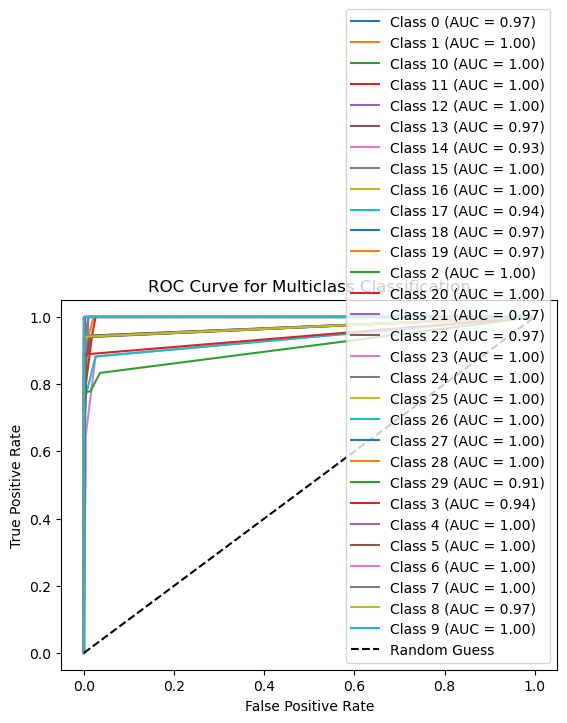

Macro-average ROC AUC: 0.98


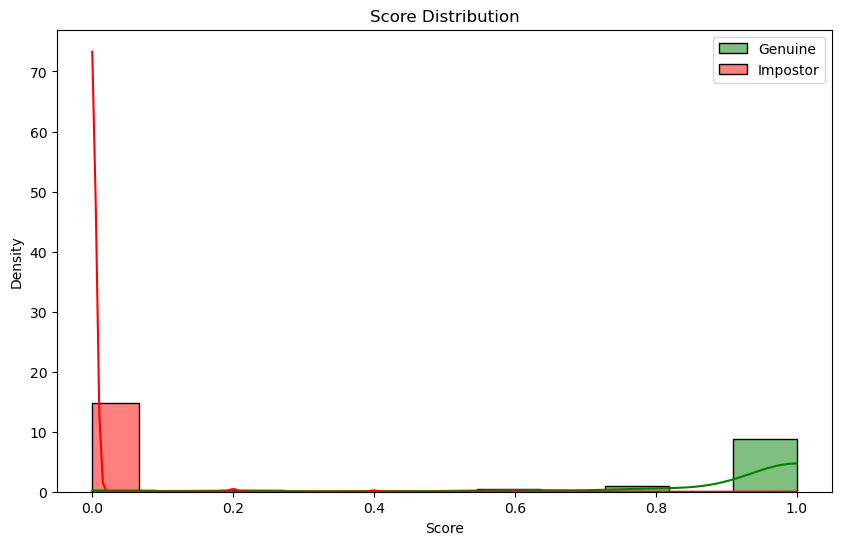


Classification Report for Fold:
              precision    recall  f1-score   support

           0       0.89      0.94      0.92        18
           1       0.80      0.67      0.73        18
          10       0.94      1.00      0.97        17
          11       0.89      1.00      0.94        17
          12       1.00      0.88      0.94        17
          13       0.94      0.88      0.91        17
          14       1.00      0.78      0.88        18
          15       0.89      1.00      0.94        17
          16       0.89      1.00      0.94        17
          17       0.82      0.82      0.82        17
          18       0.82      0.82      0.82        17
          19       1.00      0.78      0.88        18
           2       0.94      1.00      0.97        17
          20       0.77      1.00      0.87        17
          21       0.85      0.65      0.73        17
          22       1.00      0.76      0.87        17
          23       0.78      1.00      0.88     

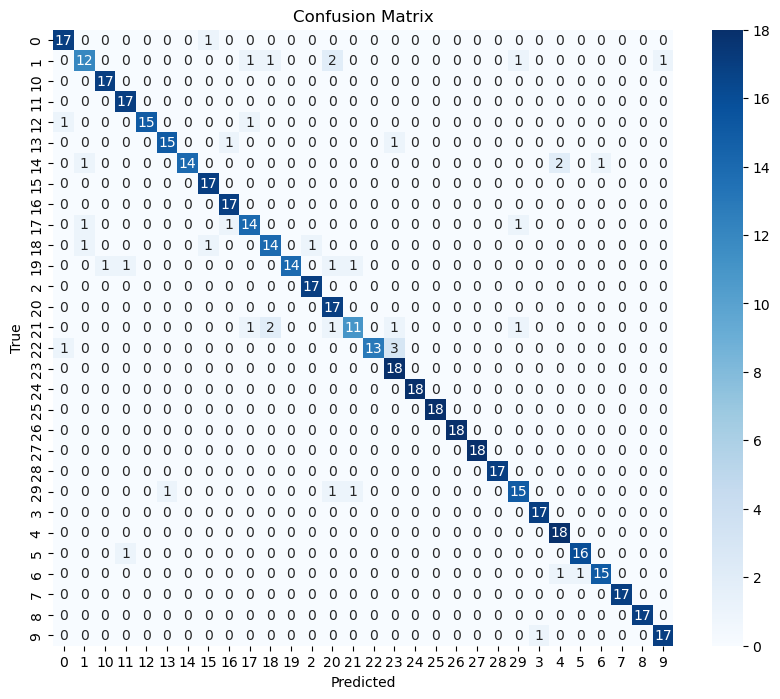

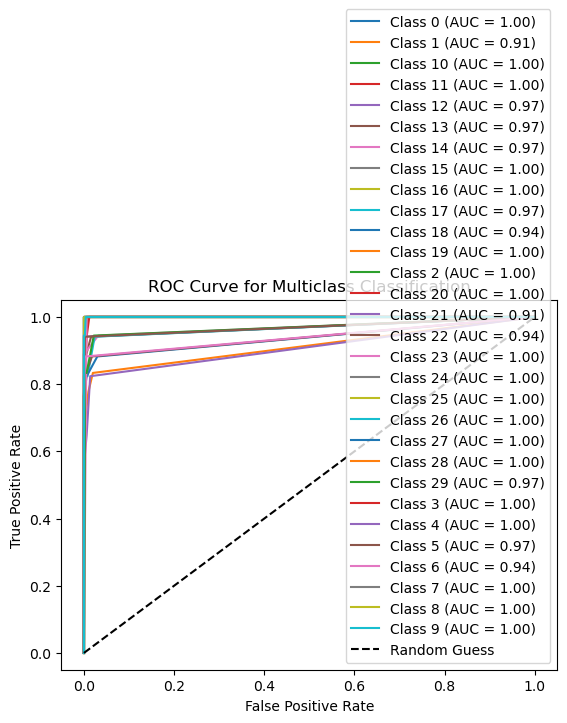

Macro-average ROC AUC: 0.98


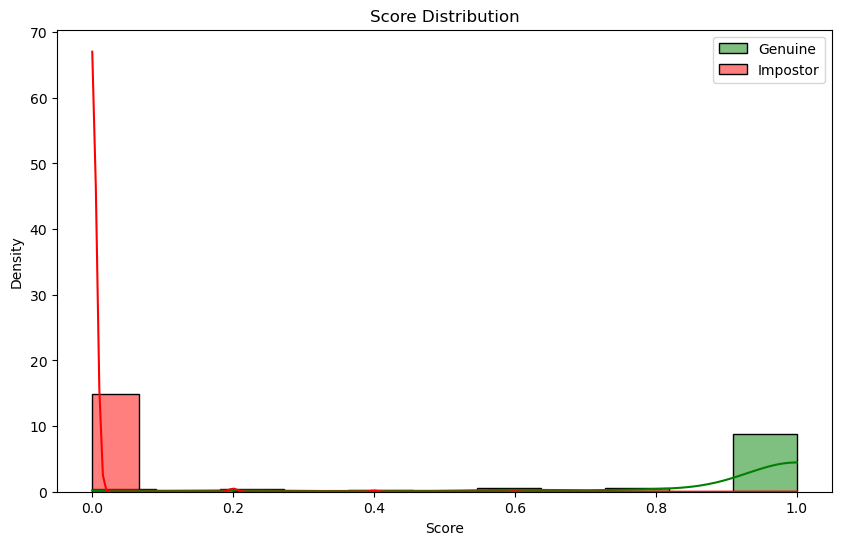


Classification Report for Fold:
              precision    recall  f1-score   support

           0       0.83      0.88      0.86        17
           1       0.88      0.82      0.85        17
          10       1.00      0.94      0.97        18
          11       1.00      1.00      1.00        18
          12       1.00      0.94      0.97        17
          13       0.94      0.88      0.91        17
          14       0.81      0.94      0.87        18
          15       0.94      0.88      0.91        17
          16       0.94      1.00      0.97        17
          17       0.94      0.88      0.91        17
          18       0.94      0.89      0.91        18
          19       1.00      0.67      0.80        18
           2       0.89      1.00      0.94        17
          20       0.93      0.82      0.88        17
          21       0.94      0.89      0.91        18
          22       0.74      0.82      0.78        17
          23       0.94      1.00      0.97     

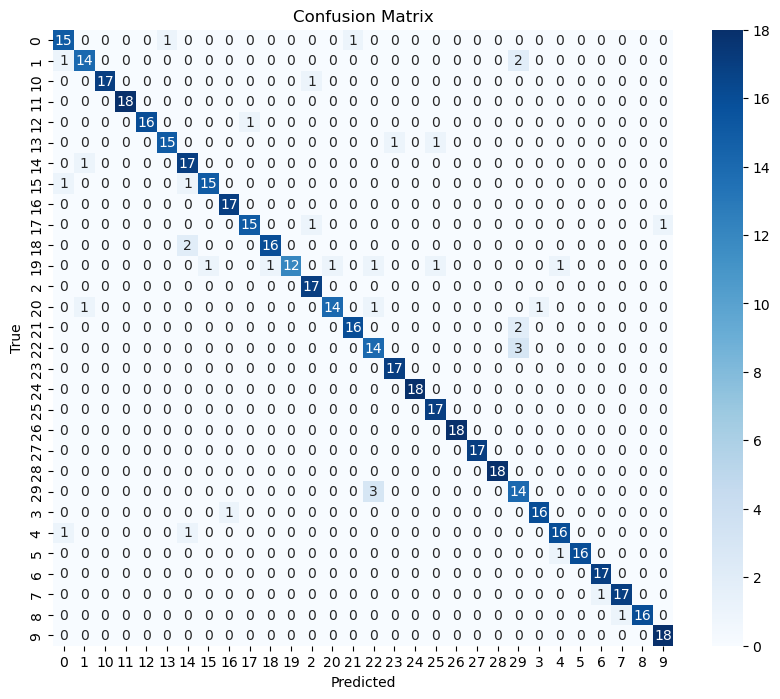

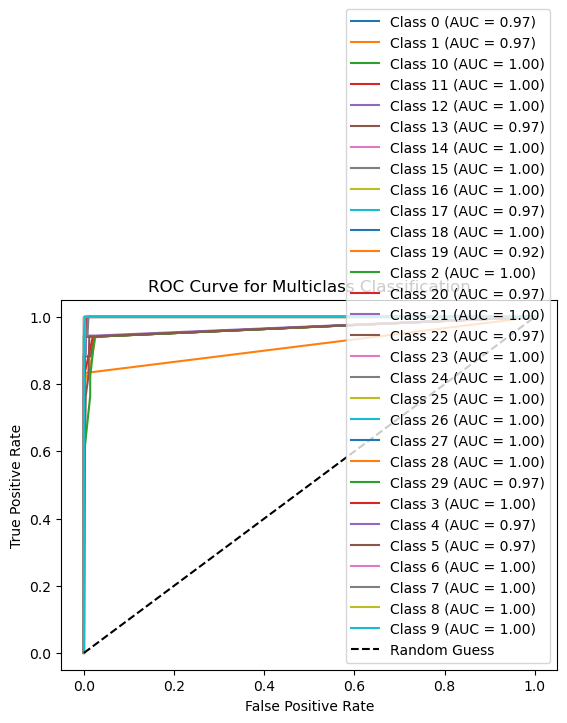

Macro-average ROC AUC: 0.99


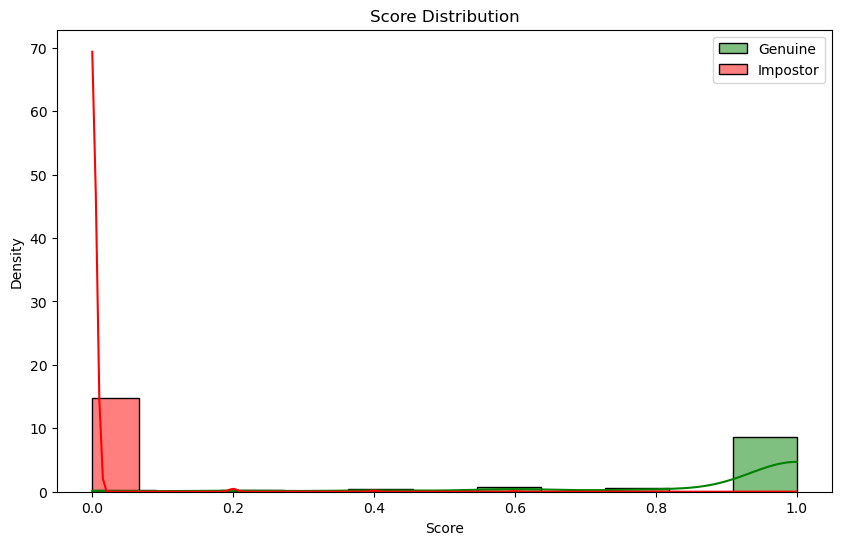


Classification Report for Fold:
              precision    recall  f1-score   support

           0       0.85      1.00      0.92        17
           1       0.73      0.65      0.69        17
          10       0.95      1.00      0.97        18
          11       1.00      1.00      1.00        18
          12       1.00      1.00      1.00        17
          13       0.88      0.82      0.85        17
          14       0.82      0.82      0.82        17
          15       1.00      0.89      0.94        18
          16       0.78      1.00      0.88        18
          17       0.84      0.89      0.86        18
          18       0.76      0.89      0.82        18
          19       0.93      0.82      0.88        17
           2       0.94      1.00      0.97        17
          20       0.86      0.71      0.77        17
          21       0.93      0.78      0.85        18
          22       0.71      0.56      0.62        18
          23       0.85      1.00      0.92     

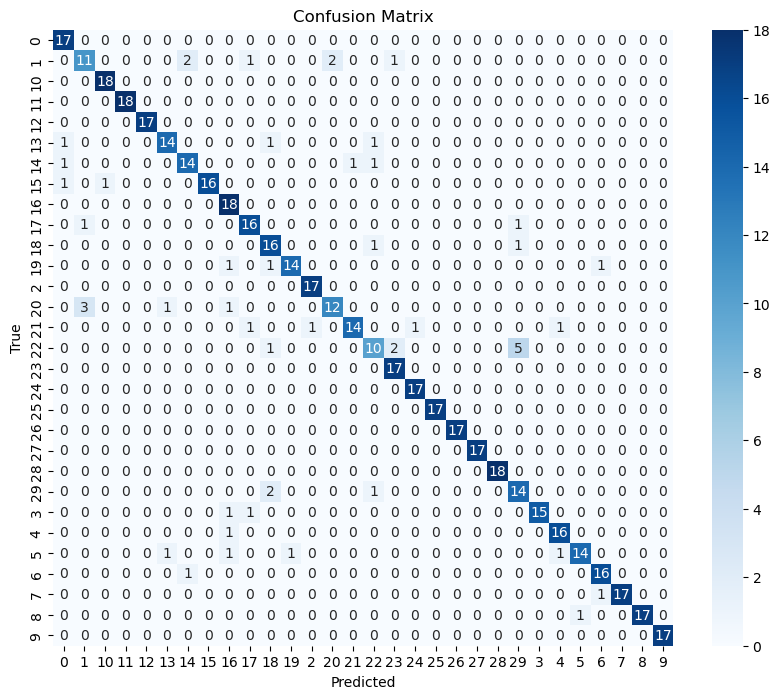

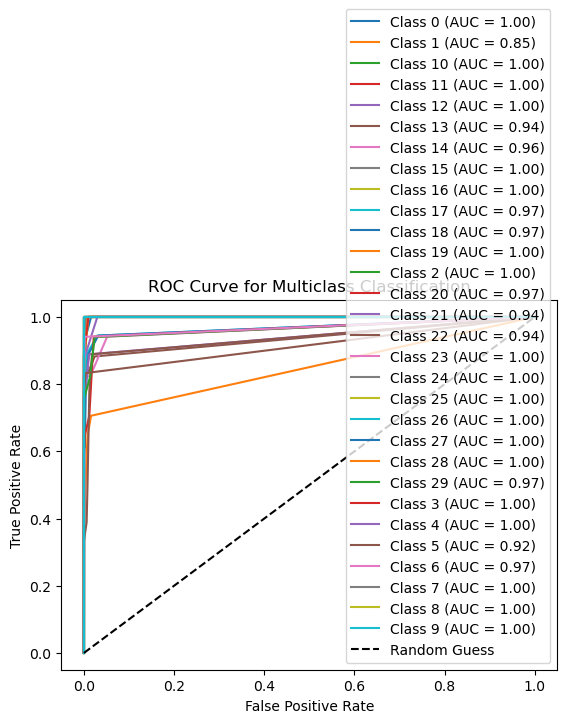

Macro-average ROC AUC: 0.98


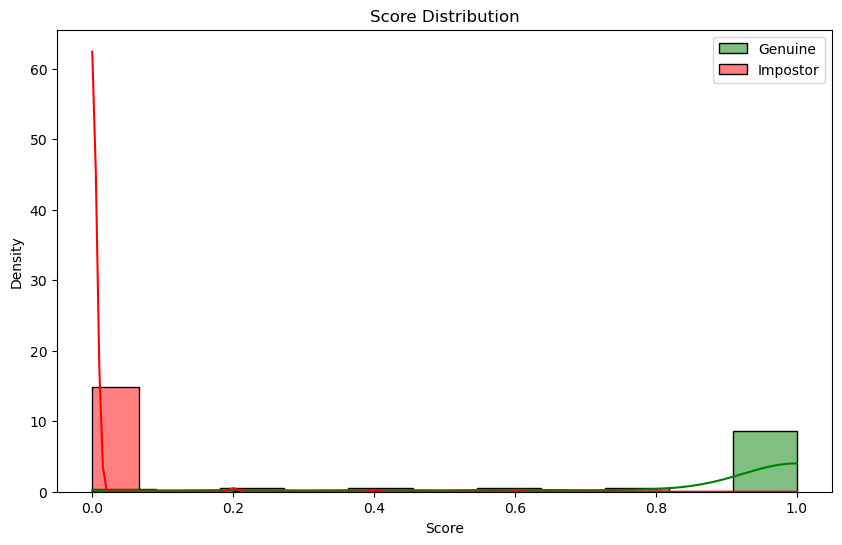


kNN Cross-Validation Results:
Mean Accuracy: 0.9138
Mean Macro ROC AUC: 0.9805
Mean Average EER: 0.0095
Mean D-prime: 4.8457


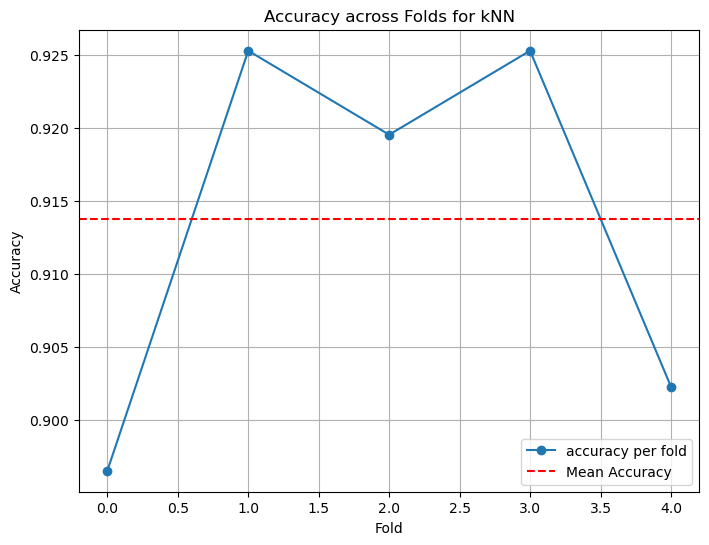

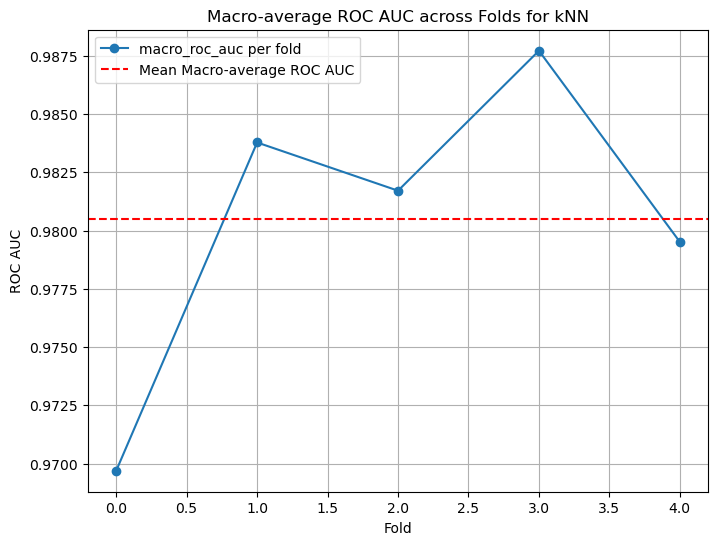

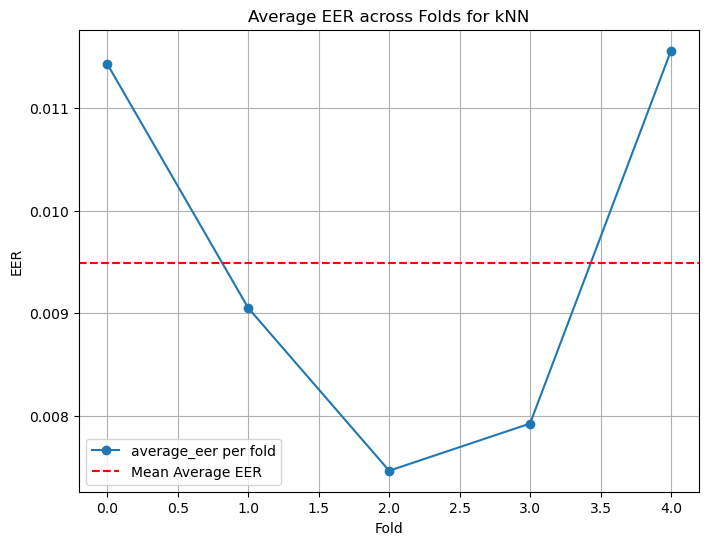

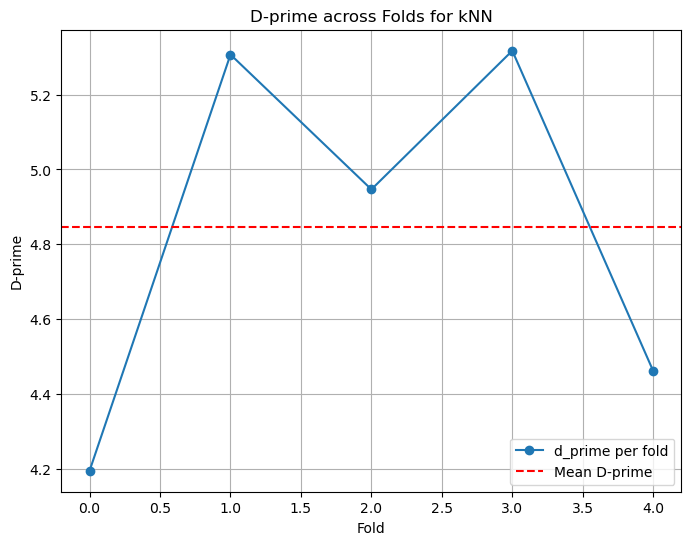

In [106]:
print("\nEvaluating Voice-Only System...")
voice_metrics = train_and_evaluate_with_cv(X_voices_aligned, y_voices_aligned, n_splits=5)

Multimodal Evaluation - Evaluating with both the Face data and Voice data


Evaluating Multimodal System...

Evaluating Random Forest with 5-fold cross-validation...

Classification Report for Fold:
              precision    recall  f1-score   support

           0       0.94      0.94      0.94        17
           1       0.94      0.94      0.94        17
          10       1.00      1.00      1.00        17
          11       0.94      1.00      0.97        17
          12       1.00      1.00      1.00        18
          13       0.94      0.94      0.94        18
          14       0.93      0.82      0.88        17
          15       0.94      0.94      0.94        18
          16       1.00      1.00      1.00        18
          17       0.90      1.00      0.95        18
          18       1.00      0.88      0.94        17
          19       1.00      0.88      0.94        17
           2       1.00      1.00      1.00        18
          20       1.00      1.00      1.00        18
          21       1.00      0.88      0.94        17
          2

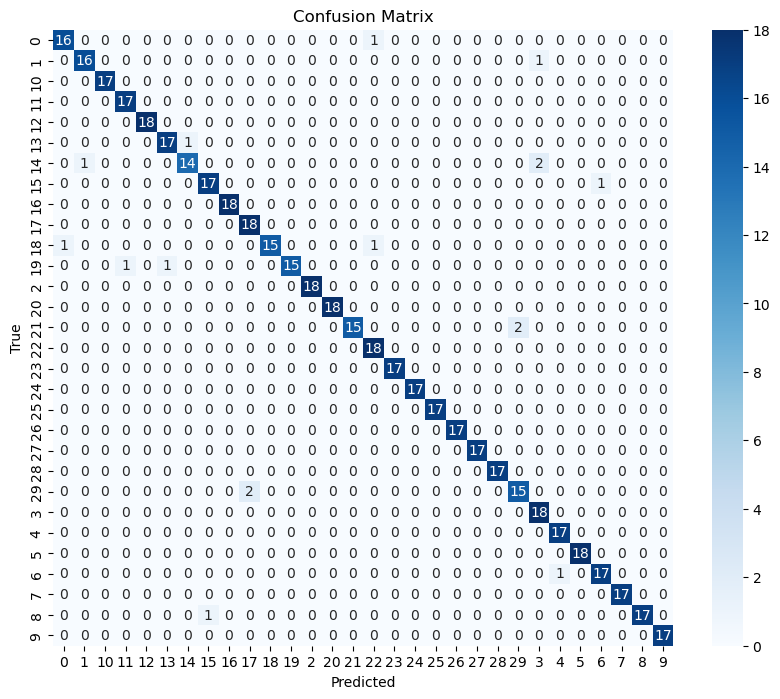

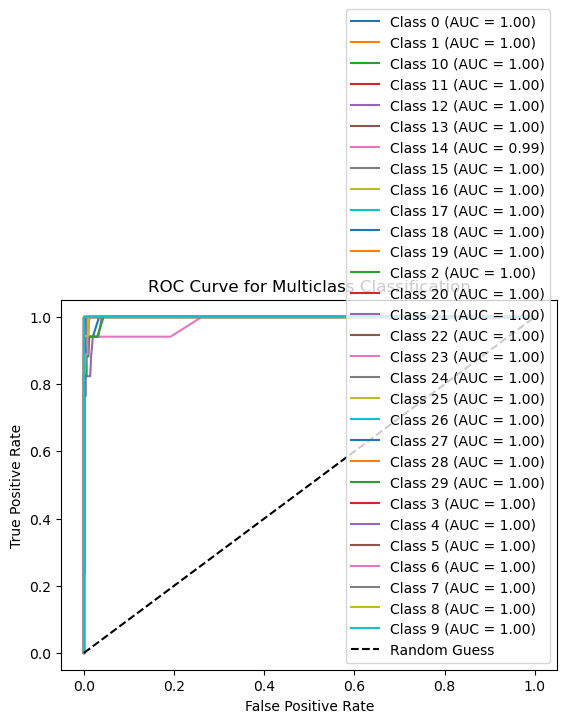

Macro-average ROC AUC: 1.00


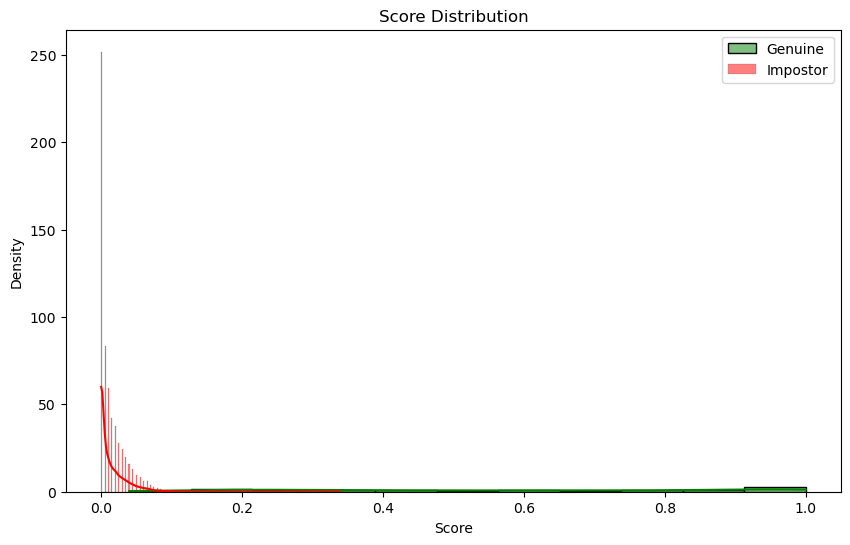


Classification Report for Fold:
              precision    recall  f1-score   support

           0       0.86      1.00      0.92        18
           1       1.00      1.00      1.00        18
          10       1.00      1.00      1.00        17
          11       1.00      1.00      1.00        17
          12       1.00      0.94      0.97        18
          13       0.86      1.00      0.92        18
          14       1.00      0.71      0.83        17
          15       0.85      1.00      0.92        17
          16       1.00      1.00      1.00        17
          17       1.00      0.82      0.90        17
          18       1.00      0.94      0.97        17
          19       1.00      0.88      0.94        17
           2       1.00      1.00      1.00        18
          20       1.00      1.00      1.00        18
          21       0.94      0.94      0.94        17
          22       1.00      1.00      1.00        17
          23       1.00      1.00      1.00     

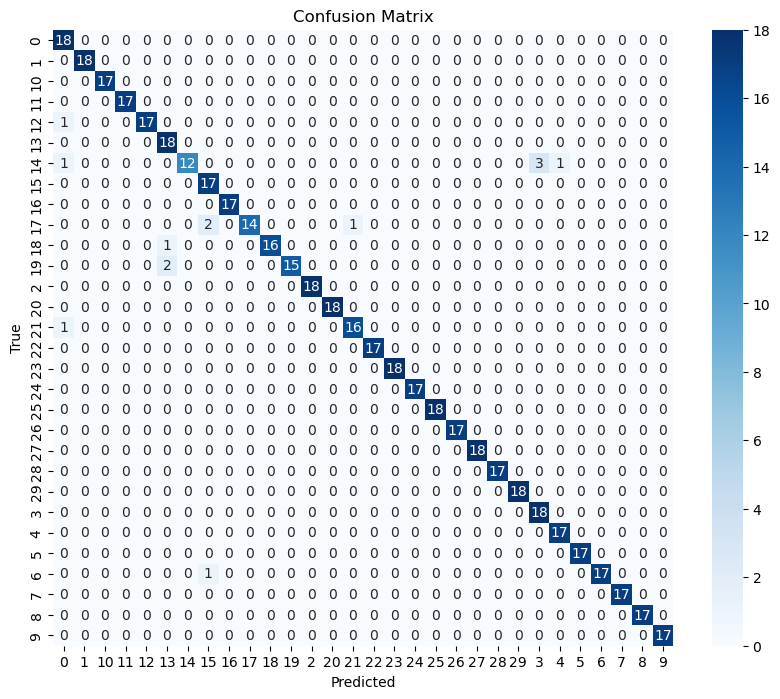

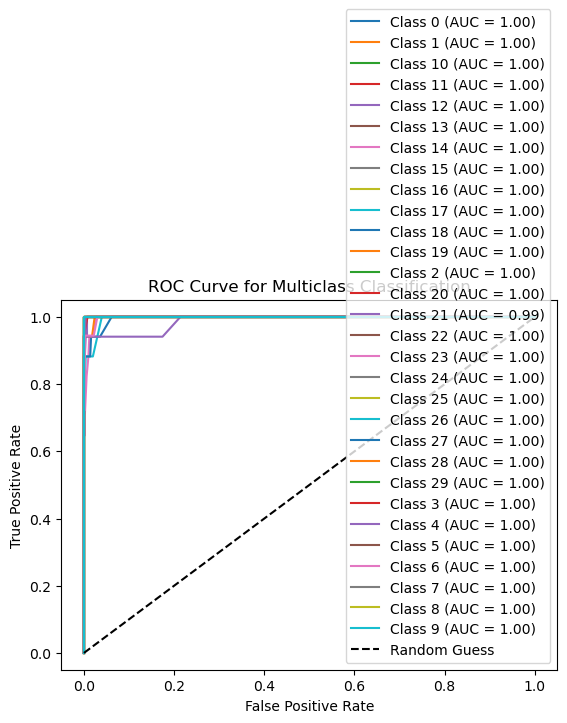

Macro-average ROC AUC: 1.00


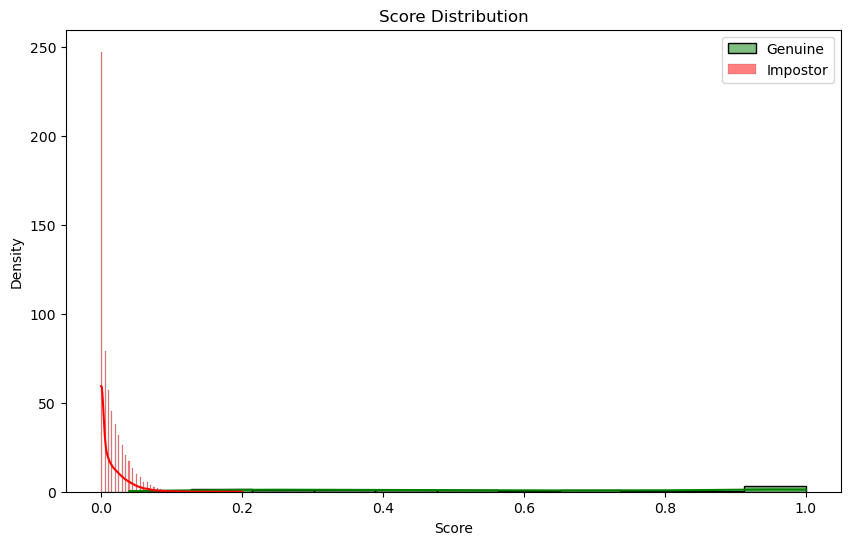


Classification Report for Fold:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        18
           1       1.00      1.00      1.00        18
          10       1.00      1.00      1.00        17
          11       1.00      1.00      1.00        17
          12       1.00      0.94      0.97        17
          13       1.00      1.00      1.00        17
          14       0.84      0.89      0.86        18
          15       1.00      1.00      1.00        17
          16       1.00      1.00      1.00        17
          17       0.94      1.00      0.97        17
          18       0.94      1.00      0.97        17
          19       1.00      0.94      0.97        18
           2       1.00      1.00      1.00        17
          20       1.00      0.94      0.97        17
          21       0.94      1.00      0.97        17
          22       0.94      0.94      0.94        17
          23       1.00      1.00      1.00     

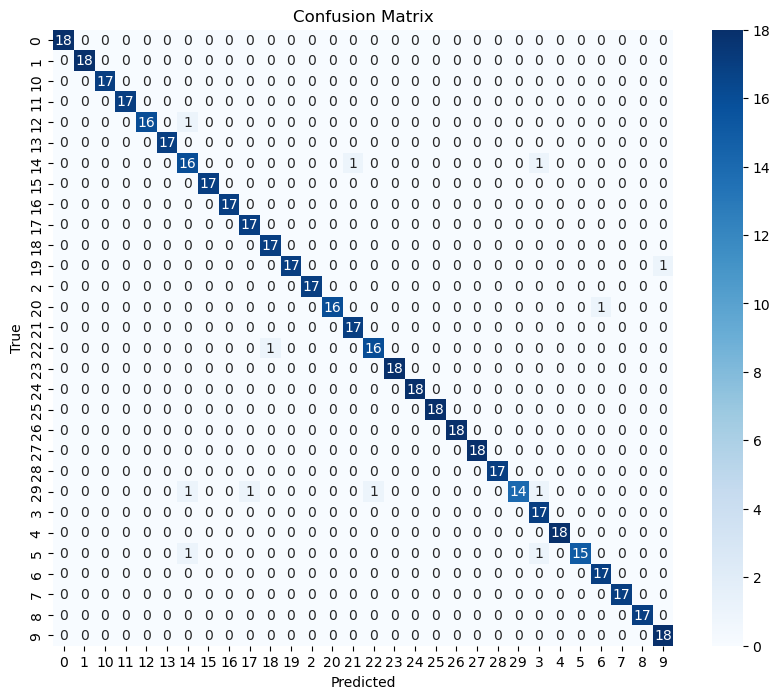

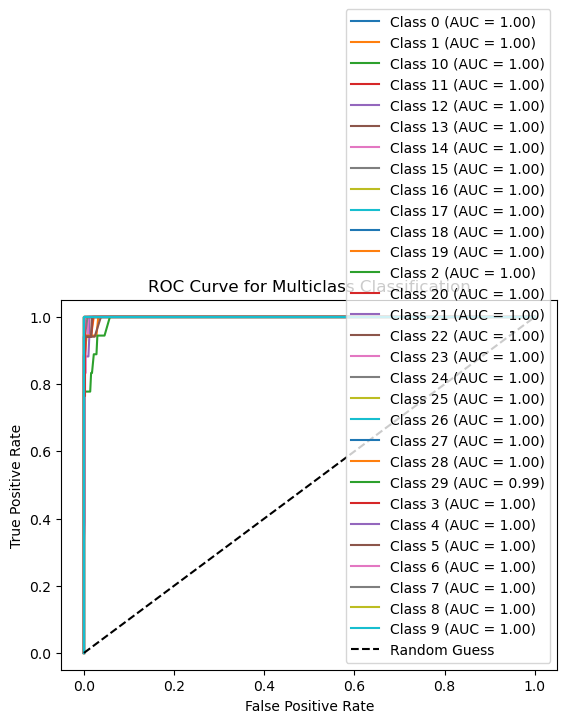

Macro-average ROC AUC: 1.00


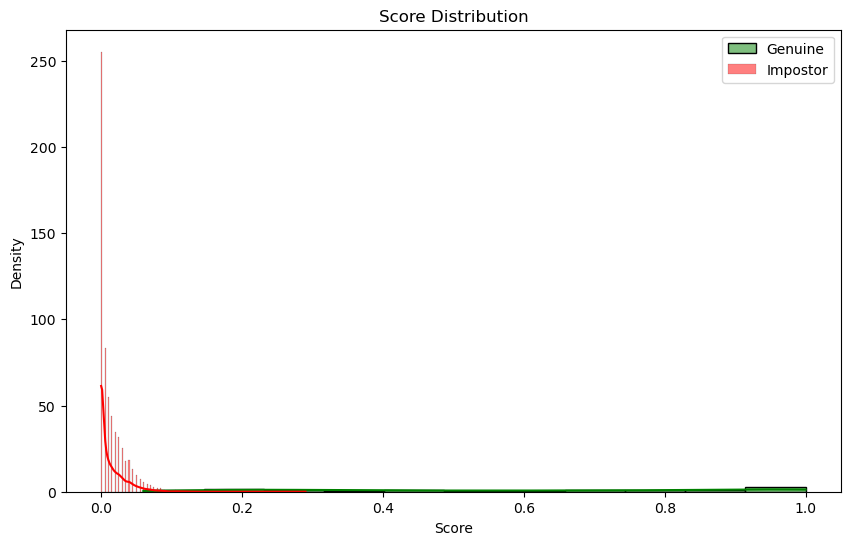


Classification Report for Fold:
              precision    recall  f1-score   support

           0       0.88      0.88      0.88        17
           1       1.00      1.00      1.00        17
          10       1.00      1.00      1.00        18
          11       1.00      1.00      1.00        18
          12       1.00      0.94      0.97        17
          13       0.94      1.00      0.97        17
          14       0.95      1.00      0.97        18
          15       1.00      1.00      1.00        17
          16       1.00      1.00      1.00        17
          17       1.00      1.00      1.00        17
          18       1.00      0.94      0.97        18
          19       1.00      0.83      0.91        18
           2       1.00      1.00      1.00        17
          20       1.00      0.94      0.97        17
          21       1.00      1.00      1.00        18
          22       0.80      0.94      0.86        17
          23       1.00      1.00      1.00     

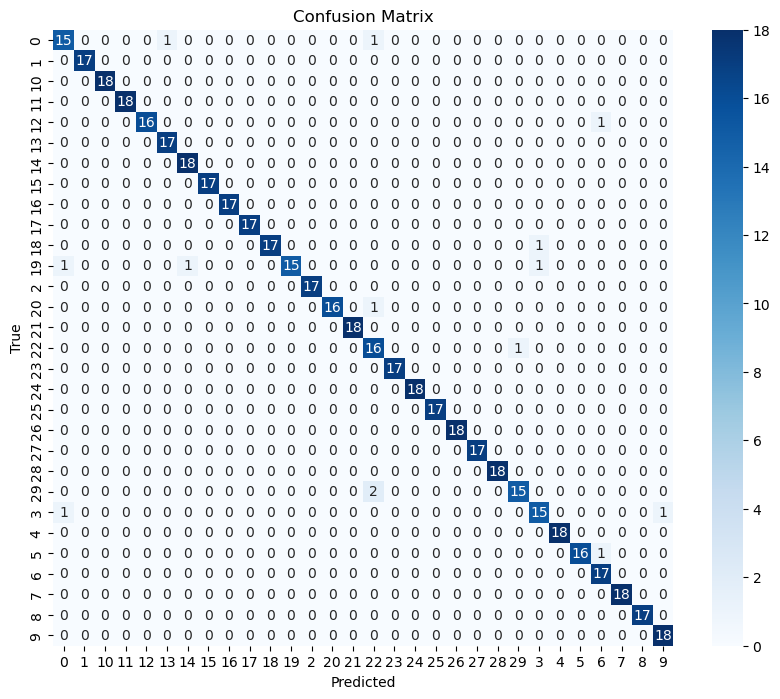

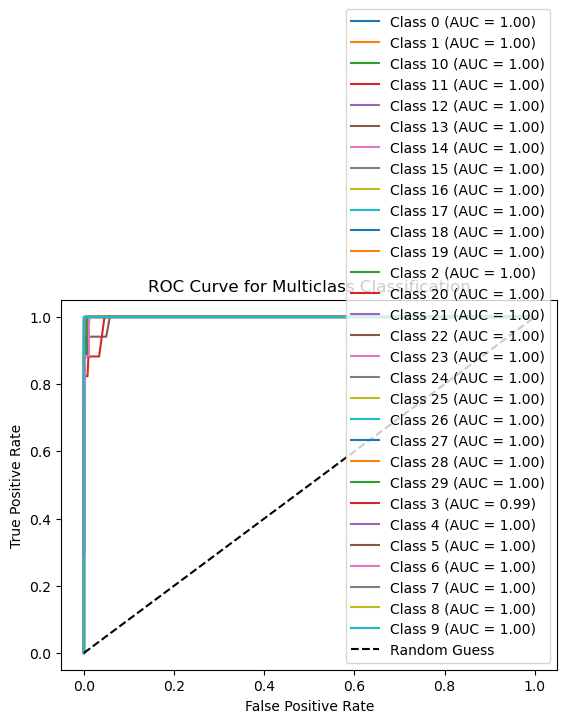

Macro-average ROC AUC: 1.00


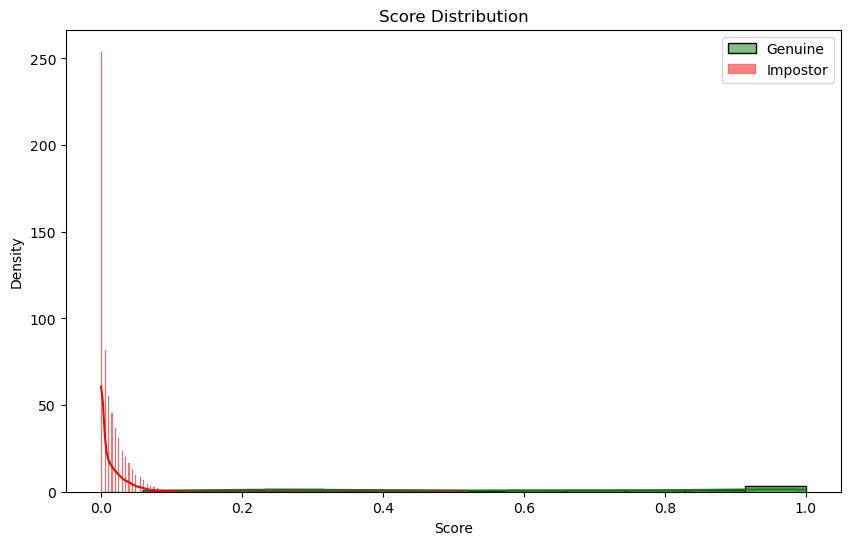


Classification Report for Fold:
              precision    recall  f1-score   support

           0       1.00      0.94      0.97        17
           1       1.00      1.00      1.00        17
          10       1.00      1.00      1.00        18
          11       1.00      1.00      1.00        18
          12       1.00      1.00      1.00        17
          13       0.94      0.88      0.91        17
          14       0.89      0.94      0.91        17
          15       0.95      1.00      0.97        18
          16       1.00      1.00      1.00        18
          17       0.94      0.94      0.94        18
          18       0.95      1.00      0.97        18
          19       1.00      0.88      0.94        17
           2       0.94      1.00      0.97        17
          20       0.89      0.94      0.91        17
          21       1.00      0.94      0.97        18
          22       1.00      0.94      0.97        18
          23       1.00      1.00      1.00     

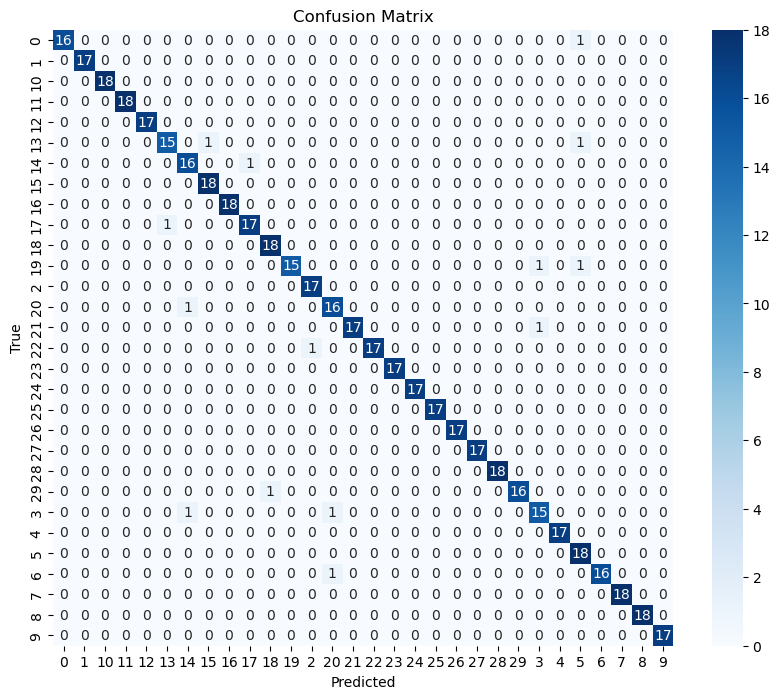

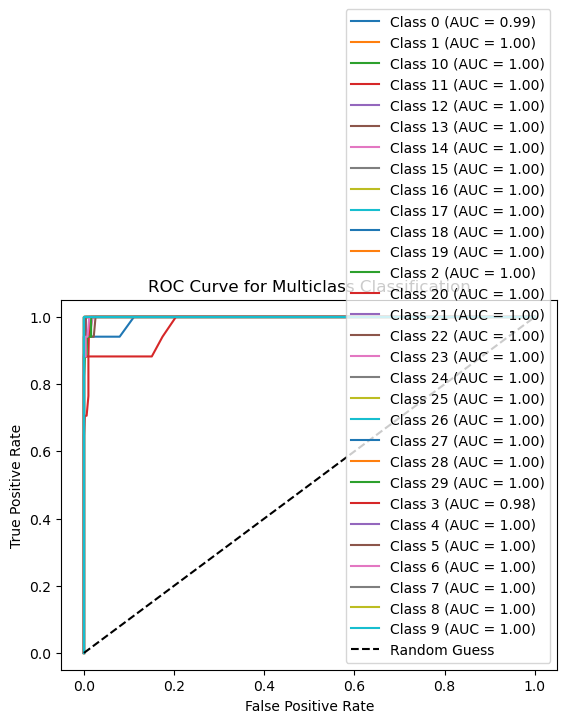

Macro-average ROC AUC: 1.00


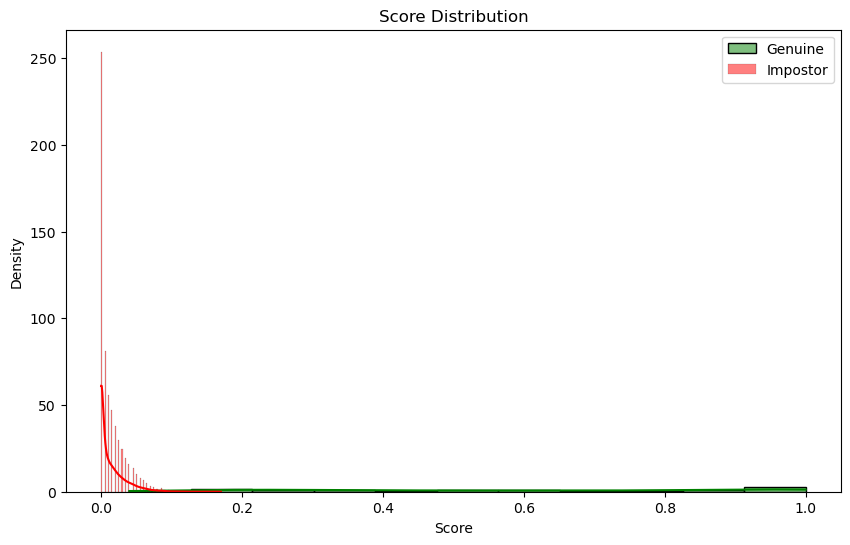


Random Forest Cross-Validation Results:
Mean Accuracy: 0.9728
Mean Macro ROC AUC: 0.9992
Mean Average EER: 0.0071
Mean D-prime: 2.5890


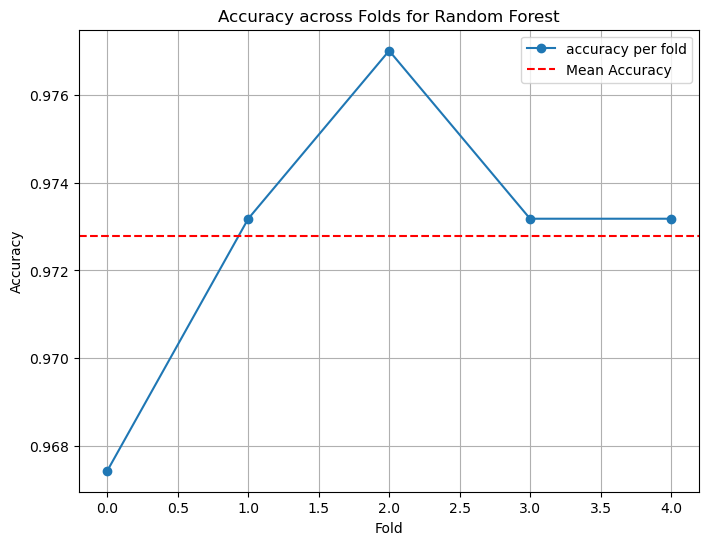

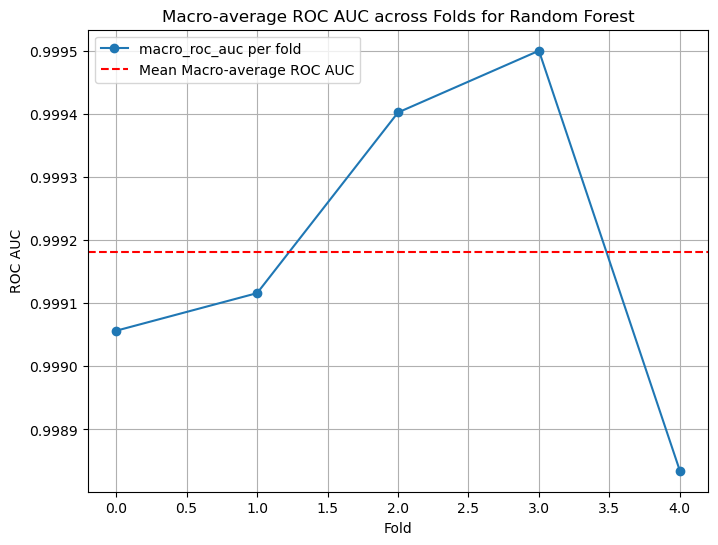

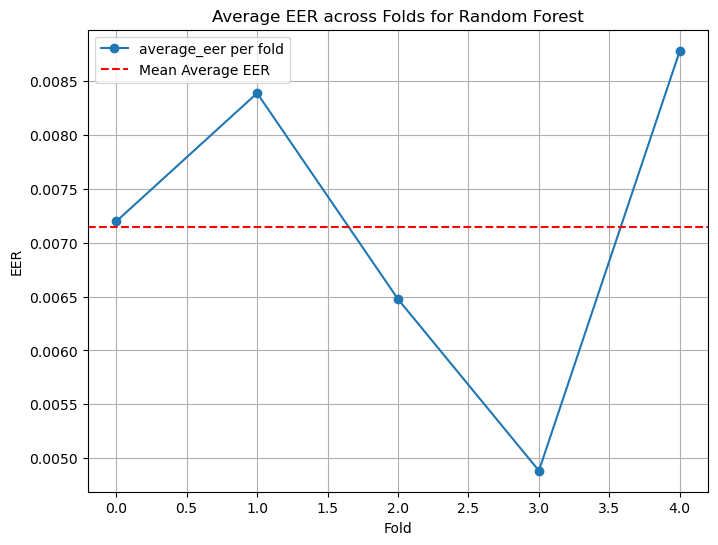

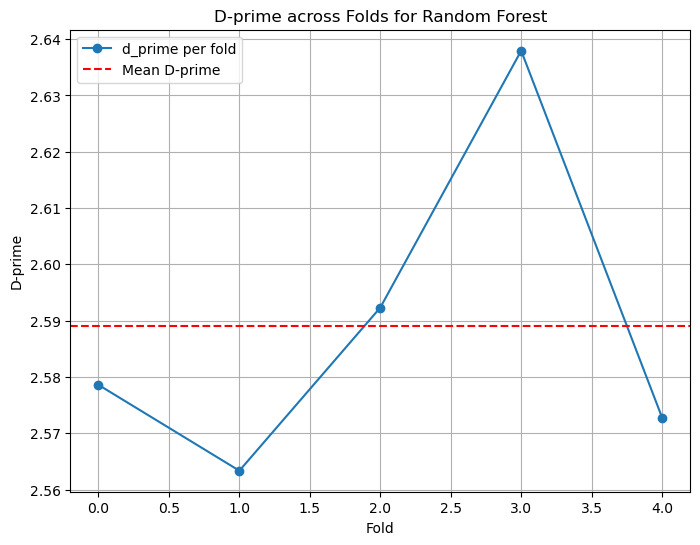


Evaluating SVM with 5-fold cross-validation...

Classification Report for Fold:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        17
           1       1.00      1.00      1.00        17
          10       1.00      1.00      1.00        17
          11       1.00      1.00      1.00        17
          12       1.00      1.00      1.00        18
          13       1.00      1.00      1.00        18
          14       1.00      1.00      1.00        17
          15       1.00      1.00      1.00        18
          16       1.00      1.00      1.00        18
          17       1.00      1.00      1.00        18
          18       1.00      1.00      1.00        17
          19       1.00      1.00      1.00        17
           2       1.00      1.00      1.00        18
          20       1.00      1.00      1.00        18
          21       1.00      1.00      1.00        17
          22       1.00      1.00      1.00        18


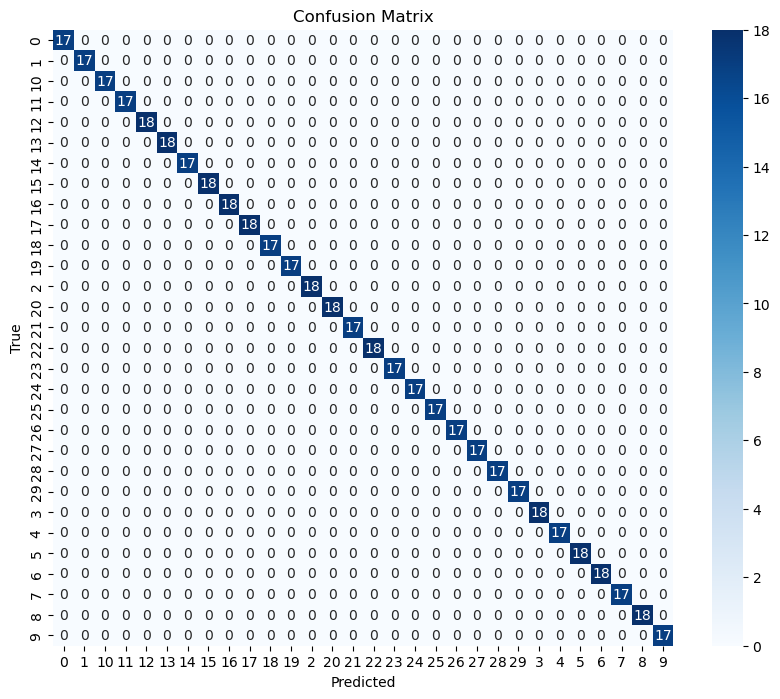

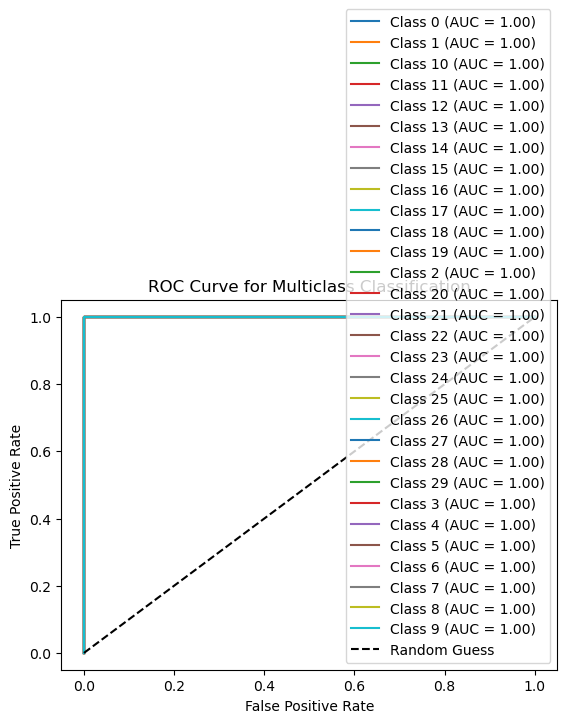

Macro-average ROC AUC: 1.00


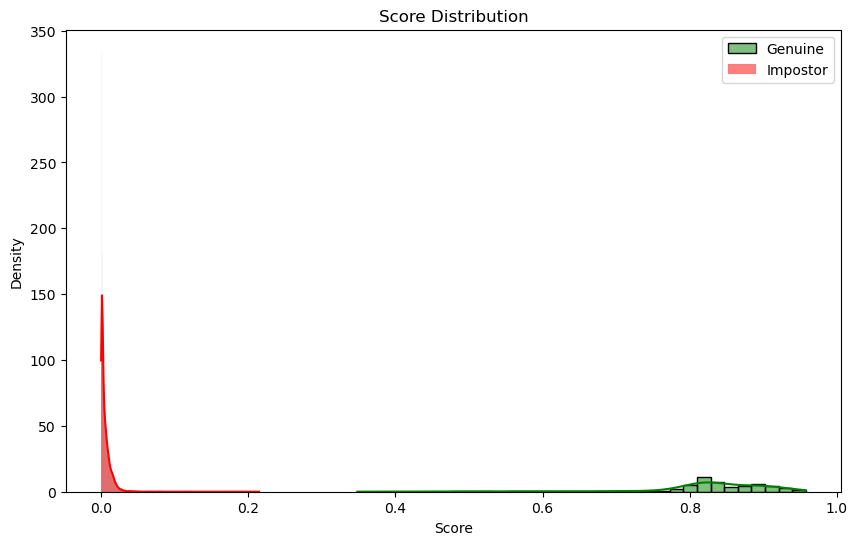


Classification Report for Fold:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        18
           1       1.00      1.00      1.00        18
          10       1.00      1.00      1.00        17
          11       1.00      1.00      1.00        17
          12       1.00      1.00      1.00        18
          13       1.00      1.00      1.00        18
          14       1.00      1.00      1.00        17
          15       1.00      1.00      1.00        17
          16       1.00      1.00      1.00        17
          17       1.00      1.00      1.00        17
          18       1.00      1.00      1.00        17
          19       1.00      1.00      1.00        17
           2       1.00      1.00      1.00        18
          20       1.00      1.00      1.00        18
          21       1.00      1.00      1.00        17
          22       1.00      1.00      1.00        17
          23       1.00      1.00      1.00     

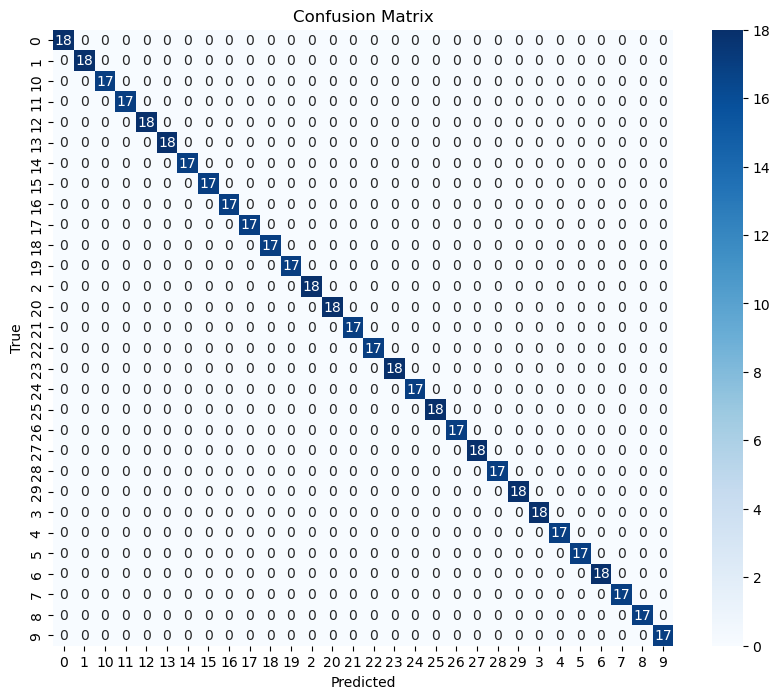

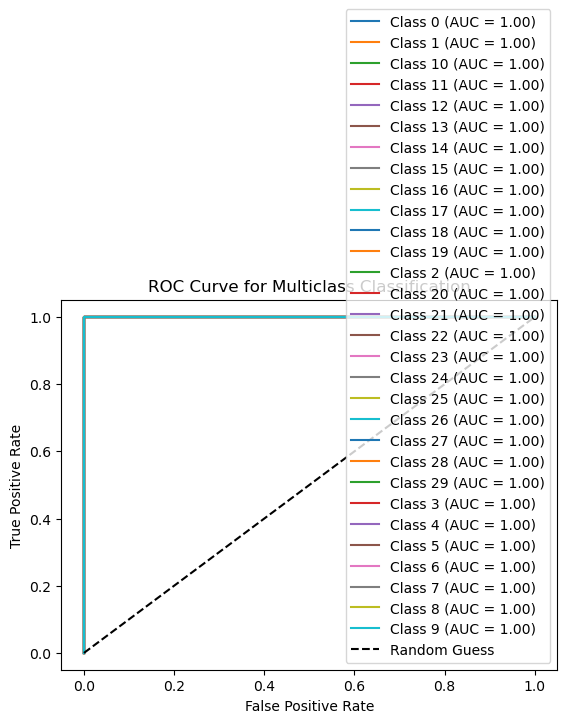

Macro-average ROC AUC: 1.00


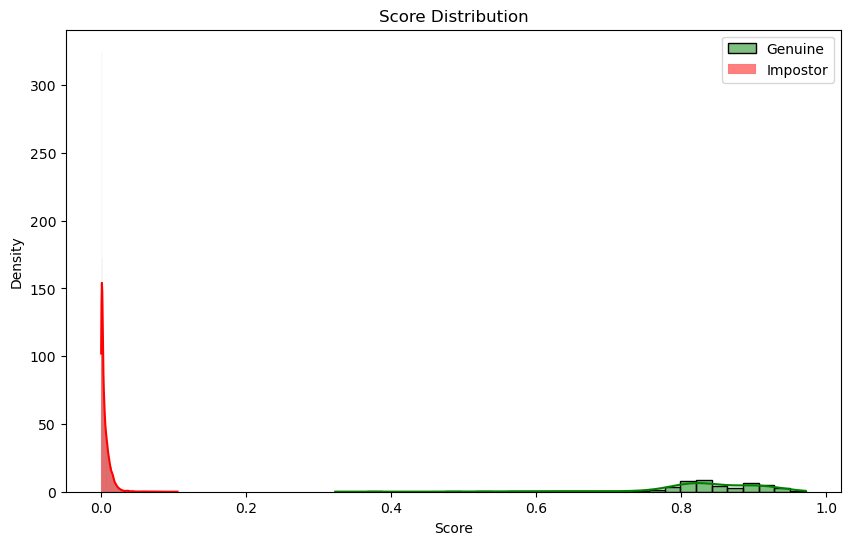


Classification Report for Fold:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        18
           1       1.00      1.00      1.00        18
          10       1.00      1.00      1.00        17
          11       1.00      1.00      1.00        17
          12       1.00      1.00      1.00        17
          13       0.85      1.00      0.92        17
          14       0.86      1.00      0.92        18
          15       1.00      1.00      1.00        17
          16       1.00      1.00      1.00        17
          17       1.00      1.00      1.00        17
          18       1.00      1.00      1.00        17
          19       1.00      1.00      1.00        18
           2       1.00      1.00      1.00        17
          20       1.00      1.00      1.00        17
          21       1.00      1.00      1.00        17
          22       1.00      0.94      0.97        17
          23       1.00      1.00      1.00     

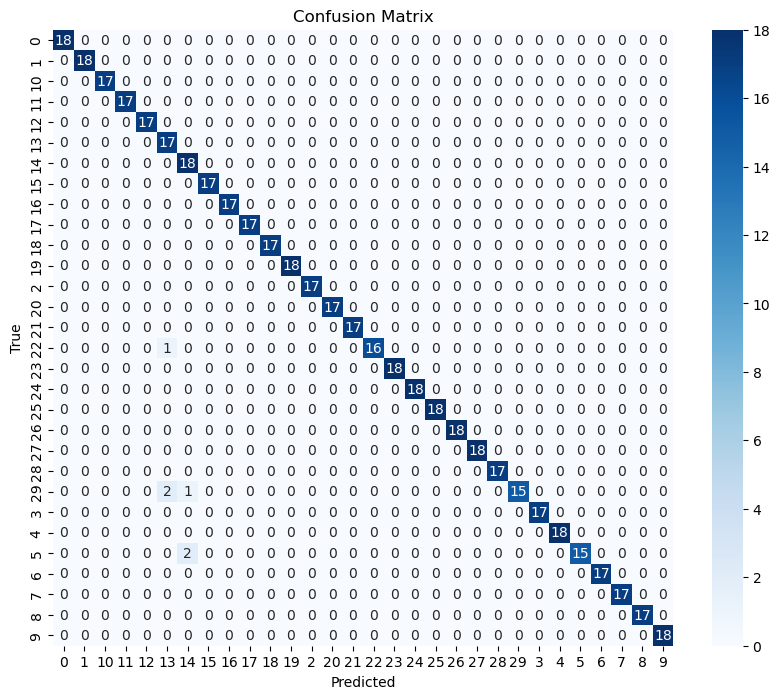

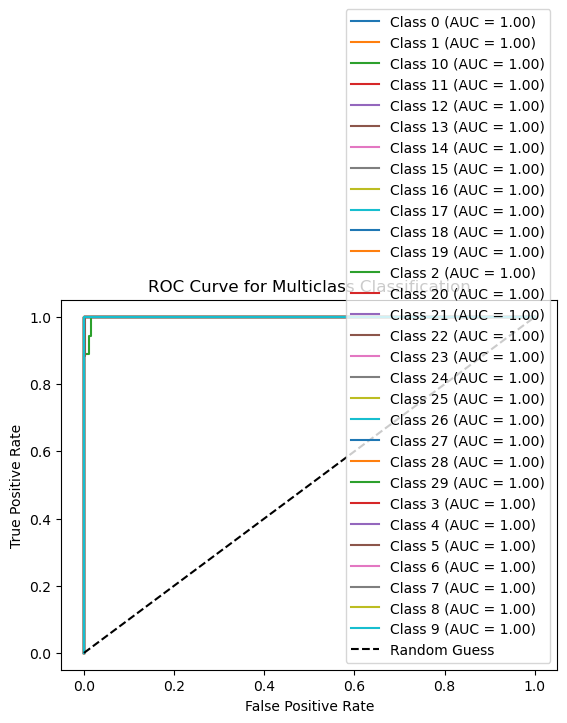

Macro-average ROC AUC: 1.00


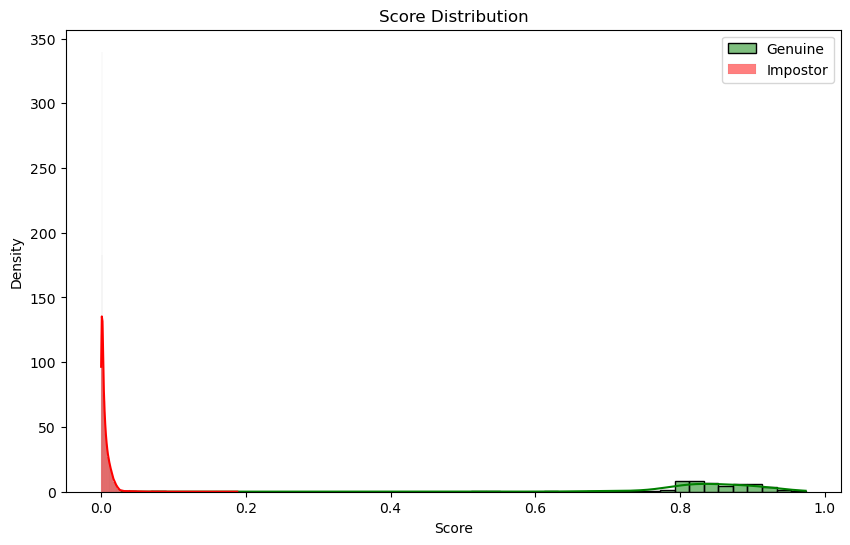


Classification Report for Fold:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        17
           1       1.00      1.00      1.00        17
          10       1.00      1.00      1.00        18
          11       1.00      1.00      1.00        18
          12       1.00      1.00      1.00        17
          13       1.00      1.00      1.00        17
          14       1.00      1.00      1.00        18
          15       1.00      1.00      1.00        17
          16       1.00      1.00      1.00        17
          17       1.00      1.00      1.00        17
          18       1.00      0.94      0.97        18
          19       1.00      1.00      1.00        18
           2       1.00      1.00      1.00        17
          20       1.00      1.00      1.00        17
          21       1.00      1.00      1.00        18
          22       1.00      1.00      1.00        17
          23       1.00      1.00      1.00     

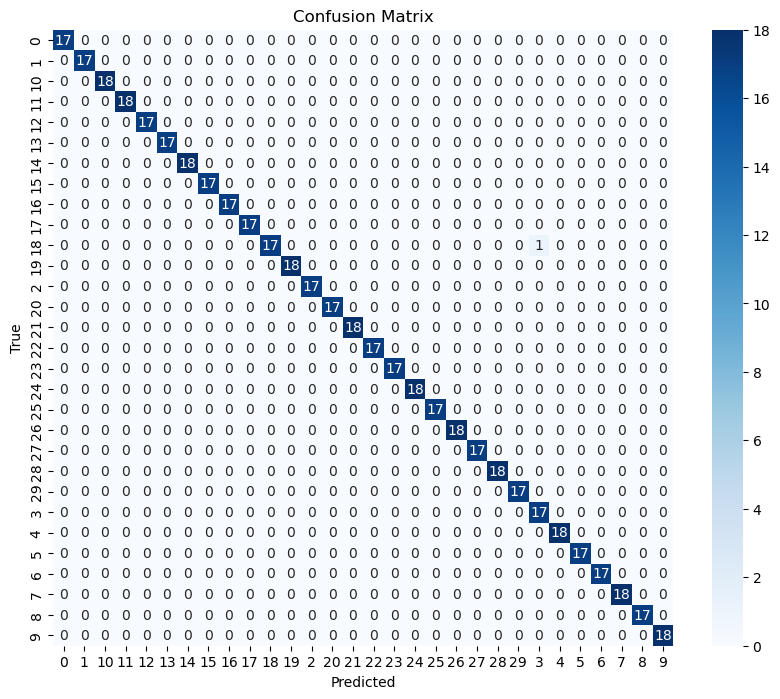

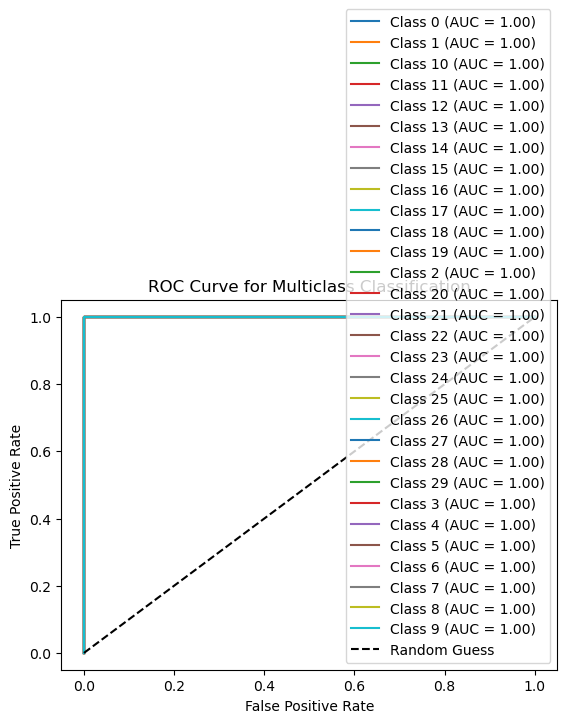

Macro-average ROC AUC: 1.00


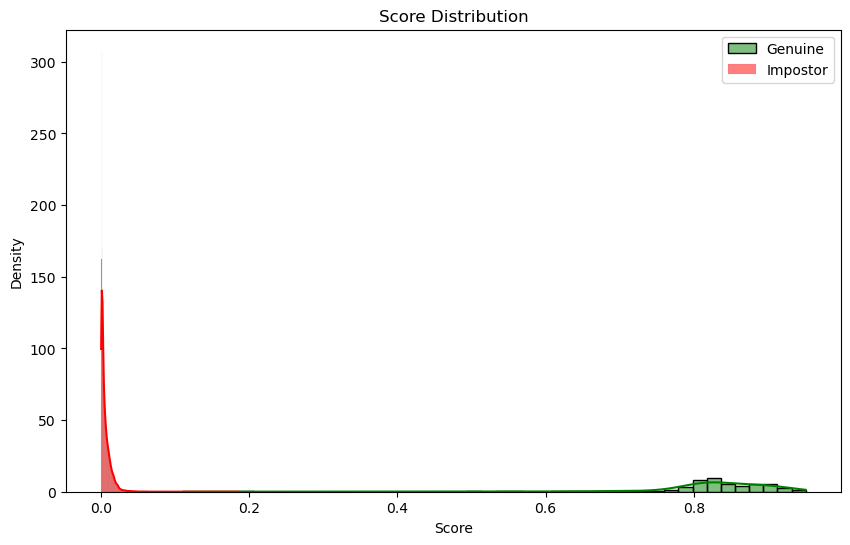


Classification Report for Fold:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        17
           1       0.94      1.00      0.97        17
          10       1.00      1.00      1.00        18
          11       1.00      1.00      1.00        18
          12       1.00      1.00      1.00        17
          13       1.00      1.00      1.00        17
          14       1.00      1.00      1.00        17
          15       1.00      1.00      1.00        18
          16       1.00      1.00      1.00        18
          17       0.95      1.00      0.97        18
          18       1.00      1.00      1.00        18
          19       1.00      1.00      1.00        17
           2       1.00      1.00      1.00        17
          20       1.00      1.00      1.00        17
          21       1.00      1.00      1.00        18
          22       1.00      1.00      1.00        18
          23       1.00      1.00      1.00     

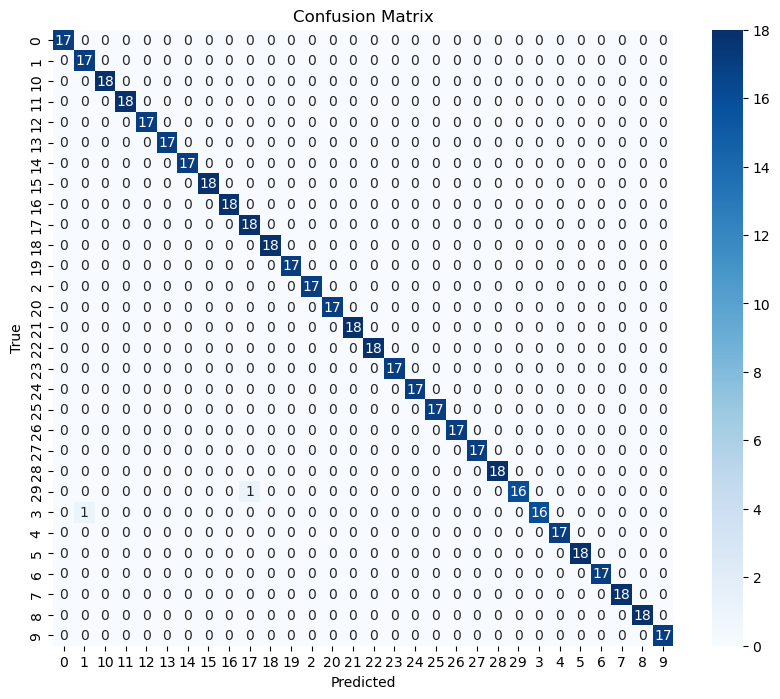

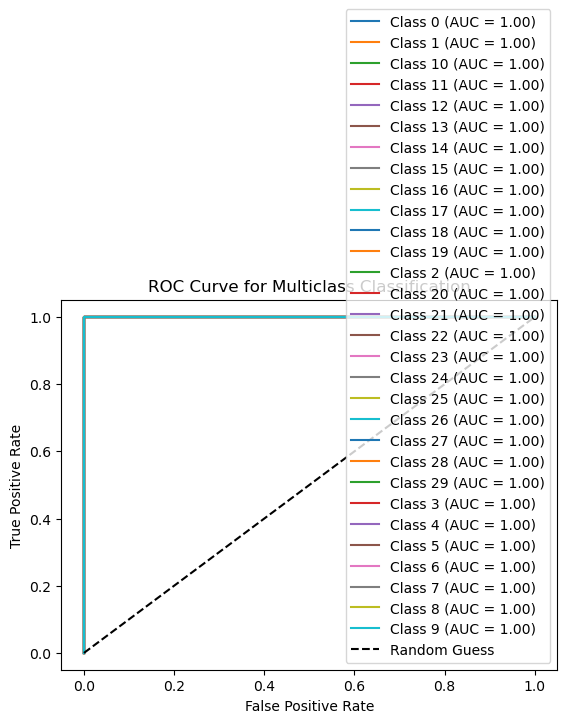

Macro-average ROC AUC: 1.00


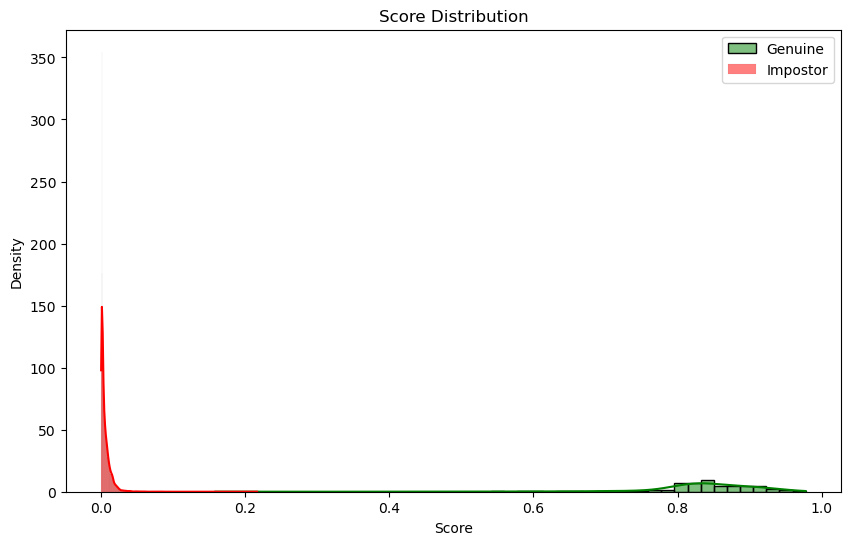


SVM Cross-Validation Results:
Mean Accuracy: 0.9966
Mean Macro ROC AUC: 1.0000
Mean Average EER: 0.0001
Mean D-prime: 12.2252


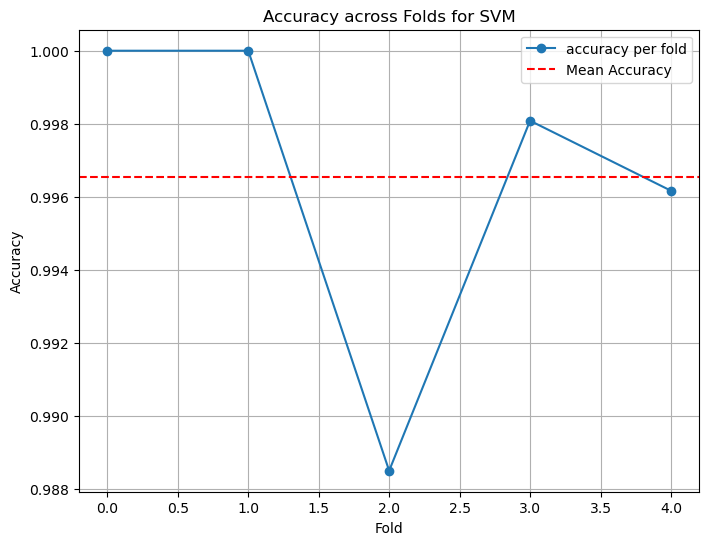

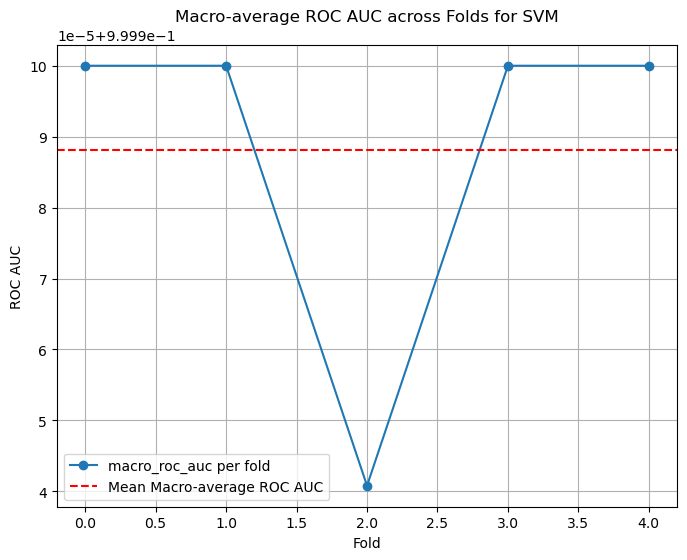

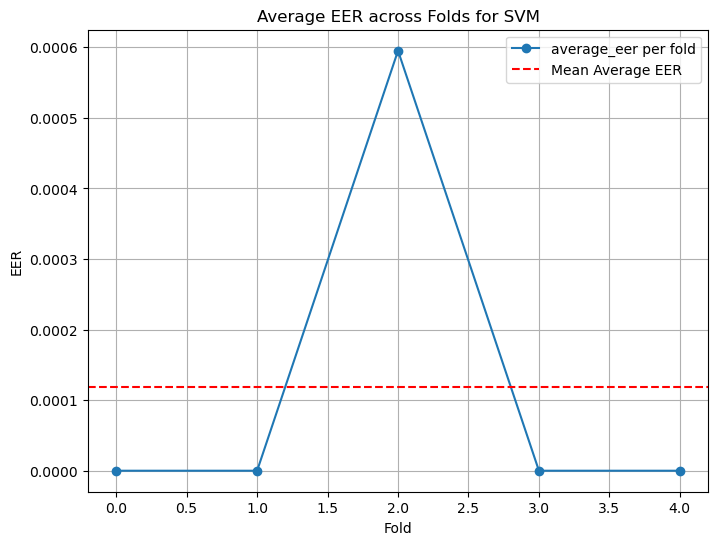

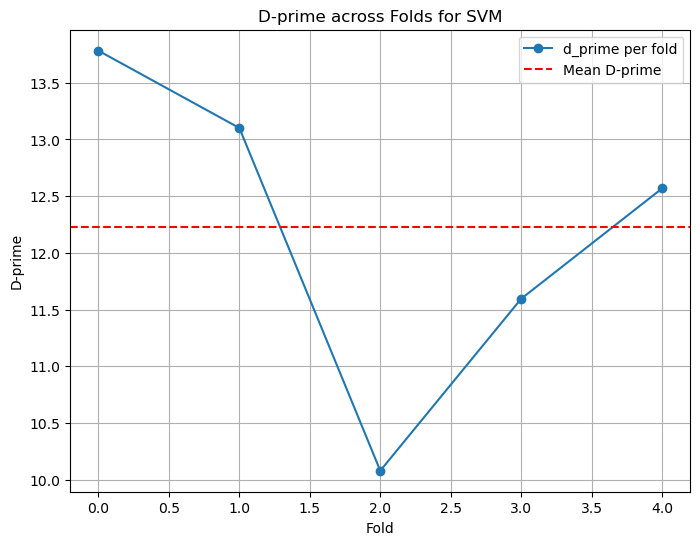


Evaluating kNN with 5-fold cross-validation...

Classification Report for Fold:
              precision    recall  f1-score   support

           0       0.52      0.82      0.64        17
           1       0.78      0.82      0.80        17
          10       0.85      1.00      0.92        17
          11       1.00      1.00      1.00        17
          12       0.94      0.89      0.91        18
          13       1.00      0.78      0.88        18
          14       0.93      0.76      0.84        17
          15       0.48      0.78      0.60        18
          16       0.82      1.00      0.90        18
          17       1.00      0.83      0.91        18
          18       1.00      0.47      0.64        17
          19       1.00      0.41      0.58        17
           2       0.69      1.00      0.82        18
          20       1.00      0.83      0.91        18
          21       0.45      0.59      0.51        17
          22       0.93      0.78      0.85        18


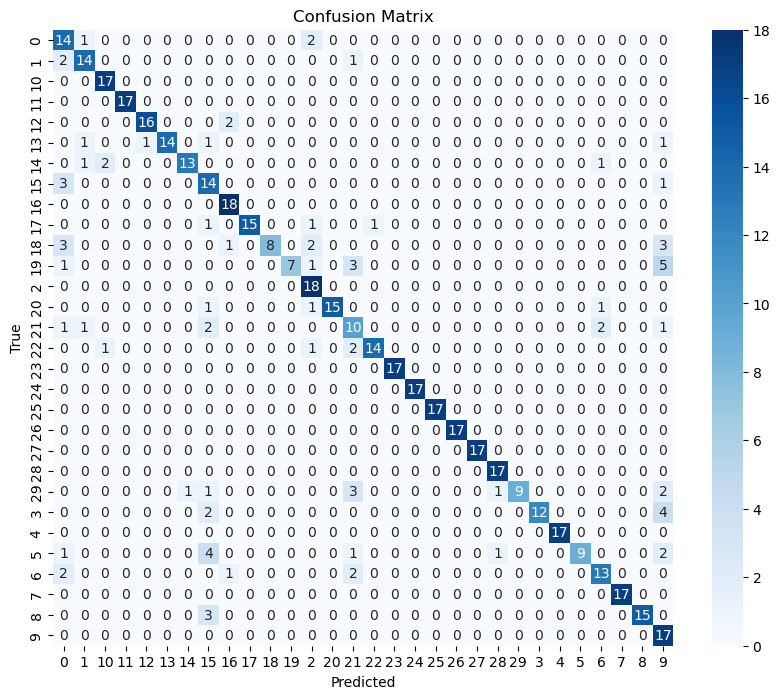

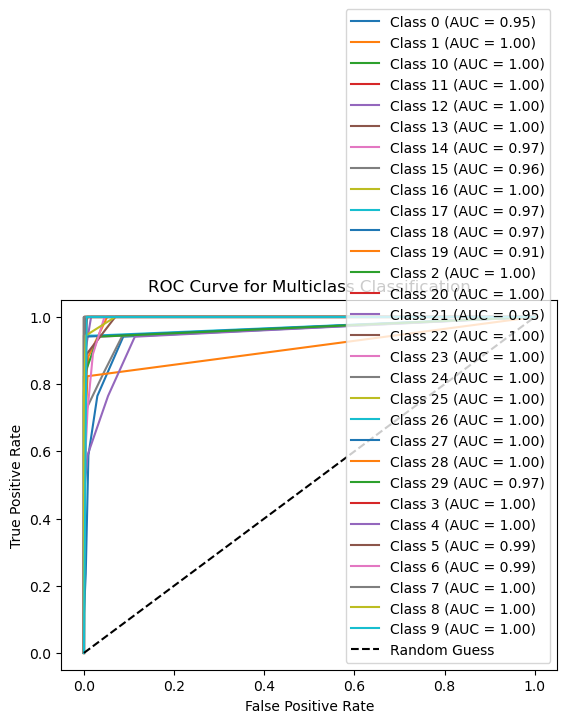

Macro-average ROC AUC: 0.99


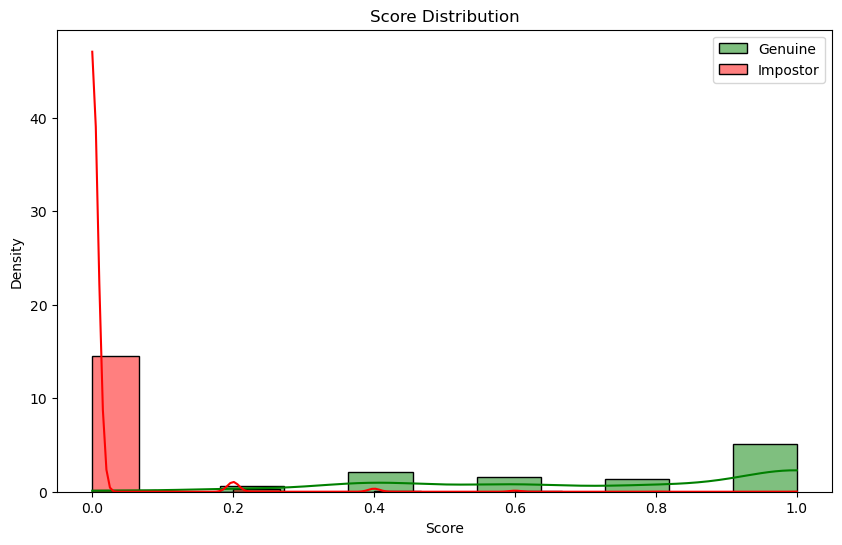


Classification Report for Fold:
              precision    recall  f1-score   support

           0       0.62      0.72      0.67        18
           1       0.83      0.83      0.83        18
          10       0.85      1.00      0.92        17
          11       0.94      1.00      0.97        17
          12       1.00      0.83      0.91        18
          13       0.87      0.72      0.79        18
          14       1.00      0.59      0.74        17
          15       0.73      0.94      0.82        17
          16       0.94      1.00      0.97        17
          17       1.00      0.82      0.90        17
          18       1.00      0.59      0.74        17
          19       1.00      0.35      0.52        17
           2       0.55      1.00      0.71        18
          20       1.00      0.78      0.88        18
          21       0.65      0.88      0.75        17
          22       1.00      0.71      0.83        17
          23       1.00      1.00      1.00     

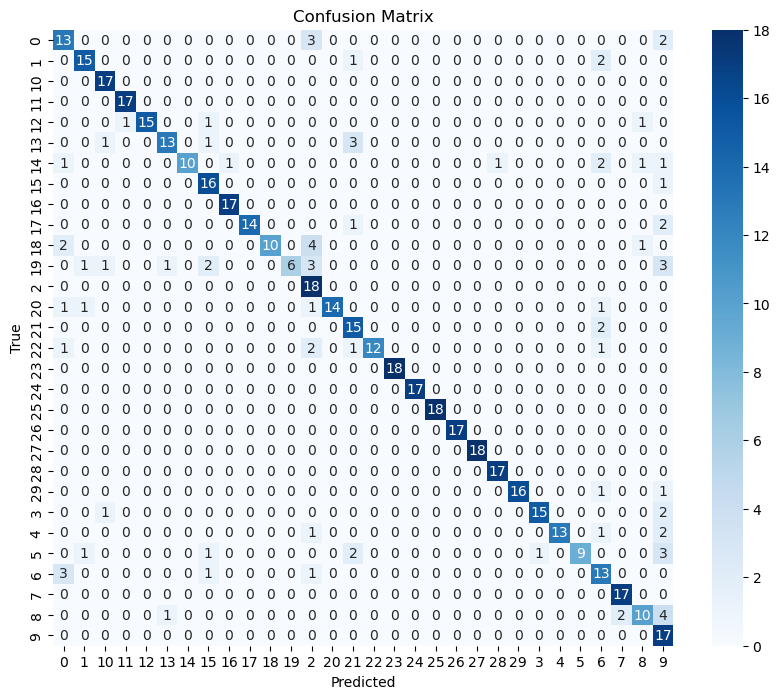

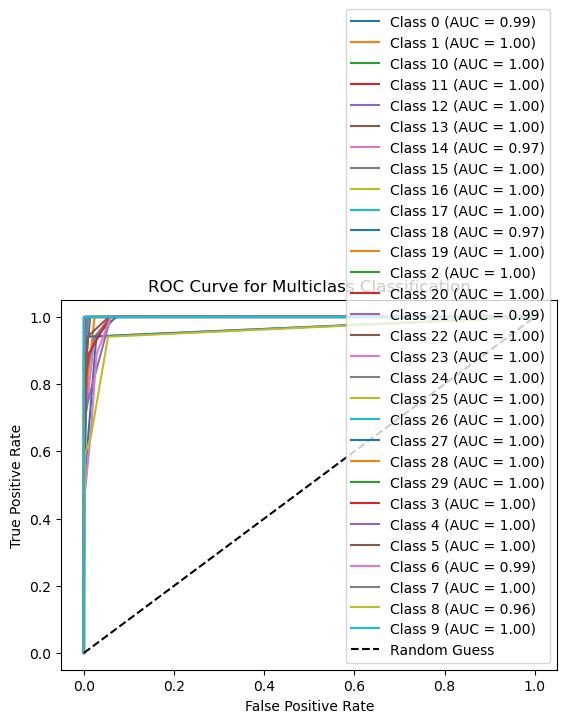

Macro-average ROC AUC: 0.99


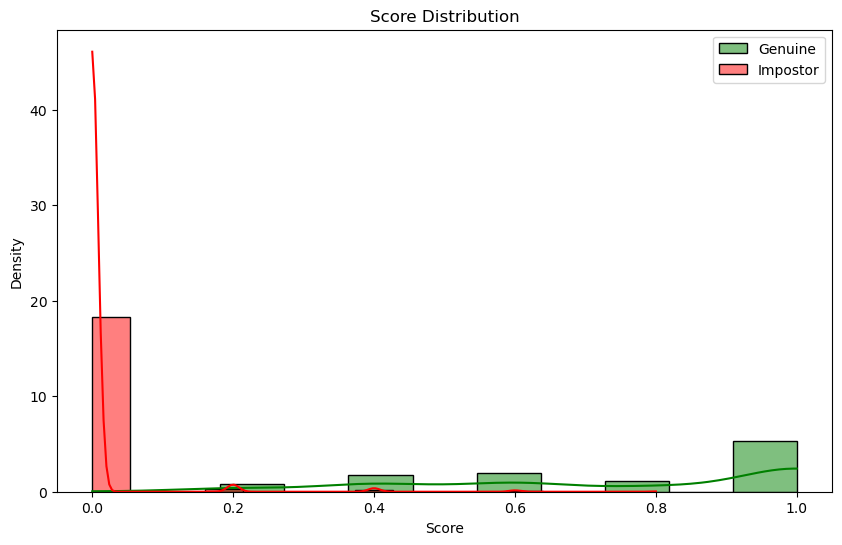


Classification Report for Fold:
              precision    recall  f1-score   support

           0       0.70      0.89      0.78        18
           1       0.76      0.72      0.74        18
          10       0.89      1.00      0.94        17
          11       1.00      1.00      1.00        17
          12       1.00      0.88      0.94        17
          13       0.78      0.82      0.80        17
          14       0.75      0.50      0.60        18
          15       0.54      0.76      0.63        17
          16       0.89      1.00      0.94        17
          17       0.94      0.94      0.94        17
          18       1.00      0.59      0.74        17
          19       1.00      0.33      0.50        18
           2       0.77      1.00      0.87        17
          20       1.00      0.71      0.83        17
          21       0.73      0.94      0.82        17
          22       1.00      0.82      0.90        17
          23       0.86      1.00      0.92     

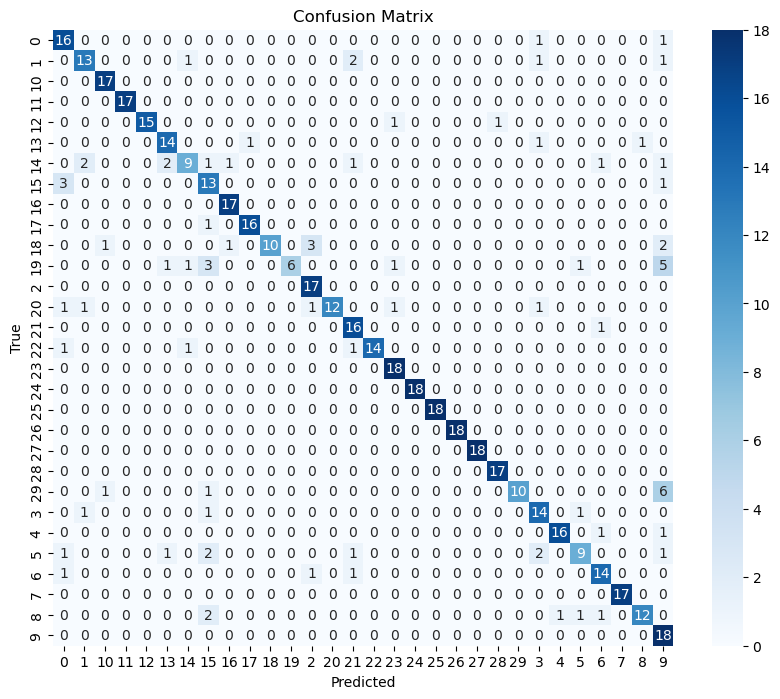

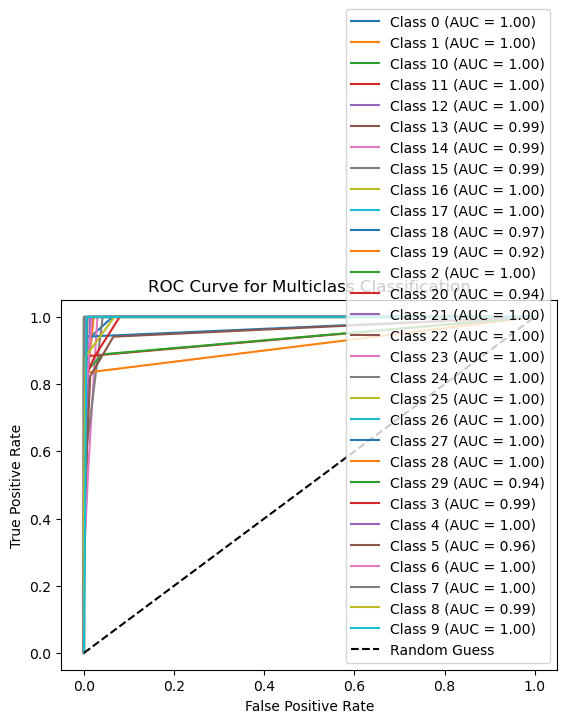

Macro-average ROC AUC: 0.99


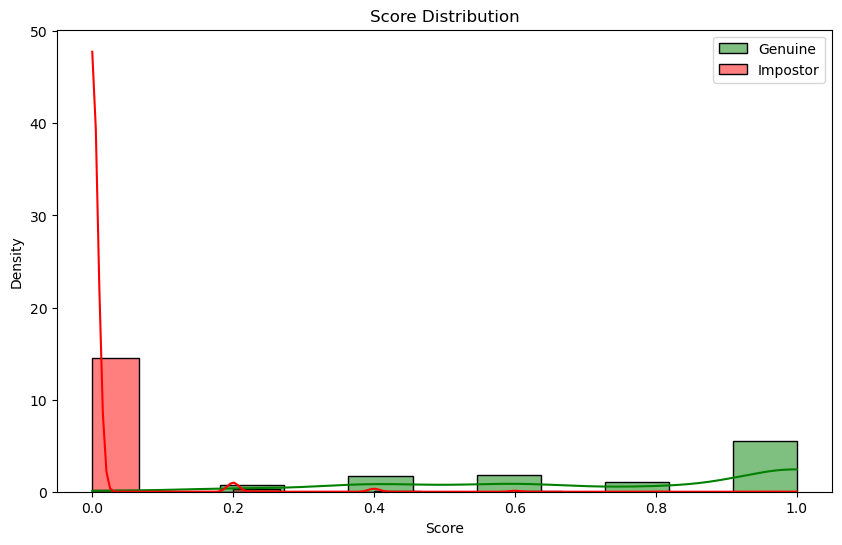


Classification Report for Fold:
              precision    recall  f1-score   support

           0       0.54      0.88      0.67        17
           1       0.88      0.82      0.85        17
          10       1.00      1.00      1.00        18
          11       0.95      1.00      0.97        18
          12       0.92      0.71      0.80        17
          13       0.88      0.82      0.85        17
          14       1.00      0.72      0.84        18
          15       0.59      0.94      0.73        17
          16       0.81      1.00      0.89        17
          17       1.00      0.82      0.90        17
          18       1.00      0.83      0.91        18
          19       1.00      0.39      0.56        18
           2       0.61      1.00      0.76        17
          20       1.00      0.76      0.87        17
          21       0.84      0.89      0.86        18
          22       1.00      0.53      0.69        17
          23       1.00      1.00      1.00     

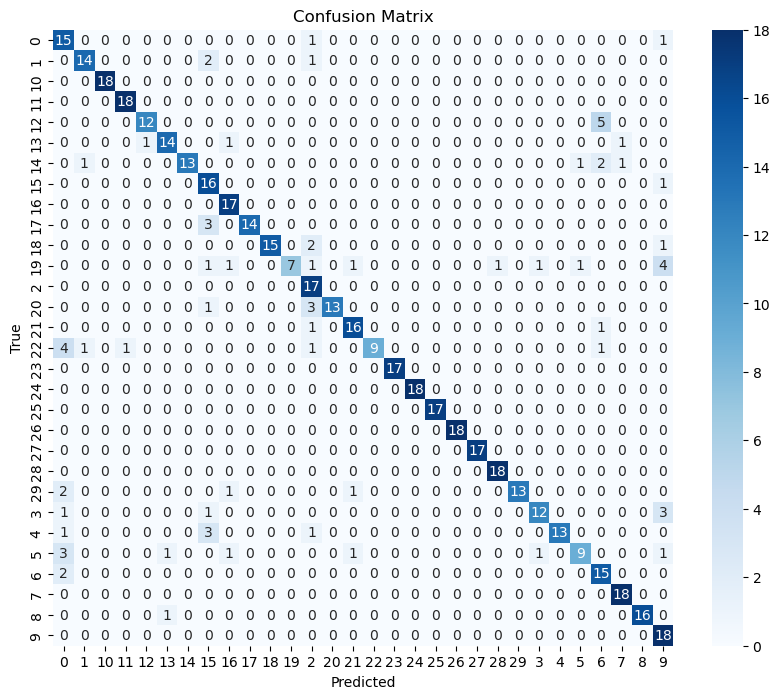

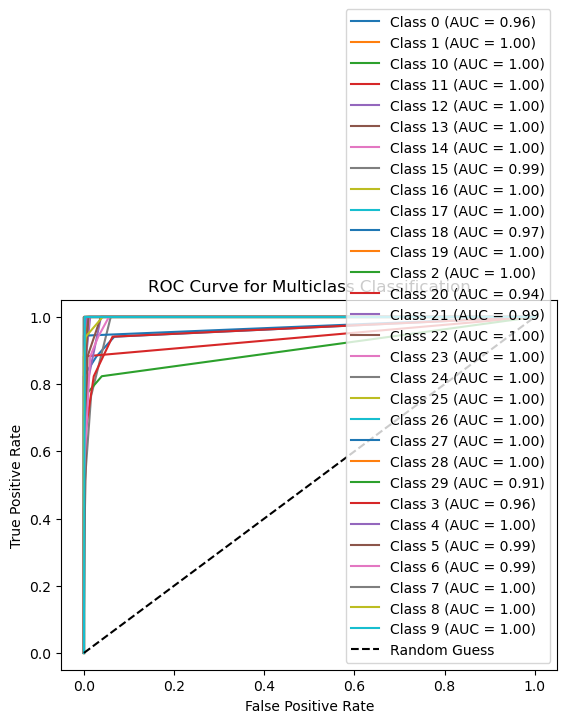

Macro-average ROC AUC: 0.99


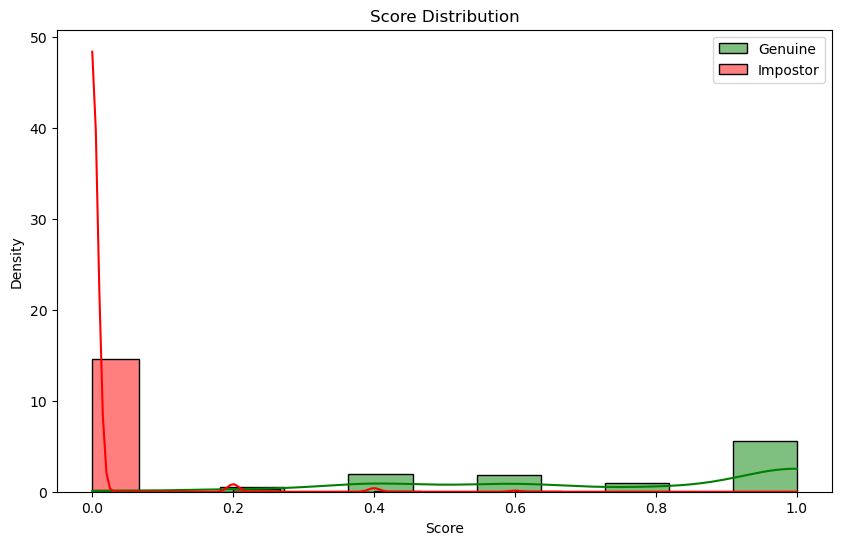


Classification Report for Fold:
              precision    recall  f1-score   support

           0       0.62      0.76      0.68        17
           1       0.80      0.94      0.86        17
          10       0.95      1.00      0.97        18
          11       1.00      1.00      1.00        18
          12       1.00      0.82      0.90        17
          13       0.84      0.94      0.89        17
          14       0.92      0.71      0.80        17
          15       0.78      0.78      0.78        18
          16       0.95      1.00      0.97        18
          17       1.00      0.94      0.97        18
          18       1.00      0.78      0.88        18
          19       1.00      0.47      0.64        17
           2       0.74      1.00      0.85        17
          20       1.00      0.65      0.79        17
          21       0.76      0.89      0.82        18
          22       1.00      0.78      0.88        18
          23       1.00      1.00      1.00     

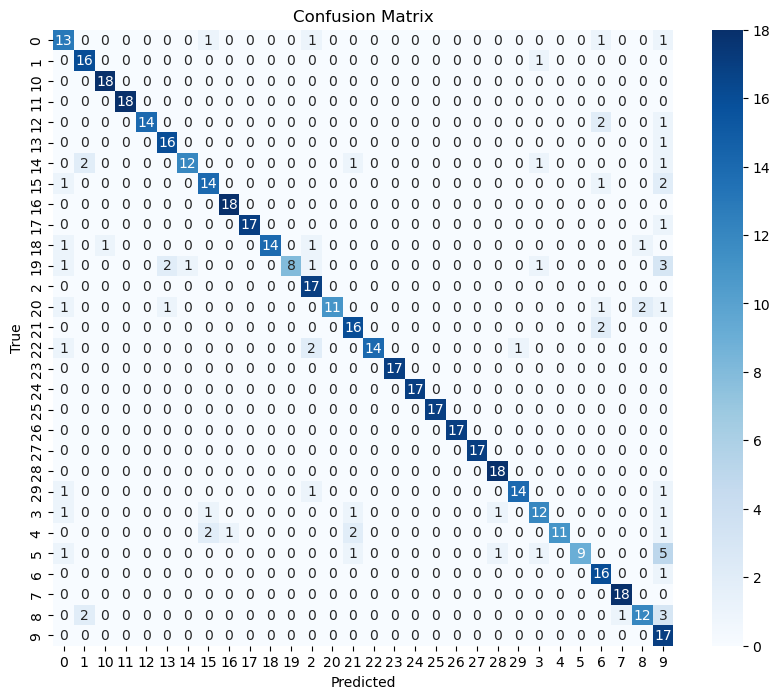

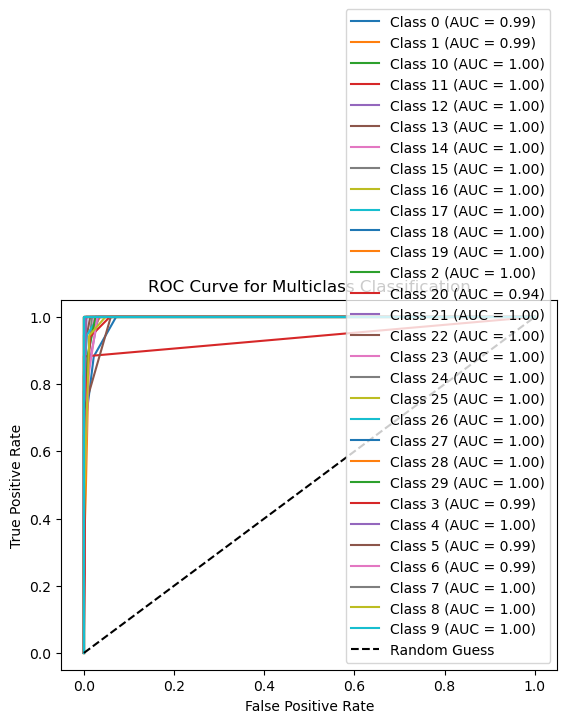

Macro-average ROC AUC: 1.00


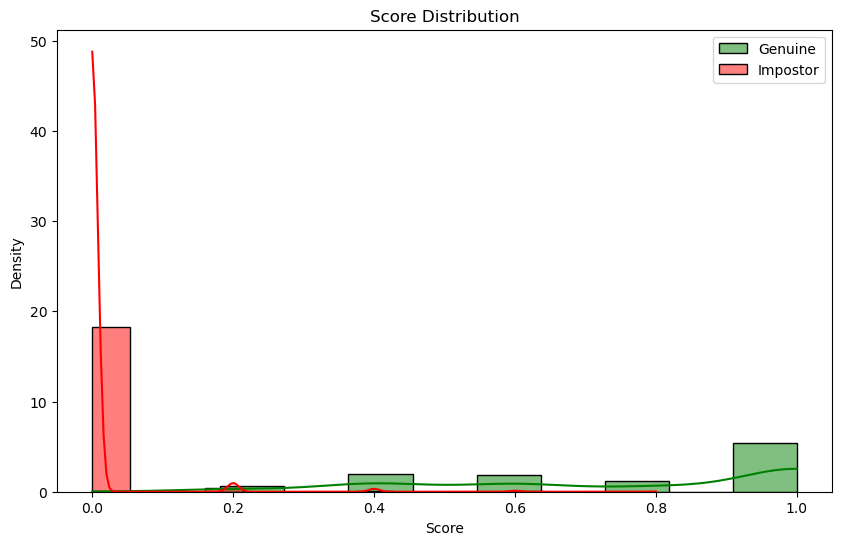


kNN Cross-Validation Results:
Mean Accuracy: 0.8452
Mean Macro ROC AUC: 0.9915
Mean Average EER: 0.0150
Mean D-prime: 3.6440


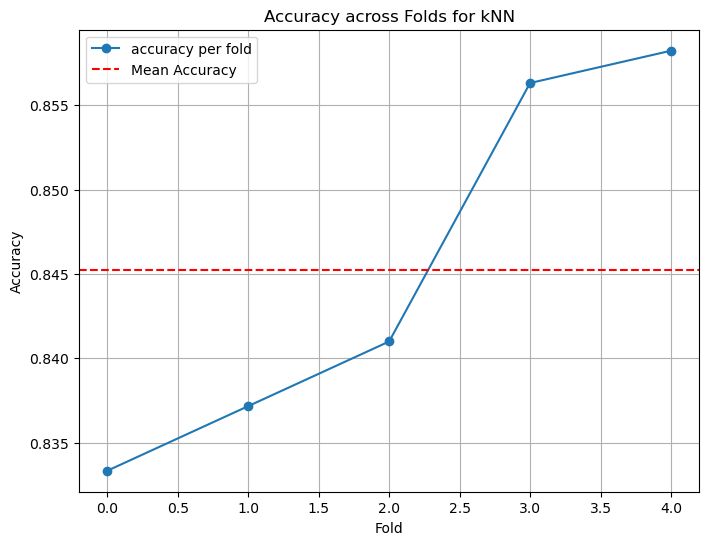

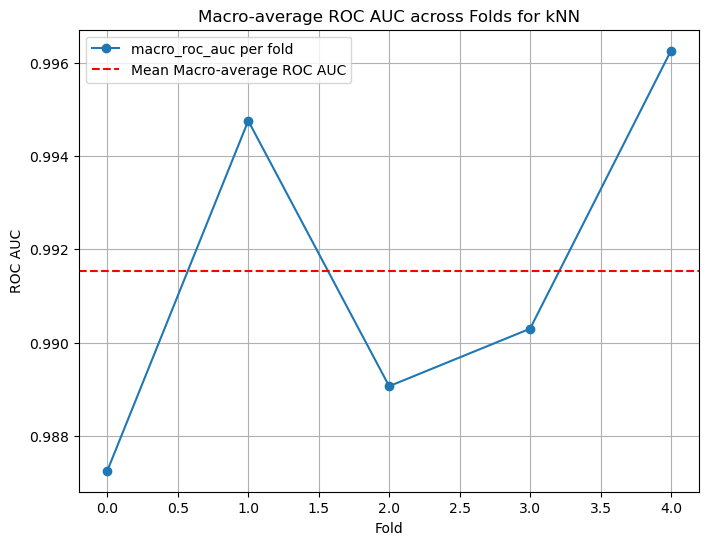

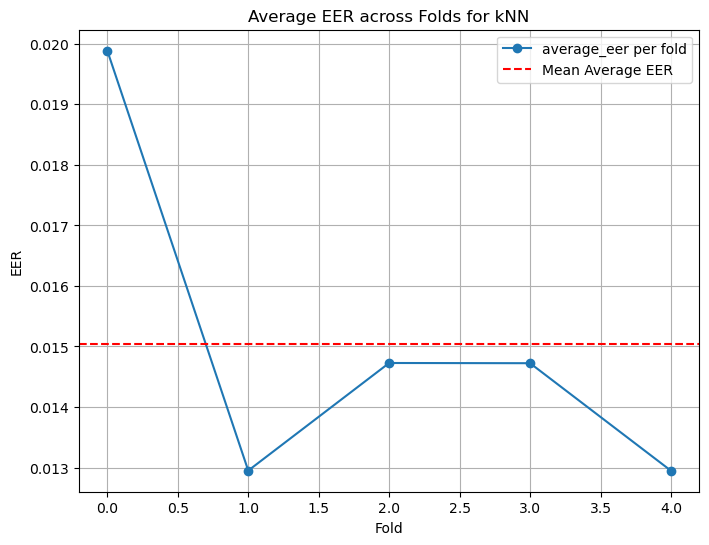

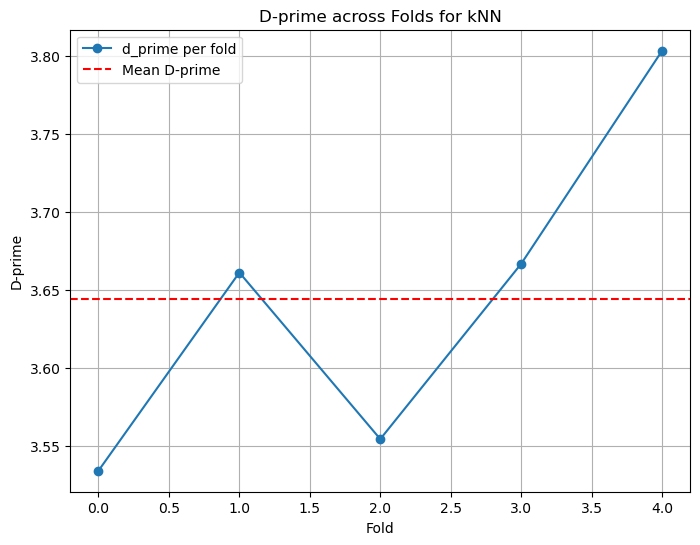

In [108]:
print("\nEvaluating Multimodal System...")
multimodal_metrics = train_and_evaluate_with_cv(X_combined, y_faces_aligned, n_splits=5) 


Performance Comparison (Unimodal vs. Multimodal):
       Metric  Face-Only  Voice-Only  Multimodal
     accuracy   0.852107    0.913793    0.845211
macro_roc_auc   0.991330    0.980485    0.991527
  average_eer   0.015087    0.009486    0.015047
      d_prime   3.630837    4.845652    3.643953


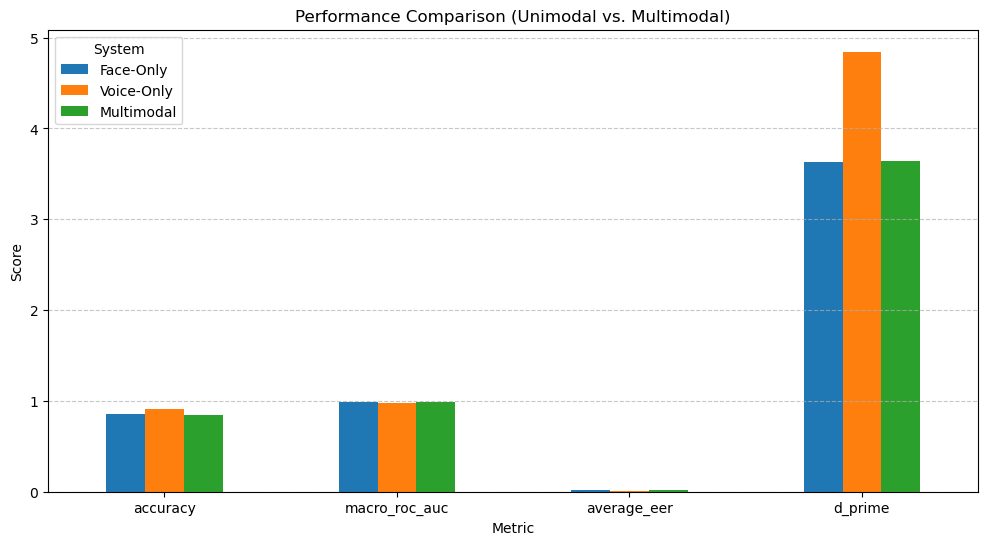

In [109]:
import pandas as pd
unimodal_metrics = {
    "Face": list(face_metrics.values()),
    "Voice": list(voice_metrics.values())
}
multimodal_values = list(multimodal_metrics.values())
metric_names = list(face_metrics.keys())

# Compare and visualize results
compare_and_visualize_results(unimodal_metrics, multimodal_values, metric_names)